# Load Modules

In [1]:
# Importing all necessary libraries

# ipython magic functions for automatic reloading coda changes in .py files
%load_ext autoreload
%autoreload 2

# internal packages
import os
import pickle
# external packages
import torch
import torchvision
import numpy as np
import sklearn
from sklearn.datasets import make_moons, make_circles
from sklearn.cluster import KMeans
from sklearn.metrics import normalized_mutual_info_score, confusion_matrix, adjusted_mutual_info_score
from scipy.optimize import linear_sum_assignment as linear_assignment
from sklearn.decomposition import PCA
import matplotlib 
from matplotlib import pyplot as plt
from scipy.spatial.distance import cdist
from sklearn.preprocessing import normalize, scale
from sklearn.linear_model import LinearRegression
import math

%matplotlib inline

# specify base paths

base_path = "material"
model_name = "autoencoder.pth"

if not os.path.exists(base_path):
    os.mkdirs(base_path)

print("Versions")
print("torch: ",torch.__version__)
print("torchvision: ",torchvision.__version__)
print("numpy: ", np.__version__)
print("scikit-learn:", sklearn.__version__)

Versions
torch:  2.2.1
torchvision:  0.17.1
numpy:  1.26.4
scikit-learn: 1.5.2


# Create Autoencoder

In [2]:
# AE
class Autoencoder(torch.nn.Module):
    """A vanilla symmetric autoencoder.
    
    Args:
        input_dim: size of each input sample
        embedding_size: size of the inner most layer also called embedding

    Attributes:
        encoder: encoder part of the autoencoder, responsible for embedding data points
        decoder: decoder part of the autoencoder, responsible for reconstructing data points from the embedding    
    """
    def __init__(self, input_dim:int=2, embedding_size:int=2):
        super(Autoencoder, self).__init__()
        
        # make a sequential list of all operations you want to apply for encoding a data point
        self.encoder = torch.nn.Sequential(
            # Linear layer (just a matrix multiplication)
            torch.nn.Linear(input_dim, 256),
            # apply an elementwise non-linear function
            torch.nn.LeakyReLU(inplace=True),
            torch.nn.Linear(256, 128),
            torch.nn.LeakyReLU(inplace=True),
            torch.nn.Linear(128, 64),
            torch.nn.LeakyReLU(inplace=True),
            torch.nn.Linear(64, embedding_size))

#         self.encoder = torch.nn.Sequential(
#             # Linear layer (just a matrix multiplication)
#             torch.nn.Linear(input_dim, 8*input_dim),
#             # apply an elementwise non-linear function
#             torch.nn.LeakyReLU(inplace=True),
#             torch.nn.Linear(8*input_dim, 4*input_dim),
#             torch.nn.LeakyReLU(inplace=True),
#             torch.nn.Linear(4*input_dim, 2*input_dim),
#             torch.nn.LeakyReLU(inplace=True),
#             torch.nn.Linear(input_dim * 2, embedding_size))
        
        # make a sequential list of all operations you want to apply for decoding a data point
        # In our case this is a symmetric version of the encoder
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(embedding_size, 64),
            torch.nn.LeakyReLU(inplace=True),
            torch.nn.Linear(64, 128),
            torch.nn.LeakyReLU(inplace=True),
            torch.nn.Linear(128, 256),
            torch.nn.LeakyReLU(inplace=True),
            torch.nn.Linear(256, input_dim),
            )

#         self.decoder = torch.nn.Sequential(
#             torch.nn.Linear(embedding_size, input_dim * 2),
#             torch.nn.LeakyReLU(inplace=True),
#             torch.nn.Linear(2*input_dim, 4*input_dim),
#             torch.nn.LeakyReLU(inplace=True),
#             torch.nn.Linear(4*input_dim, 8*input_dim),
#             torch.nn.LeakyReLU(inplace=True),
#             torch.nn.Linear(input_dim * 8, input_dim),
#             )
    
    def encode(self, x:torch.Tensor)->torch.Tensor:
        """
        Args:
            x: input data point, can also be a mini-batch of points
        
        Returns:
            embedded: the embedded data point with dimensionality embedding_size
        """
        return self.encoder(x)
    
    def decode(self, embedded:torch.Tensor)->torch.Tensor:
        """
        Args:
            embedded: embedded data point, can also be a mini-batch of embedded points
        
        Returns:
            reconstruction: returns the reconstruction of a data point
        """
        return self.decoder(embedded)
    
    def forward(self, x:torch.Tensor)->torch.Tensor:
        """ Applies both encode and decode function. 
        The forward function is automatically called if we call self(x).
        Args:
            x: input data point, can also be a mini-batch of embedded points
        
        Returns:
            reconstruction: returns the reconstruction of a data point
        """
        embedded = self.encode(x)
        reconstruction = self.decode(embedded)
        return reconstruction

# Datasets

In [3]:
# DS
def load_two_moons():
    my_data = make_moons(n_samples=4000, shuffle=True, noise=0.05, random_state=200)
    data = torch.from_numpy(my_data[0]).float()
    labels = torch.from_numpy(my_data[1]).float()
    normalize = None
    return data, labels, "two_moons", normalize

def load_two_circles():
    my_data = make_circles(n_samples=4000, shuffle=True, noise=0.05, random_state=200, factor=0.4)
    data = torch.from_numpy(my_data[0]).float()
    labels = torch.from_numpy(my_data[1]).float()
    normalize = None
    return data, labels, "two_circles", normalize

def load_runEx():
    my_data = torch.from_numpy(np.genfromtxt("data/runexpce/runex.csv", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = None
    return data, labels, "runEx", normalize

def load_mnist():
    # setup normalization function
    mnist_mean = 0.1307
    mnist_std = 0.3081
#     normalize = torchvision.transforms.Normalize((mnist_mean,), (mnist_std,))
    # download the MNIST data set
    trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True)
    data = trainset.data

    # preprocess the data
    # Scale to [0,1]
    data = data.float()/255
    # Apply z-transformation
#     data = normalize(data)
    # Flatten from a shape of (-1, 28,28) to (-1, 28*28)
    data = data.reshape(-1, data.shape[1] * data.shape[2])
    labels = trainset.targets
    normalize = 1
    return data, labels, "MNIST", normalize

def load_fmnist():
    # setup normalization function
    fmnist_mean = 0.2860
    fmnist_std = 0.3530
#     normalize = torchvision.transforms.Normalize((fmnist_mean,), (fmnist_std,))
    # download the MNIST data set
    trainset = torchvision.datasets.FashionMNIST(root='./data', train=True, download=True)
    data = trainset.data

    # preprocess the data
    # Scale to [0,1]
    data = data.float()/255
    # Apply z-transformation
#     data = normalize(data)
    # Flatten from a shape of (-1, 28,28) to (-1, 28*28)
    data = data.reshape(-1, data.shape[1] * data.shape[2])
    labels = trainset.targets
    normalize = 1
    return data, labels, "FMNIST", normalize

def load_kmnist():
    # download the MNIST data set
    trainset = torchvision.datasets.KMNIST(root='./data', train=True, download=True)
    data = trainset.data

    # preprocess the data
    # Scale to [0,1]
    data = data.float()/255
    # Apply z-transformation
#     data = normalize(data)
#     Flatten from a shape of (-1, 28,28) to (-1, 28*28)
    data = data.reshape(-1, data.shape[1] * data.shape[2])
    labels = trainset.targets
    normalize = 1
    return data, labels, "KMNIST", normalize

def load_iris():
    my_data = torch.from_numpy(np.genfromtxt("data/iris.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "iris", normalize

def load_ecoli():
    my_data = torch.from_numpy(np.genfromtxt("data/ecoli.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "ecoli", normalize

def load_wine():
    my_data = torch.from_numpy(np.genfromtxt("data/Wine.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "wine", normalize

def load_motestrain():
    my_data = torch.from_numpy(np.genfromtxt("data/MoteStrain.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "motestrain", normalize

def load_pendigits():
    my_data = torch.from_numpy(np.genfromtxt("data/pendigits_adj.csv", delimiter=";")).float()
    data = my_data[:,1:]
    labels = my_data[:,0]
    normalize = 0
    return data, labels, "pendigits", normalize

def load_optdigits():
    my_data = torch.from_numpy(np.genfromtxt("data/optdigits_adj.csv", delimiter=";")).float()
    data = my_data[:,1:]
    labels = my_data[:,0]
    normalize = 1
    return data, labels, "optdigits", normalize

def load_banknotes():
    my_data = torch.from_numpy(np.genfromtxt("data/banknotes.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "banknotes", normalize

def load_wafer():
    my_data = torch.from_numpy(np.genfromtxt("data/wafer.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "wafer", normalize

def load_htru():
    my_data = torch.from_numpy(np.genfromtxt("data/htru.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "htru", normalize

def load_letterrecognition():
    my_data = torch.from_numpy(np.genfromtxt("data/letterrecognition.txt", delimiter=",")).float()
    data = my_data[:,:-1]
    labels = my_data[:,-1]
    normalize = 0
    return data, labels, "letterrecognition", normalize

def load_usps():
    my_data = torch.from_numpy(np.genfromtxt("data/usps.csv", delimiter=";")).float()
    data = my_data[:,1:]
    labels = my_data[:,0]
    normalize = 1
    return data, labels, "USPS", normalize

def load_mini_mnist():
    data, labels, _, normalize = load_mnist()
    selection = labels < 3
    data = data[selection]
    labels = labels[selection]
    return data, labels, "Mini-MNIST", normalize

In [4]:
# gtsrb
class CustomImageFolder(torchvision.datasets.folder.DatasetFolder):
    from torchvision.datasets.folder import default_loader

    def __init__(self, root, extensions, transform=None, target_transform=None, loader=default_loader):
        super(CustomImageFolder, self).__init__(root, loader, extensions, transform=transform, target_transform=target_transform)
        self.imgs = self.samples

def load_gtsrb(flattened=True, extensions=".png", normalize=True):
    std = (0.2923, 0.2908, 0.2909)
    mean = (0.5123, 0.5127, 0.5127)
    if normalize:
        transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean,std),])
    else:
        transform = transforms.Compose([transforms.ToTensor(),])
    gtsrb_image_dir = os.path.join("data/GTSRB")
    trainset = CustomImageFolder(root=gtsrb_image_dir, extensions=extensions, transform=transform)
    dataloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=False, drop_last=False)

    data = []
    labels = []
    # preprocess
    for batch,label in dataloader:
        data.append(batch)
        labels.append(label)
    data = torch.cat(data,dim=0)
    if flattened:
        data = data.reshape(-1, 3*32*32)
    labels = torch.cat(labels,dim=0).detach().cpu()
    return data, labels, 'gtsrb'

In [5]:
#plots
def plot_2d_dataset(data, labels, centers=None):
    if data.shape[1] > 2:
        pca = PCA(n_components=2)
        data = pca.fit_transform(data)
        if centers is not None:
            centers = pca.transform(centers)
    fig, ax = plt.subplots(figsize=(10,10))
    ax.scatter(data[:,0], data[:,1], c=labels)
    if centers is not None:
        plt.scatter(centers[:,0], centers[:,1], s = 10, c="red")
        for j in range(len(centers)):
            plt.text(centers[j,0], centers[j,1], str(j))
    ax.axis("equal")
    plt.show()
    
def plot_3d_dataset(data, labels, centers=None):
    if data.shape[1] < 3:
        return
    print("3D Plot")
    if data.shape[1] > 3:
        pca = PCA(n_components=3)
        data = pca.fit_transform(data)
        centers = pca.transform(centers)
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data[:, 0], data[:, 1], zs=data[:, 2], zdir='z', s=10, c=cluster_labels)
    if centers is not None:
        for i in range(len(centers)):
            ax.text(centers[i,0], centers[i,1], centers[i, 2], str(i))
    plt.show()
    
def denormalize(tensor:torch.Tensor, mean:float=0.1307, std:float=0.3081)->torch.Tensor:
    """
    This applies an inverse z-transformation and reshaping to visualize
    the mnist images properly.
    """
    pt_std = torch.as_tensor(std, dtype=torch.float32, device=tensor.device)
    pt_mean = torch.as_tensor(mean, dtype=torch.float32, device=tensor.device)
    return (tensor.mul(pt_std).add(pt_mean).view(-1, 1, 28,28) * 255).int().detach()

def plot_images(images:torch.Tensor, pad:int=0):
    """Aligns multiple images on an N by 10 grid"""
    def imshow(img):
        plt.figure(figsize=(10, 20))
        npimg = img.numpy()
        npimg = np.array(npimg)
        plt.axis('off')
        plt.imshow(np.transpose(npimg, (1, 2, 0)), vmin=0, vmax=1)

    imshow(torchvision.utils.make_grid(images, pad_value=255, normalize=False, padding=pad, nrow=10))
    plt.show();

# Kmeans Clustering

In [6]:
# kmeans
def kmeans_clustering(data, n_clusters, data_name=None, normalize = None, input_centers=None, random_state=7):
    n_init = 1
    if input_centers is None:
        input_centers = "k-means++"
        n_init = 10
    kmeans = KMeans(n_clusters=n_clusters, init=input_centers, n_init=n_init, random_state=random_state)
    kmeans_file_name = "{0}/kmeans_{1}_{2}_norm_{3}.pkl".format(base_path, data_name, n_clusters, normalize)
    if os.path.exists(kmeans_file_name):
        print("loading kmeans")
        kmeans = pickle.load(open(kmeans_file_name, "rb"))
    else:
        print("executing kmeans")
        kmeans.fit(data)
        if data_name is not None:
            print("saving kmeans")
            pickle.dump(kmeans, open(kmeans_file_name, "wb"))
    return kmeans

def plot_2d_kmeans_result(data, gt_labels, cluster_labels, centers, pairplot=False):
    all_colors = ['darkgray', 'red', 'peru',
                'yellow', 'olive', 'lawngreen', 'lightsalmon', 'cyan', 'darkorange', 'blue',
                'darkorchid', 'springgreen', 'fuchsia', 'firebrick', 'crimson', 'pink', 'teal', 'gold']
    if pairplot:
        import seaborn as sns
        import pandas as pd

        df = pd.DataFrame(data)
        nr_clusters = len(np.unique(cluster_labels))
        columns = df.columns.values
        df["labels"] = cluster_labels
        sns.set(style="ticks")
        colors = all_colors * (nr_clusters // len(all_colors)) + all_colors[:(nr_clusters % len(all_colors))]
        sns.pairplot(df, hue="labels", vars=columns, diag_kind="hist", palette=colors)
    else:
        if data.shape[1] > 2:
            pca = PCA(n_components=2)
            data = pca.fit_transform(data)
            centers = pca.transform(centers)

        markers = ['o', 'v', '^', '<', '>', 's', 'p', 'P', '*', 'h', 'X', 'D']
        fig, ax = plt.subplots(figsize=(10,10))
        unique_labels = np.unique(gt_labels)
        for i, l in enumerate(unique_labels):
            ax.scatter(data[gt_labels == l,0], data[gt_labels == l,1], c=[all_colors[i % len(all_colors)] for i in cluster_labels[gt_labels == l]], s=6, marker = markers[i % len(markers)])
        ax.scatter(centers[:,0], centers[:,1], c="red")
        for i in range(len(centers)):
            ax.text(centers[i,0], centers[i,1], str(i))
        ax.axis("equal")
    
    plt.show()

# Clustering Confusion matrix

In [7]:
# https://smorbieu.gitlab.io/accuracy-from-classification-to-clustering-evaluation/

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)

def get_clust_confusion_matrix(gt, pred):
#     cm = confusion_matrix(gt, pred)
#     indexes = linear_assignment(_make_cost_m(cm))
#     js = [e[1] for e in sorted(indexes, key=lambda x: x[0])]
#     cm2 = cm[:, js]
#     return cm2
    gt_clusters = np.unique(gt)
    pred_clusters = np.unique(pred)
    conf_matrix = np.zeros((len(gt_clusters), len(pred_clusters)), dtype=int)
    for i, gt_label in enumerate(gt_clusters):
        point_labels = pred[gt == gt_label]
        labels, cluster_sizes = np.unique(point_labels, return_counts=True)
        for j, pred_label in enumerate(labels):
            conf_matrix[i, np.argwhere(pred_clusters == pred_label)[0][0]] = cluster_sizes[j]
    # Create Plot
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(conf_matrix, cmap="YlGn")
    for i in range(len(gt_clusters)):
        for j in range(len(pred_clusters)):
            ax.text(j, i, conf_matrix[i, j],
                           ha="center", va="center", color="black")
    plt.show()
    return conf_matrix

# Dip-test Stuff

In [8]:
#dip
PVAL_BY_TABLE = 0
PVAL_BY_BOOT = 1
PVAL_BY_FUNCTION = 2

def dip(X, just_dip=False):
    """
        Compute the Hartigans' dip statistic either for a histogram of
        samples (with equidistant bins) or for a set of samples.
    """
    # Set precision to less than float64 since the subtraction in _lcm_ is having problems with the precision and
    # produces duplicates
    X = np.around(X, 15)
    idxs, histogram = np.unique(X, return_counts=True)

    # check for case 1<N<4 or all identical values
    if len(idxs) <= 4 or idxs[0] == idxs[-1]:
        left = []
        right = [1]
        d = 0.0
        return d if just_dip else (d, (None, idxs, left, None, right, None))

    cdf = np.cumsum(histogram, dtype=float)
    cdf /= cdf[-1]

    work_idxs = np.asarray(idxs, dtype=float)
    work_histogram = np.asarray(histogram, dtype=float) / np.sum(histogram)
    work_cdf = cdf

    D = 0
    left = [0]
    right = [1]

    while True:
        left_part, left_touchpoints = _gcm_(work_cdf - work_histogram, work_idxs)
        right_part, right_touchpoints = _lcm_(work_cdf, work_idxs)

        d_left, left_diffs = _touch_diffs_(left_part,
                                           right_part, left_touchpoints)
        d_right, right_diffs = _touch_diffs_(left_part,
                                             right_part, right_touchpoints)

        if d_right > d_left:
            xr = right_touchpoints[d_right == right_diffs][-1]
            xl = left_touchpoints[left_touchpoints <= xr][-1]
            d = d_right
        else:
            xl = left_touchpoints[d_left == left_diffs][0]
            xr = right_touchpoints[right_touchpoints >= xl][0]
            d = d_left

        left_diff = np.abs(left_part[:xl + 1] - work_cdf[:xl + 1]).max()
        right_diff = np.abs(right_part[xr:]
                            - work_cdf[xr:]
                            + work_histogram[xr:]).max()

        if d <= D or xr == 0 or xl == len(work_cdf):
            the_dip = max(np.abs(cdf[:len(left)] - left).max(),
                          np.abs(cdf[-len(right) - 1:-1] - right).max())
            if just_dip:
                return the_dip / 2
            else:
                return the_dip / 2, (cdf, idxs, left, left_part, right, right_part)
        else:
            D = max(D, left_diff, right_diff)

        work_cdf = work_cdf[xl:xr + 1]
        work_idxs = work_idxs[xl:xr + 1]
        work_histogram = work_histogram[xl:xr + 1]

        left[len(left):] = left_part[1:xl + 1]
        right[:0] = right_part[xr:-1]


def diptest(X, pval_strategy=PVAL_BY_FUNCTION, n_boots=2000):
    """
    Hartigan & Hartigan's dip test for unimodality.
    For X ~ F i.i.d., the null hypothesis is that F is a unimodal distribution.
    The alternative hypothesis is that F is multimodal (i.e. at least bimodal).
    Other than unimodality, the dip test does not assume any particular null
    distribution.
    Arguments:
    -----------
    X:          [n,] array  containing the input data
    data_is_sorted:   boolean
    pval_calculation:  0: p-value is computed via linear interpolation of the tabulated critical values.
                1: p-value is computed using bootstrap samples from a
                uniform distribution.
                2: p-value is computed using an approximated sigmoid function
    n_boots:    if pval_calculation="boot", this sets the number of bootstrap samples to
                use for computing the p-value.
    Returns:
    -----------
    dip:    double, the dip statistic
    pval:   double, the p-value for the test
    Reference:
    -----------
        Hartigan, J. A., & Hartigan, P. M. (1985). The Dip Test of Unimodality.
        The Annals of Statistics.
    """
    n_points = X.shape[0]
    data_dip = dip(X, just_dip=True)
    pval = dip_pval(data_dip, n_points, pval_strategy, n_boots)
    return data_dip, pval


def dip_pval(data_dip, n_points, pval_strategy=PVAL_BY_FUNCTION, n_boots=2000):
    if n_points <= 4:
        pval = 1.0
    elif pval_strategy == PVAL_BY_BOOT:
        boot_dips = dip_boot_samples(n_points, n_boots)
        pval = np.mean(data_dip <= boot_dips)
    elif pval_strategy == PVAL_BY_TABLE:
        pval = _dip_pval_table(data_dip, n_points)
    elif pval_strategy == PVAL_BY_FUNCTION:
        pval = _dip_pval_function(data_dip, n_points)
    else:
        raise ValueError(
            "pval_strategy must be 0 (table), 1 (boot) or 2 (function). Your input: {0}".format(pval_strategy))
    return pval


def dip_boot_samples(n_points, n_boots):
    # random uniform vectors
    boot_samples = np.random.rand(n_boots, n_points)
    # faster to pre-sort
    boot_dips = np.array([dip(boot_s, just_dip=True) for boot_s in boot_samples])
    return boot_dips


"""
Dip p-value methods
"""


def _dip_pval_table(data_dip, n_points):
    N, SIG, CV = _dip_table_values()
    i1 = N.searchsorted(n_points, side='left')
    i0 = i1 - 1
    # if n falls outside the range of tabulated sample sizes, use the
    # critical values for the nearest tabulated n (i.e. treat them as
    # 'asymptotic')
    i0 = max(0, i0)
    i1 = min(N.shape[0] - 1, i1)
    # interpolate on sqrt(n)
    n0, n1 = N[[i0, i1]]
    fn = float(n_points - n0) / (n1 - n0)
    y0 = np.sqrt(n0) * CV[i0]
    y1 = np.sqrt(n1) * CV[i1]
    sD = np.sqrt(n_points) * data_dip
    pval = 1. - np.interp(sD, y0 + fn * (y1 - y0), SIG)
    return pval


def _dip_pval_function(data_dip, n_points):
    a = 1.0
    d = 0.0
    # Polynom fitting
    n = np.log(n_points)
    b = 7.63466648e+00 + (3.75363863e-01 * n) + (-5.91013944e-02 * n ** 2) + (4.70521924e-03 * n ** 3) + (
            -1.46365776e-04 * n ** 4)
    c = 2.44547986e-01 + (-8.91268608e-02 * n) + (1.30656578e-02 * n ** 2) + (-8.94635688e-04 * n ** 3) + (
            2.37116900e-05 * n ** 4)
    g = 1.44028297e+00 + (-3.14378648e-01 * n) + (6.10595736e-02 * n ** 2) + (-5.22384667e-03 * n ** 3) + (
            1.63970372e-04 * n ** 4)
    pval = d + (a - d) / (1 + (data_dip / c) ** b) ** g
    return pval


def _dip_table_values():
    N = np.array([4, 5, 6, 7, 8, 9, 10, 15, 20,
                  30, 50, 100, 200, 500, 1000, 2000, 5000, 10000,
                  20000, 40000, 72000])
    SIG = np.array([0., 0.01, 0.02, 0.05, 0.1, 0.2,
                    0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                    0.9, 0.95, 0.98, 0.99, 0.995, 0.998,
                    0.999, 0.9995, 0.9998, 0.9999, 0.99995, 0.99998,
                    0.99999, 1.])
    # [len(N), len(SIG)] table of critical values
    CV = np.array([[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.132559548782689,
                    0.157497369040235, 0.187401878807559, 0.20726978858736, 0.223755804629222, 0.231796258864192,
                    0.237263743826779, 0.241992892688593, 0.244369839049632, 0.245966625504691, 0.247439597233262,
                    0.248230659656638, 0.248754269146416, 0.249302039974259, 0.249459652323225, 0.24974836247845],
                   [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.108720593576329, 0.121563798026414, 0.134318918697053,
                    0.147298798976252, 0.161085025702604, 0.176811998476076, 0.186391796027944, 0.19361253363045,
                    0.196509139798845, 0.198159967287576, 0.199244279362433, 0.199617527406166, 0.199800941499028,
                    0.199917081834271, 0.199959029093075, 0.199978395376082, 0.199993151405815, 0.199995525025673,
                    0.199999835639211],
                   [0.0833333333333333, 0.0833333333333333, 0.0833333333333333, 0.0833333333333333,
                    0.0833333333333333, 0.0924514470941933, 0.103913431059949, 0.113885220640212, 0.123071187137781,
                    0.13186973390253, 0.140564796497941, 0.14941924112913, 0.159137064572627, 0.164769608513302,
                    0.179176547392782, 0.191862827995563, 0.202101971042968, 0.213015781111186, 0.219518627282415,
                    0.224339047394446, 0.229449332154241, 0.232714530449602, 0.236548128358969, 0.2390887911995,
                    0.240103566436295, 0.244672883617768],
                   [0.0714285714285714, 0.0714285714285714, 0.0714285714285714, 0.0725717816250742,
                    0.0817315478539489, 0.09405901819225269, 0.103244490800871, 0.110964599995697,
                    0.117807846504335, 0.124216086833531, 0.130409013968317, 0.136639642123068, 0.144240669035124,
                    0.159903395678336, 0.175196553271223, 0.184118659121501, 0.191014396174306, 0.198216795232182,
                    0.202341010748261, 0.205377566346832, 0.208306562526874, 0.209866047852379, 0.210967576933451,
                    0.212233348558702, 0.212661038312506, 0.21353618608817],
                   [0.0625, 0.0625, 0.06569119945032829, 0.07386511360717619, 0.0820045917762512,
                    0.0922700601131892, 0.09967371895993631, 0.105733531802737, 0.111035129847705,
                    0.115920055749988, 0.120561479262465, 0.125558759034845, 0.141841067033899, 0.153978303998561,
                    0.16597856724751, 0.172988528276759, 0.179010413496374, 0.186504388711178, 0.19448404115794,
                    0.200864297005026, 0.208849997050229, 0.212556040406219, 0.217149174137299, 0.221700076404503,
                    0.225000835357532, 0.233772919687683],
                   [0.0555555555555556, 0.0613018090298924, 0.0658615858179315, 0.0732651142535317,
                    0.0803941629593475, 0.0890432420913848, 0.0950811420297928, 0.09993808978110461,
                    0.104153560075868, 0.108007802361932, 0.112512617124951, 0.122915033480817, 0.136412639387084,
                    0.146603784954019, 0.157084065653166, 0.164164643657217, 0.172821674582338, 0.182555283567818,
                    0.188658833121906, 0.194089120768246, 0.19915700809389, 0.202881598436558, 0.205979795735129,
                    0.21054115498898, 0.21180033095039, 0.215379914317625],
                   [0.05, 0.0610132555623269, 0.0651627333214016, 0.0718321619656165, 0.077966212182459,
                    0.08528353598345639, 0.09032041737070989, 0.0943334983745117, 0.0977817630384725,
                    0.102180866696628, 0.109960948142951, 0.118844767211587, 0.130462149644819, 0.139611395137099,
                    0.150961728882481, 0.159684158858235, 0.16719524735674, 0.175419540856082, 0.180611195797351,
                    0.185286416050396, 0.191203083905044, 0.195805159339184, 0.20029398089673, 0.205651089646219,
                    0.209682048785853, 0.221530282182963],
                   [0.0341378172277919, 0.0546284208048975, 0.0572191260231815, 0.0610087367689692,
                    0.06426571373304441, 0.06922341079895911, 0.0745462114365167, 0.07920308789817621,
                    0.083621033469191, 0.08811984822029049, 0.093124666680253, 0.0996694393390689,
                    0.110087496900906, 0.118760769203664, 0.128890475210055, 0.13598356863636, 0.142452483681277,
                    0.150172816530742, 0.155456133696328, 0.160896499106958, 0.166979407946248, 0.17111793515551,
                    0.175900505704432, 0.181856676013166, 0.185743454151004, 0.192240563330562],
                   [0.033718563622065, 0.0474333740698401, 0.0490891387627092, 0.052719998201553,
                    0.0567795509056742, 0.0620134674468181, 0.06601638720690479, 0.06965060750664009,
                    0.07334377405927139, 0.07764606628802539, 0.0824558407118372, 0.08834462700173699,
                    0.09723460181229029, 0.105130218270636, 0.114309704281253, 0.120624043335821, 0.126552378036739,
                    0.13360135382395, 0.138569903791767, 0.14336916123968, 0.148940116394883, 0.152832538183622,
                    0.156010163618971, 0.161319225839345, 0.165568255916749, 0.175834459522789],
                   [0.0262674485075642, 0.0395871890405749, 0.0414574606741673, 0.0444462614069956,
                    0.0473998525042686, 0.0516677370374349, 0.0551037519001622, 0.058265005347493,
                    0.0614510857304343, 0.0649164408053978, 0.0689178762425442, 0.0739249074078291,
                    0.08147913793901269, 0.0881689143126666, 0.0960564383013644, 0.101478558893837,
                    0.10650487144103, 0.112724636524262, 0.117164140184417, 0.121425859908987, 0.126733051889401,
                    0.131198578897542, 0.133691739483444, 0.137831637950694, 0.141557509624351, 0.163833046059817],
                   [0.0218544781364545, 0.0314400501999916, 0.0329008160470834, 0.0353023819040016,
                    0.0377279973102482, 0.0410699984399582, 0.0437704598622665, 0.0462925642671299,
                    0.048851155289608, 0.0516145897865757, 0.0548121932066019, 0.0588230482851366,
                    0.06491363240467669, 0.0702737877191269, 0.07670958860791791, 0.0811998415355918,
                    0.0852854646662134, 0.09048478274902939, 0.0940930106666244, 0.0974904344916743,
                    0.102284204283997, 0.104680624334611, 0.107496694235039, 0.11140887547015, 0.113536607717411,
                    0.117886716865312],
                   [0.0164852597438403, 0.022831985803043, 0.0238917486442849, 0.0256559537977579,
                    0.0273987414570948, 0.0298109370830153, 0.0317771496530253, 0.0336073821590387,
                    0.0354621760592113, 0.0374805844550272, 0.0398046179116599, 0.0427283846799166,
                    0.047152783315718, 0.0511279442868827, 0.0558022052195208, 0.059024132304226,
                    0.0620425065165146, 0.06580160114660991, 0.0684479731118028, 0.0709169443994193,
                    0.0741183486081263, 0.0762579402903838, 0.0785735967934979, 0.08134583568891331,
                    0.0832963013755522, 0.09267804230967371],
                   [0.0111236388849688, 0.0165017735429825, 0.0172594157992489, 0.0185259426032926,
                    0.0197917612637521, 0.0215233745778454, 0.0229259769870428, 0.024243848341112,
                    0.025584358256487, 0.0270252129816288, 0.0286920262150517, 0.0308006766341406,
                    0.0339967814293504, 0.0368418413878307, 0.0402729850316397, 0.0426864799777448,
                    0.044958959158761, 0.0477643873749449, 0.0497198001867437, 0.0516114611801451,
                    0.0540543978864652, 0.0558704526182638, 0.0573877056330228, 0.0593365901653878,
                    0.0607646310473911, 0.0705309107882395],
                   [0.00755488597576196, 0.0106403461127515, 0.0111255573208294, 0.0119353655328931,
                    0.0127411306411808, 0.0138524542751814, 0.0147536004288476, 0.0155963185751048,
                    0.0164519238025286, 0.017383057902553, 0.0184503949887735, 0.0198162679782071,
                    0.0218781313182203, 0.0237294742633411, 0.025919578977657, 0.0274518022761997,
                    0.0288986369564301, 0.0306813505050163, 0.0320170996823189, 0.0332452747332959,
                    0.0348335698576168, 0.0359832389317461, 0.0369051995840645, 0.0387221159256424,
                    0.03993025905765, 0.0431448163617178],
                   [0.00541658127872122, 0.00760286745300187, 0.007949878346447991, 0.008521651834359399,
                    0.00909775605533253, 0.009889245210140779, 0.0105309297090482, 0.0111322726797384,
                    0.0117439009052552, 0.012405033293814, 0.0131684179320803, 0.0141377942603047,
                    0.0156148055023058, 0.0169343970067564, 0.018513067368104, 0.0196080260483234,
                    0.0206489568587364, 0.0219285176765082, 0.0228689168972669, 0.023738710122235,
                    0.0248334158891432, 0.0256126573433596, 0.0265491336936829, 0.027578430100536, 0.0284430733108,
                    0.0313640941982108],
                   [0.00390439997450557, 0.00541664181796583, 0.00566171386252323, 0.00607120971135229,
                    0.0064762535755248, 0.00703573098590029, 0.00749421254589299, 0.007920878896017331,
                    0.008355737247680061, 0.00882439333812351, 0.00936785820717061, 0.01005604603884,
                    0.0111019116837591, 0.0120380990328341, 0.0131721010552576, 0.0139655122281969,
                    0.0146889122204488, 0.0156076779647454, 0.0162685615996248, 0.0168874937789415,
                    0.0176505093388153, 0.0181944265400504, 0.0186226037818523, 0.0193001796565433,
                    0.0196241518040617, 0.0213081254074584],
                   [0.00245657785440433, 0.00344809282233326, 0.00360473943713036, 0.00386326548010849,
                    0.00412089506752692, 0.00447640050137479, 0.00476555693102276, 0.00503704029750072,
                    0.00531239247408213, 0.00560929919359959, 0.00595352728377949, 0.00639092280563517,
                    0.00705566126234625, 0.0076506368153935, 0.00836821687047215, 0.008863578928549141,
                    0.00934162787186159, 0.009932186363240289, 0.0103498795291629, 0.0107780907076862,
                    0.0113184316868283, 0.0117329446468571, 0.0119995948968375, 0.0124410052027886,
                    0.0129467396733128, 0.014396063834027],
                   [0.00174954269199566, 0.00244595133885302, 0.00255710802275612, 0.00273990955227265,
                    0.0029225480567908, 0.00317374638422465, 0.00338072258533527, 0.00357243876535982,
                    0.00376734715752209, 0.00397885007249132, 0.00422430013176233, 0.00453437508148542,
                    0.00500178808402368, 0.00542372242836395, 0.00592656681022859, 0.00628034732880374,
                    0.00661030641550873, 0.00702254699967648, 0.00731822628156458, 0.0076065423418208,
                    0.00795640367207482, 0.008227052458435399, 0.00852240989786251, 0.00892863905540303,
                    0.009138539330002131, 0.009522345795667729],
                   [0.00119458814106091, 0.00173435346896287, 0.00181194434584681, 0.00194259470485893,
                    0.00207173719623868, 0.00224993202086955, 0.00239520831473419, 0.00253036792824665,
                    0.00266863168718114, 0.0028181999035216, 0.00299137548142077, 0.00321024899920135,
                    0.00354362220314155, 0.00384330190244679, 0.00420258799378253, 0.00445774902155711,
                    0.00469461513212743, 0.00499416069129168, 0.00520917757743218, 0.00540396235924372,
                    0.00564540201704594, 0.00580460792299214, 0.00599774739593151, 0.00633099254378114,
                    0.00656987109386762, 0.00685829448046227],
                   [0.000852415648011777, 0.00122883479310665, 0.00128469304457018, 0.00137617650525553,
                    0.00146751502006323, 0.00159376453672466, 0.00169668445506151, 0.00179253418337906,
                    0.00189061261635977, 0.00199645471886179, 0.00211929748381704, 0.00227457698703581,
                    0.00250999080890397, 0.00272375073486223, 0.00298072958568387, 0.00315942194040388,
                    0.0033273652798148, 0.00353988965698579, 0.00369400045486625, 0.00383345715372182,
                    0.00400793469634696, 0.00414892737222885, 0.0042839159079761, 0.00441870104432879,
                    0.00450818604569179, 0.00513477467565583],
                   [0.000644400053256997, 0.000916872204484283, 0.000957932946765532, 0.00102641863872347,
                    0.00109495154218002, 0.00118904090369415, 0.00126575197699874, 0.00133750966361506,
                    0.00141049709228472, 0.00148936709298802, 0.00158027541945626, 0.00169651643860074,
                    0.00187306184725826, 0.00203178401610555, 0.00222356097506054, 0.00235782814777627,
                    0.00248343580127067, 0.00264210826339498, 0.0027524322157581, 0.0028608570740143,
                    0.00298695044508003, 0.00309340092038059, 0.00319932767198801, 0.00332688234611187,
                    0.00339316094477355, 0.00376331697005859]])
    return N, SIG, CV


"""
Methods to calculate dip value
"""


def _gcm_(cdf, idxs):
    work_cdf = cdf
    work_idxs = idxs
    gcm = [work_cdf[0]]
    touchpoints = [0]
    while len(work_cdf) > 1:
        distances = work_idxs[1:] - work_idxs[0]
        slopes = (work_cdf[1:] - work_cdf[0]) / distances
        minslope = slopes.min()
        minslope_idx = np.where(slopes == minslope)[0][0] + 1
        gcm.extend(work_cdf[0] + distances[:minslope_idx] * minslope)
        touchpoints.append(touchpoints[-1] + minslope_idx)
        work_cdf = work_cdf[minslope_idx:]
        work_idxs = work_idxs[minslope_idx:]
    return np.array(np.array(gcm)), np.array(touchpoints)


def _lcm_(cdf, idxs):
    g, t = _gcm_(1 - cdf[::-1], idxs.max() - idxs[::-1])
    return 1 - g[::-1], len(cdf) - 1 - t[::-1]


def _touch_diffs_(part1, part2, touchpoints):
    diff = np.abs((part2[touchpoints] - part1[touchpoints]))
    return diff.max(), diff


In [9]:
# For p Value see https://cran.r-project.org/web/packages/diptest/vignettes/diptest-issues.pdf
def dip_probability(dip_value, no_samples, old=False):
    a = 1.0
    d = 0.0
    
    # Polynom fitting
    n = np.log(no_samples)
    b = 7.63466648e+00+(3.75363863e-01*n)+(-5.91013944e-02*n**2)+(4.70521924e-03*n**3)+(-1.46365776e-04*n**4)
    c = 2.44547986e-01+(-8.91268608e-02*n)+(1.30656578e-02*n**2)+(-8.94635688e-04*n**3)+(2.37116900e-05*n**4)
    g = 1.44028297e+00+(-3.14378648e-01*n)+(6.10595736e-02*n**2)+(-5.22384667e-03*n**3)+(1.63970372e-04*n**4)

    # Für Sigmoid function von oben
#     factor = 1363.41622804 + (-1108.06858071*n) + (340.92063596*n**2) + (-43.82384607*n**3) + (2.27155714*n**4)
#     shift = 2.41387702e-01 + (-8.53261628e-02*n) + (1.20753708e-02*n**2) + (-7.97078953e-04*n**3) + (2.03914401e-05*n**4)
#     result = sigmoid(dip_value, factor, shift)
    
#     if old:
#         b = 8.19
#         c = 0.029
#         g = 0.92
#     elif no_samples <= 17: # clostest to 15
#         b = 8.26314529
#         c = 0.08284062
#         g = 0.95504203
#     elif no_samples <= 25: # closest to 20
#         b = 8.386924844303103
#         c = 0.072392496949845
#         g = 0.905821630447073
#     elif no_samples <= 35: # closest to 30
#         b = 8.411871143298338
#         c = 0.060324399825190
#         g = 0.888012852395661
#     elif no_samples <= 75: # closest to 50
#         b = 8.447219970327758
#         c = 0.047763199102999
#         g = 0.868167704849372
#     elif no_samples <= 150: # closest to 100
#         b = 8.470485000916016
#         c = 0.034614057411590
#         g = 0.858905862604829
#     elif no_samples <= 350: # closest to 200
#         b = 8.542709855852952
#         c = 0.024908487358275
#         g = 0.846909014896282
#     elif no_samples <= 750: # closest to 500
#         b = 8.607513775606170
#         c = 0.015982484780214
#         g = 0.834191842515059
#     elif no_samples <= 1500: # closest to 1000
#         b = 8.630327340903452
#         c = 0.011399713006987
#         g = 0.830705596638204
#     elif no_samples <= 3500: # closest to 2000
#         b = 8.652636685093237
#         c = 0.008107952753126
#         g = 0.828887851950536
#     elif no_samples <= 7500: # closest to 5000
#         b = 8.696638476202217
#         c = 0.005149620647398
#         g = 0.823464903983028
#     elif no_samples <= 15000: # closest to 10000:
#         b = 8.674857302882765
#         c = 0.003656162434096
#         g = 0.828294945205344
#     elif no_samples <= 30000: # clostest to 20000:
#         b = 8.72496044
#         c = 0.00258538312
#         g = 0.819576466
#     elif no_samples <= 56000: # clostest to 40000:
#         b = 8.72917922
#         c = 0.00183084700
#         g = 0.817748934
#     else: # clostest to 72000
#         b = 8.73366603
#         c = 0.00136585650
#         g = 0.817821783

    result = d + (a - d) / (1 + (dip_value / c)**b)**g

    if np.isnan(result):
        result = 0
        print("result is nan - N = {0}, dip = {1}, b = {2}, c = {3}, g = {4}".format(no_samples, dip_value, b, c, g))
    
    return result

def get_nearest_points(all_points, center, max_number_of_points):
    distances = cdist(all_points, [center])
    nearest_points = np.argsort(distances, axis=0)
    number_of_points = max(max_number_of_points, min(100, len(all_points)))
    subset_all_points = all_points[nearest_points[:number_of_points, 0]]
    return subset_all_points
    
def get_dip_matrix(data, dip_centers, dip_labels, n_clusters, single_dimension=False):
    if not single_dimension:
        weight_matrix = np.zeros((n_clusters, n_clusters))
        # Loop over all combination of centers
        for i in range(0, n_clusters - 1):
            for j in range(i + 1, n_clusters):
                center_diff = dip_centers[i] - dip_centers[j]

#                 points_in_i_or_j = data[(dip_labels == i) | (dip_labels == j)]
#                 proj_points = np.dot(points_in_i_or_j, center_diff)
#                 _, dip_p_value = test_dip(proj_points)

                points_in_i = data[dip_labels == i]
                points_in_j = data[dip_labels == j]
                points_in_i_or_j = np.append(points_in_i, points_in_j, axis=0)
                proj_points = np.dot(points_in_i_or_j, center_diff)
                _, dip_p_value = diptest(proj_points)
                if points_in_i.shape[0] > points_in_j.shape[0] * 2 or points_in_j.shape[0] > points_in_i.shape[0] * 2:
                    if points_in_i.shape[0] > points_in_j.shape[0] * 2:
                        points_in_i = get_nearest_points(points_in_i, dip_centers[j], points_in_j.shape[0] * 2)
                    elif points_in_j.shape[0] > points_in_i.shape[0] * 2:
                        points_in_j = get_nearest_points(points_in_j, dip_centers[i], points_in_i.shape[0] * 2)
                    points_in_i_or_j = np.append(points_in_i, points_in_j, axis=0)
                    proj_points = np.dot(points_in_i_or_j, center_diff)
                    _, dip_p_value_2 = diptest(proj_points)
                    dip_p_value = min(dip_p_value, dip_p_value_2)

                weight_matrix[i][j] = dip_p_value
                weight_matrix[j][i] = dip_p_value
    else:
        weight_matrix = np.zeros((data.shape[1], n_clusters, n_clusters))
        # Loop over all combination of centers
        for i in range(0, n_clusters - 1):
            for j in range(i + 1, n_clusters):
                points_in_i = data[dip_labels == i]
                points_in_j = data[dip_labels == j]
                points_in_i_or_j = np.append(points_in_i, points_in_j, axis=0)
                for dim in range(data.shape[1]):
                    proj_points = points_in_i_or_j[:, dim]
                    _, dip_p_value = diptest(proj_points)
                    if points_in_i.shape[0] > points_in_j.shape[0] * 2 or points_in_j.shape[0] > points_in_i.shape[0] * 2:
                        if points_in_i.shape[0] > points_in_j.shape[0] * 2:
                            points_in_i = get_nearest_points(points_in_i, dip_centers[j], points_in_j.shape[0] * 2)
                        elif points_in_j.shape[0] > points_in_i.shape[0] * 2:
                            points_in_j = get_nearest_points(points_in_j, dip_centers[i], points_in_i.shape[0] * 2)
                        points_in_i_or_j = np.append(points_in_i, points_in_j, axis=0)
                        proj_points = points_in_i_or_j[:, dim]
                        _, dip_p_value_2 = diptest(proj_points)
                        dip_p_value = min(dip_p_value, dip_p_value_2)

                    weight_matrix[dim][i][j] = dip_p_value
                    weight_matrix[dim][j][i] = dip_p_value
        weight_matrix = np.min(weight_matrix, axis=0)
        
    # OLD STUFF
    # max_dip = np.max(weight_matrix)
    # weight_matrix = (np.ones((n_clusters, n_clusters)) - np.identity(n_clusters)) * max_dip - weight_matrix
    # weight_matrix -= (np.ones((n_clusters, n_clusters)) - np.identity(n_clusters)) * np.mean(weight_matrix)
    # weight_matrix /= np.max(weight_matrix)
    
    return weight_matrix

# Help functions

In [10]:
#hf
def int_to_one_hot(label_tensor, n_labels):
    onehot = torch.zeros([label_tensor.shape[0], n_labels], dtype=torch.float, device=label_tensor.device)
    onehot.scatter_(1, label_tensor.unsqueeze(1).long(), 1.0)
    return onehot

def detect_device():
    """Automatically detects if you have a cuda enabled GPU"""
    if torch.cuda.is_available():
        device = torch.device('cuda')
    else:
        device = torch.device('cpu')
    return device

def encode_batchwise(dataloader, model, device):
    """ Utility function for embedding the whole data set in a mini-batch fashion
    """
    embeddings = []
    for batch in dataloader:
        batch_data = batch[0].to(device)
        embeddings.append(model.encode(batch_data).detach().cpu())
    return torch.cat(embeddings, dim=0).numpy()

def decode_batchwise(dataloader, model, device):
    """ Utility function for decoding the whole data set in a mini-batch fashion
    """
    decodings = []
    for batch in dataloader:
        batch_data = batch[0].to(device)
        decodings.append(model(batch_data).detach().cpu())
    return torch.cat(decodings, dim=0).numpy()

def get_train_and_testloader(data, labels, batch_size):
    # create a Dataloader to train the autoencoder in mini-batch fashion
    trainloader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(*(data, labels, torch.arange(0, len(labels)))),
                                                  batch_size=batch_size,
                                                  # sample random mini-batches from the data
                                                  shuffle=True,
                                                  drop_last=False)
    # create a Dataloader to test the autoencoder in mini-batch fashion (Important for validation)
    testloader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(*(data, labels, torch.arange(0, len(labels)))),
                                             batch_size=batch_size,
                                             # Note that we deactivate the shuffling 
                                             shuffle=False,
                                             drop_last=False)
    return trainloader, testloader

# Train/Load Pretrain Model

In [11]:
# path to were we want to save/load the model to/from
pretrained_model_name = "pretrained_" + model_name
pretrained_model_path = os.path.join(base_path, pretrained_model_name)


def pretrain_model(device, model, data, trainloader, optimizer, loss_fn, training_iterations = 30):
    # load model to device
    model.to(device)
    
    # start training
    i = 0
    # training loop
    while(i < training_iterations):
        for batch,_, _ in trainloader:
            # load batch on device
            batch_data = batch.to(device)
            
            reconstruction = model(batch)
            loss = loss_fn(reconstruction, batch_data)
            
            # reset gradients from last iteration
            optimizer.zero_grad()
            # calculate gradients and reset the computation graph
            loss.backward()
            # update the internal params (weights, etc.)
            optimizer.step()
#             if i > training_iterations:
#                 print("Stop training")
#                 break
        print(f"Iteration {i}/{training_iterations} - Reconstruction loss: {loss.item():.6f}")
        i += 1
    # save model
    torch.save(model.state_dict(), pretrained_model_path)
    return model

def pretrain_model_new(device, model, data, n_clusters, cluster_labels, gt_labels, trainloader, testloader, optimizer, loss_fn, centers_torch, dip_weights, dip_loss_weight, cluster_loss_weight, rec_loss_weight, training_iterations = 2000):
    # load model to device
    model.to(device)
    cluster_labels_torch = torch.from_numpy(cluster_labels).float().to(device)

    # start training
    i = 0
    # training loop
    while(i < training_iterations):
        for batch,_, ids in trainloader:
            batch_data = batch.to(device)
            embedded = model.encode(batch_data)
            reconstruction = model.decode(embedded)
            kmc_embedded = model.encode(centers_torch)

            ae_loss = loss_fn(reconstruction, batch_data)

            squared_diffs = (kmc_embedded.unsqueeze(0) - embedded.unsqueeze(1)).pow(2).sum(2)  # Beware of the detach!
            onehot_labels = int_to_one_hot(cluster_labels_torch[ids], n_clusters).float()  # assignment labels

            escaped_diffs = onehot_labels * squared_diffs
            n_dps = onehot_labels.sum(0) + 1e-8
            cluster_loss = (escaped_diffs.sum(0) / n_dps).mean() # Maybe sum?
            
            squared_center_diffs = (kmc_embedded.unsqueeze(0) - kmc_embedded.unsqueeze(1)).pow(2).sum(2)
            dip_loss = (squared_center_diffs / squared_center_diffs.mean() * dip_weights).mean() # All entries exist twice
#             dip_loss = (squared_center_diffs * dip_weights).mean() # All entries exist twice

#             dip_loss = (squared_center_diffs * dip_weights / 2).mean() # All entries exist twice
            
            # Loss function
            ae_loss *= rec_loss_weight
            cluster_loss *= cluster_loss_weight
            dip_loss *= dip_loss_weight
            loss = ae_loss + cluster_loss + dip_loss 
            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            if i > training_iterations:
                print("Stop training")
                break
            if i % 500 == 0:
                print(f"{i}/{training_iterations} cluster_loss: {cluster_loss.item():.6f}"
                          f" ae_loss:{ae_loss.item():.6f}"
                          f" dip loss: {dip_loss.item():.6f} total_loss: {loss.item():.6f}]")
            i += 1
    # Plot pretrain result
    embedded_data = encode_batchwise(testloader, model, device)
    kmc_embedded_tmp = model.encode(centers_torch)
    plot_2d_kmeans_result(embedded_data, gt_labels, cluster_labels, kmc_embedded_tmp.detach().cpu().numpy())
    # save model
    torch.save(model.state_dict(), pretrained_model_path)
    return model
    
def load_pretrained_model(model):
    state_dict = torch.load(pretrained_model_path, map_location=device)
    model.load_state_dict(state_dict)
    return model

# Bumble Bee Training

In [12]:
#BB
bumblebee_model_name = "bumblebee_" + model_name
bumblebee_model_path = os.path.join(base_path, bumblebee_model_name)
bumblebee_path = os.path.join(base_path, "bumblebee.pth")

def bumblebee_model(device, model, data, gt_labels, n_clusters, gt_n_clusters, trainloader, 
                    testloader, optimizer, loss_fn, dip_threshold, dip_loss_weight, cluster_loss_weight, 
                    rec_loss_weight, update_centers, training_iterations = 20, 
                    update_pause_iterations = 2, n_clusters_max = np.inf, n_clusters_min=1, use_dist_to_merge_center=False,
                   normalize_dip_columns = False):
    if n_clusters_max < n_clusters_min:
        raise Exception("n_clusters_max can not be smaller than n_clusters_min")
    if n_clusters < n_clusters_min:
        raise Exception("n_clusters can not be smaller than n_clusters_min")
    n_points = data.shape[0]
    n_clusters_merge = n_clusters
    
    # Initial kmeans clustering
    embedded_data = encode_batchwise(testloader, model, device)
    kmeans = kmeans_clustering(embedded_data, n_clusters)
    cluster_labels = kmeans.labels_
    print("NMI: {0} (k={1})".format(normalized_mutual_info_score(gt_labels, cluster_labels), n_clusters))
    print("AMI: {0} (k={1})".format(adjusted_mutual_info_score(gt_labels, cluster_labels), n_clusters))
    
    optimal_centers = kmeans.cluster_centers_
    best_center_points = np.argmin(cdist(optimal_centers, embedded_data), axis=1)
    centers_cpu = data.numpy()[best_center_points, :] 
#     centers_cpu = kmeans.cluster_centers_
    centers_torch = torch.from_numpy(centers_cpu).float().to(device)
    embedded_centers_cpu = model.encode(centers_torch).detach().cpu().numpy()
    
    _, cluster_sizes_cpu = np.unique(cluster_labels, return_counts=True)
    cluster_sizes_torch = torch.from_numpy(cluster_sizes_cpu).float().to(device)
    
    # First dip weights in embedded space
    dip_weights_cpu = get_dip_matrix(embedded_data, embedded_centers_cpu, cluster_labels, n_clusters_merge)
    dip_weights_torch = torch.from_numpy(dip_weights_cpu).float()
    
    # Training loop
    i = 0
    while(i < training_iterations):  # each iteration is equal to an epoch
        for batch, _, ids in trainloader:
            batch_data = batch.to(device)
            embedded = model.encode(batch_data)
            reconstruction = model.decode(embedded)
            embedded_centers = model.encode(centers_torch)#.detach()
            
            # Reconstruction Loss
            ae_loss = loss_fn(reconstruction, batch_data)
            
            # Get distances between points and centers. Get nearest center
            squared_diffs = (embedded_centers.unsqueeze(0) - embedded.unsqueeze(1)).pow(2).sum(2)
            
            # Get ids of points in batch
            ids_cpu = ids.detach().cpu().numpy()
            # Update labels?
            if i >= update_pause_iterations:
                # Update labels
                onehot_labels_tmp = squared_diffs.argmin(1)
                cluster_labels[ids_cpu] = onehot_labels_tmp.detach().cpu().numpy()
            current_labels = torch.from_numpy(cluster_labels[ids_cpu]).float().to(device)
            onehot_labels = int_to_one_hot(current_labels, n_clusters_merge).float()
            
            # Get distances to possible merged centers
#             weighted_centers = embedded_centers * torch.reshape(cluster_sizes_torch,(-1,1))
#             batch_weighted_centers = torch.matmul(onehot_labels, weighted_centers)
#             center_combinations = weighted_centers.unsqueeze(0) + batch_weighted_centers.unsqueeze(1)
#             batch_cluster_sizes = torch.matmul(onehot_labels, torch.reshape(cluster_sizes_torch,(-1,1)))
#             cluster_size_combinations = batch_cluster_sizes + cluster_sizes_torch
#             merge_centers = center_combinations / cluster_size_combinations.unsqueeze(2)
#             batch_diffs = (embedded.unsqueeze(1) - merge_centers).pow(2).sum(2)
            
            # Get dip costs
            dip_weights_eye = dip_weights_torch + torch.eye(n_clusters_merge)
            if normalize_dip_columns:
                dip_weights_eye /= dip_weights_eye.sum(1)
            point_relationships = torch.matmul(onehot_labels, dip_weights_eye)
            
            # Cluster Loss
#             escaped_diffs = onehot_labels * squared_diffs
            if not use_dist_to_merge_center:
                escaped_diffs = point_relationships * squared_diffs
            else:
                escaped_diffs = point_relationships * batch_diffs
            
            squared_center_diffs = (embedded_centers.unsqueeze(0) - embedded_centers.unsqueeze(1)).pow(2).sum(2)
            mask = (squared_center_diffs != 0).nonzero()
            masked_center_diffs = squared_center_diffs[mask[:,0], mask[:,1]]#.reshape((n_clusters_merge,n_clusters_merge - 1))
            masked_center_diffs = masked_center_diffs.sqrt()
#             sum_squared_center_diffs = (squared_center_diffs + 1e-8).sqrt().sum() / (n_clusters_merge)#* (n_clusters_merge - 1))
            
            if normalize_dip_columns:
                cluster_loss = escaped_diffs.sum(1).mean()
            else:
                cluster_loss = escaped_diffs.mean() #/ n_clusters_merge
#             n_dpts = point_relationships.sum(0)
#             cluster_loss = (escaped_diffs.sum(0) / n_dpts).mean()
                    
            masked_center_diffs_std = masked_center_diffs.std() if len(masked_center_diffs) > 2 else 0
    
            # Dip Loss
#             squared_center_diffs = (embedded_centers.unsqueeze(0) - embedded_centers.unsqueeze(1)).pow(2).sum(2)
#             dip_loss = (squared_center_diffs * dip_weights_torch).sum() / (n_clusters_merge * (n_clusters_merge - 1))
            dip_loss = torch.tensor(0)
        
#             sum_squared_center_diffs = squared_center_diffs.sum() / (n_clusters_merge * (n_clusters_merge - 1))
#             mean_vector_length = (squared_center_diffs + torch.eye(n_clusters_merge) * 1e-8).sqrt().sum() 
#             real_mean_vector_length = np.sum(cdist(centers_cpu, centers_cpu))#, metric="sqeuclidean"))
#             mean_vector_length = embedded.pow(2).sum(1).mean()
#             real_mean_vector_length = batch_data.pow(2).sum(1).sqrt().mean()
        
            # Loss function
            ae_loss *= rec_loss_weight
            cluster_loss *= cluster_loss_weight * (1+masked_center_diffs_std) / masked_center_diffs.mean()#/ mean_vector_length
            dip_loss *= dip_loss_weight #* (real_mean_vector_length / mean_vector_length)
            loss = ae_loss + cluster_loss + dip_loss
            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
        # Only for plotting and nmi calculation
        embedded_data = encode_batchwise(testloader, model, device)
        
        # Update centers
        if update_centers:
            print("update dips and centers")
#             centers_cpu = np.array([np.mean(embedded_data[cluster_labels == cluster_id], axis=0) for cluster_id in range(n_clusters_merge)])
#             centers_torch = torch.from_numpy(centers_cpu).float().to(device)
            optimal_centers = np.array([np.mean(embedded_data[cluster_labels == cluster_id], axis=0) for cluster_id in range(n_clusters_merge)])
            best_center_points = np.argmin(cdist(optimal_centers, embedded_data), axis=1)
            centers_cpu = data.numpy()[best_center_points, :] 
            centers_torch = torch.from_numpy(centers_cpu).float().to(device)
        else:
            print("update only dips")
        _, cluster_sizes_cpu = np.unique(cluster_labels, return_counts=True)
        cluster_sizes_torch = torch.from_numpy(cluster_sizes_cpu).float().to(device)
        embedded_centers_cpu = model.encode(centers_torch).detach().cpu().numpy()
        
        # Update Dips
        dip_weights_cpu = get_dip_matrix(embedded_data, embedded_centers_cpu, cluster_labels, n_clusters_merge)
        dip_weights_torch = torch.from_numpy(dip_weights_cpu).float()
        
        print("max dip", np.max(dip_weights_cpu), " at ", np.unravel_index(np.argmax(dip_weights_cpu, axis=None), dip_weights_cpu.shape))
        print("NMI: {0} (k={1})".format(normalized_mutual_info_score(gt_labels, cluster_labels), n_clusters_merge))
        print("AMI: {0} (k={1})".format(adjusted_mutual_info_score(gt_labels, cluster_labels), n_clusters_merge))
        print(f"{i}/{training_iterations} cluster_loss: {cluster_loss.item():.6f}"
                          f" ae_loss:{ae_loss.item():.6f}"
                          f" dip loss: {dip_loss.item():.6f} total_loss: {loss.item():.6f}]")
        if i % 2 == 0:
            # For plotting: Update cluster centers
            plot_2d_kmeans_result(embedded_data, gt_labels, cluster_labels, embedded_centers_cpu)
        
        # Increase iteration
        i += 1

        if i > update_pause_iterations:
            # Is merge possible?
            dip_argmax = np.unravel_index(np.argmax(dip_weights_cpu, axis=None), dip_weights_cpu.shape)
            # Merge pause is needed, so cluster labels can adjust the new structure
            if dip_weights_cpu[dip_argmax] >= dip_threshold and n_clusters_merge > n_clusters_min:
                nr_of_merges = 0
                print("Merge is possible - iteration", i)
                print("before merge dips:", str(dip_weights_cpu))
                # Reset iteration
                i = 0
                
                while dip_weights_cpu[dip_argmax] > dip_threshold:
                    merge_ids = dip_argmax
                    nr_of_merges += 1
                    n_clusters_merge -= 1
                    
                    points_in_center_1 = cluster_sizes_cpu[merge_ids[0]]
                    points_in_center_2 = cluster_sizes_cpu[merge_ids[1]]
                    
                    print("Merge", nr_of_merges , "Merging", merge_ids, " Dip:", dip_weights_cpu[dip_argmax], "n_points:", points_in_center_1, "/", points_in_center_2)

                    """ --- TODO: TESTING --- """
                    center_diff = embedded_centers_cpu[merge_ids[0]] - embedded_centers_cpu[merge_ids[1]]
                    points_in_i = embedded_data[cluster_labels == merge_ids[0]]
                    points_in_j = embedded_data[cluster_labels == merge_ids[1]]
                    new_dip, new_dip_prob = diptest(np.dot(points_in_i, center_diff))
                    print("dip, dip prob:", new_dip, new_dip_prob)
                    plt.hist(np.dot(points_in_i, center_diff), bins=50, color="green")
                    plt.show()
                    new_dip, new_dip_prob = diptest(np.dot(points_in_j, center_diff))
                    print("dip, dip prob:", new_dip, new_dip_prob)
                    plt.hist(np.dot(points_in_j, center_diff), bins=50, color="green")
                    plt.show()
                    points_in_i_or_j = np.append(points_in_i, points_in_j, axis=0)
                    proj_points = np.dot(points_in_i_or_j, center_diff)
                    new_dip, new_dip_prob = diptest(proj_points)
                    print("dip, dip prob:", new_dip, new_dip_prob)
                    plt.hist(proj_points, bins=50, color="blue")
                    plt.show()
#                     if dip_weights_cpu[dip_argmax] != new_dip_prob:
#                         print("========================\nDIPS ARE DIFFERENT\n========================")
                    new_dip = False
                    if points_in_i.shape[0] > points_in_j.shape[0] * 2:
                        points_in_i = get_nearest_points(points_in_i, embedded_centers_cpu[merge_ids[1]], points_in_j.shape[0] * 2)
                        new_dip = True
                    elif points_in_j.shape[0] > points_in_i.shape[0] * 2:
                        points_in_j = get_nearest_points(points_in_j, embedded_centers_cpu[merge_ids[0]], points_in_i.shape[0] * 2)
                        new_dip = True
                    if new_dip:
                        points_in_i_or_j = np.append(points_in_i, points_in_j, axis=0)
                        proj_points = np.dot(points_in_i_or_j, center_diff)
                        print("dip, dip prob:", diptest(proj_points), " n_points:", points_in_i.shape[0], "/", points_in_j.shape[0])
                        plt.hist(proj_points, bins=50, color="red")
                        plt.show()
                    """ --- """
                    
                    # new labels
                    for j, l in enumerate(cluster_labels):
                        if l == merge_ids[0] or l == merge_ids[1]:
                            cluster_labels[j] = n_clusters_merge - 1
                        elif l < merge_ids[0] and l < merge_ids[1]:
                            cluster_labels[j] = l
                        elif l > merge_ids[0] and l > merge_ids[1]:
                            cluster_labels[j] = l - 2
                        else:
                            cluster_labels[j] = l - 1
                    
                    optimal_new_center = (embedded_centers_cpu[merge_ids[0]] * points_in_center_1 + embedded_centers_cpu[merge_ids[1]] * points_in_center_2) / (points_in_center_1 + points_in_center_2)
                    best_center_point = np.argmin(cdist([optimal_new_center], embedded_data), axis=1)
                    new_center = data.numpy()[best_center_point, :] 
                    # Remove the two old centers and add the new one
                    centers_cpu_tmp = np.delete(centers_cpu, merge_ids, axis=0)
                    centers_cpu = np.append(centers_cpu_tmp, new_center, axis=0)
                    centers_torch = torch.from_numpy(centers_cpu).float().to(device)
                    embedded_centers_cpu = model.encode(centers_torch).detach().cpu().numpy()
                                
                    # Create plots (full space and embedded space)
                    # plot_2d_dataset(data, cluster_labels, centers_cpu)
                    plot_2d_kmeans_result(embedded_data, gt_labels, cluster_labels, embedded_centers_cpu)
    
                    cluster_sizes_cpu_tmp = np.delete(cluster_sizes_cpu, merge_ids)
                    cluster_sizes_cpu = np.append(cluster_sizes_cpu_tmp, [points_in_center_1 + points_in_center_2])
                    cluster_sizes_torch = torch.from_numpy(cluster_sizes_cpu).float().to(device)
                    
                    # Update dip values
                    dip_weights_cpu = get_dip_matrix(embedded_data, embedded_centers_cpu, cluster_labels, n_clusters_merge)
                    dip_weights_torch = torch.from_numpy(dip_weights_cpu).float()
                    dip_argmax = np.unravel_index(np.argmax(dip_weights_cpu, axis=None), dip_weights_cpu.shape)
                    if n_clusters_merge == n_clusters_min:
                        print("Min number of clusters reached")
                        break
                
#                 print("after merge dips:", str(dip_weights_cpu))
                if n_clusters_merge == 1:
                    print("Only one cluster left")
                    i = np.inf
                    break

        # Force merging of clusters
        if i >= training_iterations and n_clusters_merge > n_clusters_max:
            # Get smallest cluster
            smallest_cluster_id = np.argmin(cluster_sizes_cpu)
            smallest_cluster_size = cluster_sizes_cpu[smallest_cluster_id]
            # Is smallest cluster small enough for deletion?
            if smallest_cluster_size < 0.2 * np.mean(cluster_sizes_cpu):
                print("Remove smallest cluster:", smallest_cluster_id)
                distances_to_clusters = cdist(embedded_centers_cpu, embedded_data[cluster_labels == smallest_cluster_id])
                # Set dist to old center (which is being removed) to inf
                distances_to_clusters[smallest_cluster_id, :] = np.inf
                cluster_labels[cluster_labels == smallest_cluster_id] = np.argmin(distances_to_clusters, axis=0)
                cluster_labels[cluster_labels >= smallest_cluster_id] -= 1
                n_clusters_merge -= 1
                optimal_centers = np.array([np.mean(embedded_data[cluster_labels == cluster_id], axis=0) for cluster_id in range(n_clusters_merge)])
                best_center_points = np.argmin(cdist(optimal_centers, embedded_data), axis=1)
                centers_cpu = data.numpy()[best_center_points, :] 
            else:
                # Else: merge nearest clusters
                center_distances = cdist(embedded_centers_cpu, embedded_centers_cpu)
                # Set distances of centers to itself to inf
                center_distances[center_distances == 0] = np.inf
                merge_ids = np.unravel_index(np.argmin(center_distances, axis=None), center_distances.shape)
                print("Merge nearest clusters:", merge_ids)
                n_clusters_merge -= 1
                
                points_in_center_1 = cluster_sizes_cpu[merge_ids[0]]
                points_in_center_2 = cluster_sizes_cpu[merge_ids[1]]

                # new labels
                for j, l in enumerate(cluster_labels):
                    if l == merge_ids[0] or l == merge_ids[1]:
                        cluster_labels[j] = n_clusters_merge - 1
                    elif l < merge_ids[0] and l < merge_ids[1]:
                        cluster_labels[j] = l
                    elif l > merge_ids[0] and l > merge_ids[1]:
                        cluster_labels[j] = l - 2
                    else:
                        cluster_labels[j] = l - 1

                optimal_new_center = (embedded_centers_cpu[merge_ids[0]] * points_in_center_1 + embedded_centers_cpu[merge_ids[1]] * points_in_center_2) / (points_in_center_1 + points_in_center_2)
                best_center_point = np.argmin(cdist([optimal_new_center], embedded_data), axis=1)
                new_center = data.numpy()[best_center_point, :] 
                # Remove the two old centers and add the new one
                centers_cpu_tmp = np.delete(centers_cpu, merge_ids, axis=0)
                centers_cpu = np.append(centers_cpu_tmp, [new_center], axis=0)
            # Update embedded centers and torch centers
            centers_torch = torch.from_numpy(centers_cpu).float().to(device)
            embedded_centers_cpu = model.encode(centers_torch).detach().cpu().numpy()
            
            _, cluster_sizes_cpu = np.unique(cluster_labels, return_counts=True)
            cluster_sizes_torch = torch.from_numpy(cluster_sizes_cpu).float().to(device)
            
            # Update dip values
            dip_weights_cpu = get_dip_matrix(embedded_data, embedded_centers_cpu, cluster_labels, n_clusters_merge)
            dip_weights_torch = torch.from_numpy(dip_weights_cpu).float()
            
            # Create plots
            plot_2d_kmeans_result(embedded_data, gt_labels, cluster_labels, embedded_centers_cpu)
            
            # Reset iterations
            i = 0
           
    print("Training finished")
    # Create plot to see finish result
    embedded_data = encode_batchwise(testloader, model, device)
    embedded_centers_cpu = model.encode(centers_torch).detach().cpu().numpy()
    print("NMI: {0} (k={1})".format(normalized_mutual_info_score(gt_labels, cluster_labels), n_clusters_merge))
    print("AMI: {0} (k={1})".format(adjusted_mutual_info_score(gt_labels, cluster_labels), n_clusters_merge))
    print(f"{i}/{training_iterations} cluster_loss: {cluster_loss.item():.6f}"
                          f" ae_loss:{ae_loss.item():.6f}"
                          f" dip loss: {dip_loss.item():.6f} total_loss: {loss.item():.6f}]")
    print("Confusion matrix:\n", get_clust_confusion_matrix(gt_labels, cluster_labels))
    
    # Plots
    #plot_2d_dataset(data, cluster_labels, centers_cpu)
    plot_2d_kmeans_result(embedded_data, gt_labels, cluster_labels, embedded_centers_cpu)
    
    # save model
    torch.save(model.state_dict(), bumblebee_model_path)
    return model, cluster_labels, n_clusters_merge, centers_cpu

def load_bumblebee_model(model):
    # load model
    state_dict = torch.load(bumblebee_model_path, map_location=device)
    model.load_state_dict(state_dict)
    return model


# Execution

Data Set Information
Number of data points:  5620
Number of dimensions:  64
Normalize:  1
Mean: -0.00, Standard deviation: 1.00
Min: -1.03, Max: 2.49
Number of classes:  10
Class distribution:
 {0.0: 554, 1.0: 571, 2.0: 557, 3.0: 572, 4.0: 568, 5.0: 558, 6.0: 558, 7.0: 566, 8.0: 554, 9.0: 562}
Use device:  cpu
Dimensionality of embedded space:  5
Initial number of clusters:  25
Maximum / Minimum number of clusters: inf / 1
Batch size:  64
dip threshold:  0.9
update centers:  True
dip loss weight:  1
cluster loss weight:  1
rec loss weight:  1
Pretrain iterations: 50 , Clustering iterations: 30 , Update pause iterations: 5


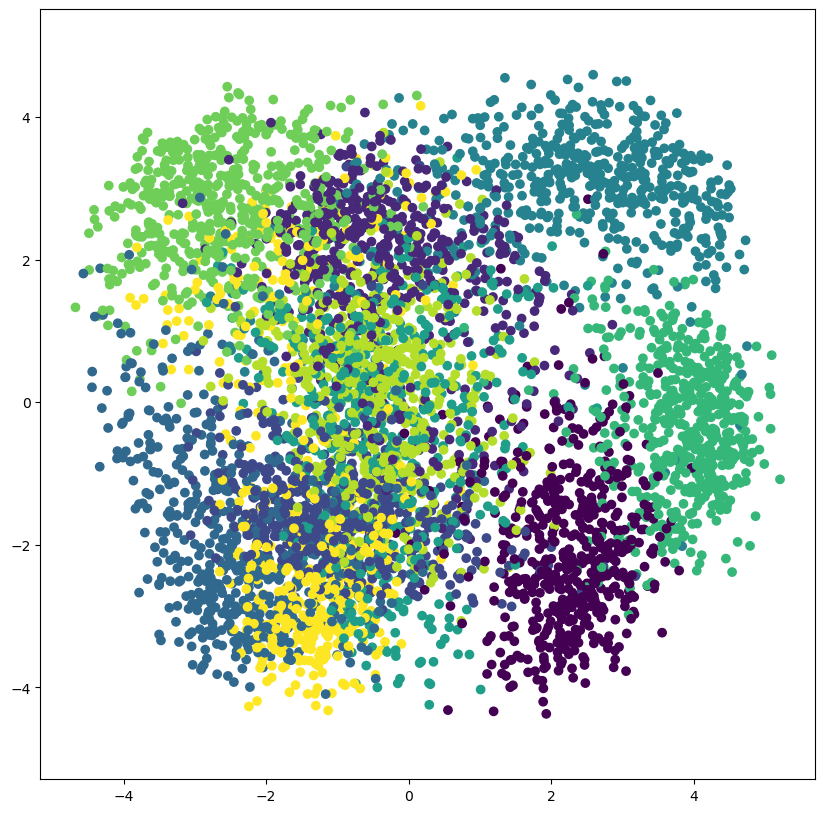

In [13]:
# Choose data
# data, gt_labels, data_name, normalize = load_two_moons()
# data, gt_labels, data_name, normalize = load_runEx()
# data, gt_labels, data_name, normalize = load_htru()
# data, gt_labels, data_name, normalize = load_two_circles()
# data, gt_labels, data_name, normalize = load_mnist()
# data, gt_labels, data_name, normalize = load_fmnist()
# data, gt_labels, data_name, normalize = load_usps()
# data, gt_labels, data_name, normalize = load_kmnist()
# data, gt_labels, data_name, normalize = load_pendigits()
data, gt_labels, data_name, normalize = load_optdigits()
# data, gt_labels, data_name, normalize = load_banknotes()
# data, gt_labels, data_name, normalize = load_wafer()
# data, gt_labels, data_name, normalize = load_iris()
# data, gt_labels, data_name, normalize = load_motestrain()
# data, gt_labels, data_name, normalize = load_letterrecognition()
# data, gt_labels, data_name, normalize = load_mini_mnist()

# normalize = None
# normalize = 1
# normalize = 0
if normalize is not None:
    data = torch.from_numpy(scale(data, axis=normalize)).float()

use_dist_to_merge_center = False
normalize_dip_columns = False
    
gt_n_clusters = len(np.unique(gt_labels))
max_n_cluster = np.floor(data.shape[0]/50)

print("Data Set Information")
print("Number of data points: ", data.shape[0])
print("Number of dimensions: ", data.shape[1])
print("Normalize: ", normalize)
print(f"Mean: {data.mean():.2f}, Standard deviation: {data.std():.2f}")
print(f"Min: {data.min():.2f}, Max: {data.max():.2f}")
print("Number of classes: ", gt_n_clusters)
gt_uniques = np.unique(gt_labels, return_counts=True)
print("Class distribution:\n", dict(zip(gt_uniques[0], gt_uniques[1])))

n_clusters=25
n_clusters_min = 1
n_clusters_max = np.inf
if n_clusters > max_n_cluster:
    raise Exception("To ensure 100 points per cluster, choose n_clusters <= ", max_n_cluster)
elif n_clusters < gt_n_clusters:
    raise Exception("n_clusters must be > than gt_n_clusters")

do_pretrain = True
do_bumblebee_train = True

embedded_space_dim = min(data.shape[1], 5)
# The size of the mini-batch that is passed in each trainings iteration
batch_size = 64
# define loss function
loss_fn = torch.nn.MSELoss()

# Set dip threshold
dip_threshold = 0.9

# Should centers be updated?
update_centers = True

# training_iterations
pretrain_training_iterations = 50
clustering_training_iterations = 30
update_pause_iterations = 5
if update_pause_iterations >= clustering_training_iterations:
    raise Exception("'update_pause_iterations' must be smallter than 'clustering_training_iterations'")

# Set loss weights
dip_loss_weight = 1
cluster_loss_weight = 1
rec_loss_weight = 1

# Set device on which the model should be trained on (For most of you this will be the CPU)
device = detect_device()
print("Use device: ", device)
print("Dimensionality of embedded space: ", embedded_space_dim)
print("Initial number of clusters: ", n_clusters)
print("Maximum / Minimum number of clusters:", n_clusters_max, "/", n_clusters_min)
print("Batch size: ", batch_size)
print("dip threshold: ", dip_threshold)
print("update centers: ", update_centers)
print("dip loss weight: ", dip_loss_weight)
print("cluster loss weight: ", cluster_loss_weight)
print("rec loss weight: ", rec_loss_weight)
print("Pretrain iterations: {0} , Clustering iterations: {1} , Update pause iterations: {2}".format(pretrain_training_iterations, clustering_training_iterations, update_pause_iterations))

plot_2d_dataset(data, gt_labels)

In [14]:
# data_cpu = data.detach().cpu().numpy()
# labels_cpu = gt_labels.detach().cpu().numpy()
# data_to_save = np.c_[data_cpu, labels_cpu]
# np.savetxt("data/{0}_ben.txt".format(data_name), data_to_save, delimiter=",")

In [15]:
# kmeans = kmeans_clustering(data, n_clusters, data_name, normalize)
    
# # Take labels and centers from kmeans result
# cluster_labels = kmeans.labels_.copy()
# centers_cpu = kmeans.cluster_centers_
# centers_torch = torch.from_numpy(centers_cpu).float().to(device)

# # Plot
# plot_2d_kmeans_result(data, gt_labels, cluster_labels, centers_cpu)
    
# # Get initial dip values
# dip_weights_cpu = get_dip_matrix(data.numpy(), centers_cpu, cluster_labels, n_clusters)
# dip_weights = torch.from_numpy(dip_weights_cpu).float()

# print(dip_weights)

# print("NMI: {0} (k={1})".format(normalized_mutual_info_score(gt_labels, cluster_labels), n_clusters))
# print("AMI: {0} (k={1})".format(adjusted_mutual_info_score(gt_labels, cluster_labels), n_clusters))

=====> Start Pretrain <=====
Iteration 0/50 - Reconstruction loss: 0.467435
Iteration 1/50 - Reconstruction loss: 0.275448
Iteration 2/50 - Reconstruction loss: 0.192926
Iteration 3/50 - Reconstruction loss: 0.163213
Iteration 4/50 - Reconstruction loss: 0.171809
Iteration 5/50 - Reconstruction loss: 0.119997
Iteration 6/50 - Reconstruction loss: 0.137785
Iteration 7/50 - Reconstruction loss: 0.122891
Iteration 8/50 - Reconstruction loss: 0.116479
Iteration 9/50 - Reconstruction loss: 0.119859
Iteration 10/50 - Reconstruction loss: 0.111615
Iteration 11/50 - Reconstruction loss: 0.109675
Iteration 12/50 - Reconstruction loss: 0.107985
Iteration 13/50 - Reconstruction loss: 0.106251
Iteration 14/50 - Reconstruction loss: 0.098479
Iteration 15/50 - Reconstruction loss: 0.098296
Iteration 16/50 - Reconstruction loss: 0.092292
Iteration 17/50 - Reconstruction loss: 0.095783
Iteration 18/50 - Reconstruction loss: 0.092843
Iteration 19/50 - Reconstruction loss: 0.099179
Iteration 20/50 - Rec

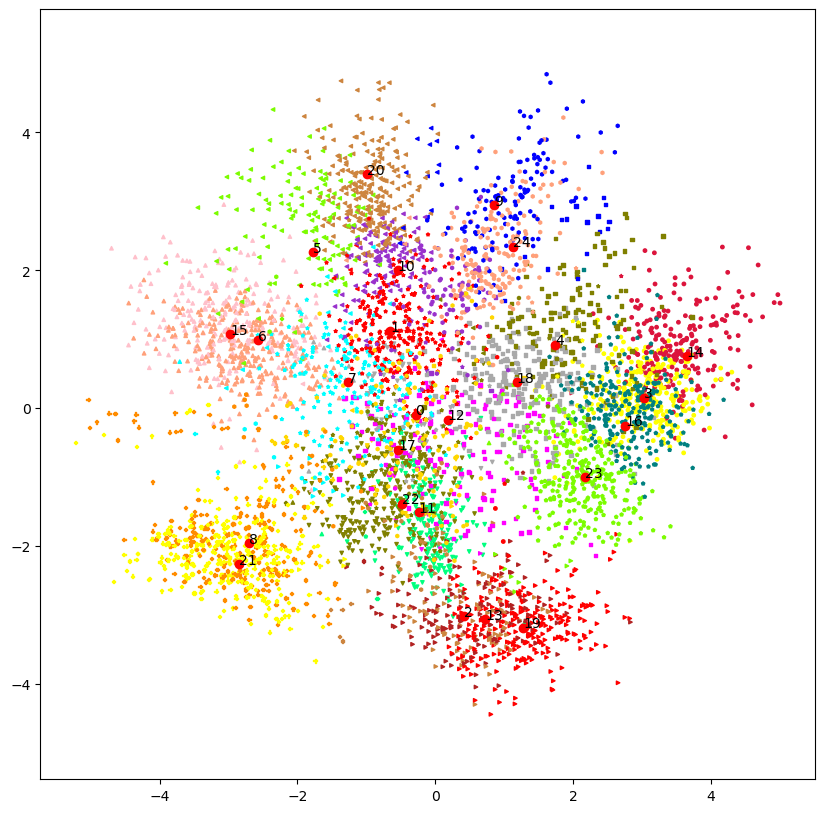

update dips and centers
max dip 0.9959532027776935  at  (8, 21)
NMI: 0.7432893380134002 (k=25)
AMI: 0.7414544790530057 (k=25)
1/30 cluster_loss: 0.078844 ae_loss:0.091408 dip loss: 0.000000 total_loss: 0.170252]
update dips and centers
max dip 0.9961303356291606  at  (8, 21)
NMI: 0.7432893380134002 (k=25)
AMI: 0.7414544790530057 (k=25)
2/30 cluster_loss: 0.062556 ae_loss:0.095822 dip loss: 0.000000 total_loss: 0.158378]


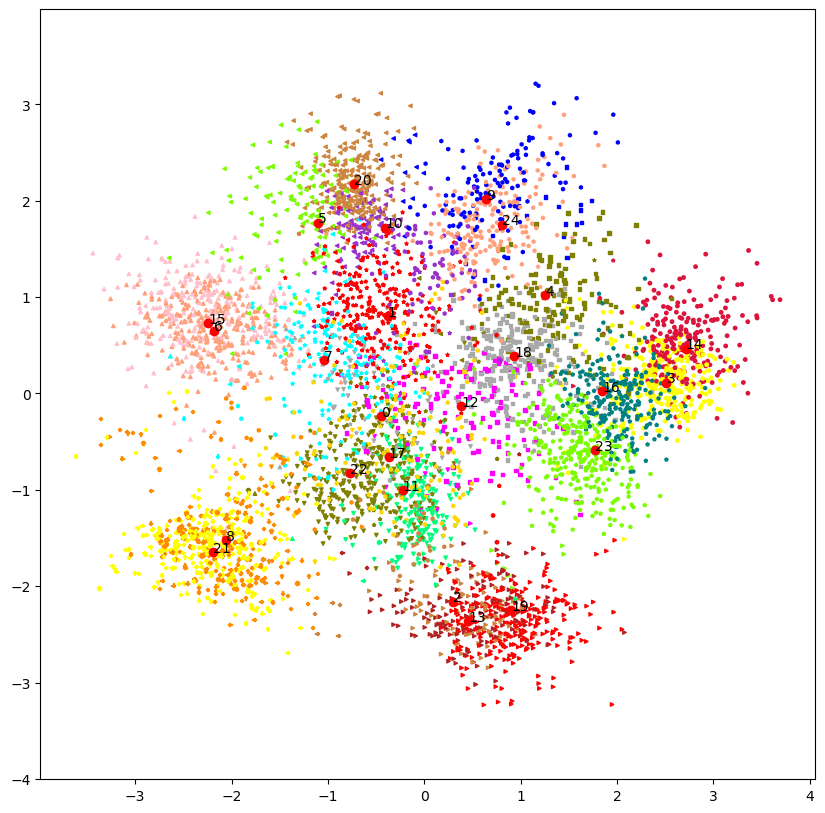

update dips and centers
max dip 0.9961112806915323  at  (8, 21)
NMI: 0.7432893380134002 (k=25)
AMI: 0.7414544790530057 (k=25)
3/30 cluster_loss: 0.059752 ae_loss:0.101852 dip loss: 0.000000 total_loss: 0.161604]
update dips and centers
max dip 0.9993236273592205  at  (2, 19)
NMI: 0.7432893380134002 (k=25)
AMI: 0.7414544790530057 (k=25)
4/30 cluster_loss: 0.053310 ae_loss:0.102077 dip loss: 0.000000 total_loss: 0.155386]


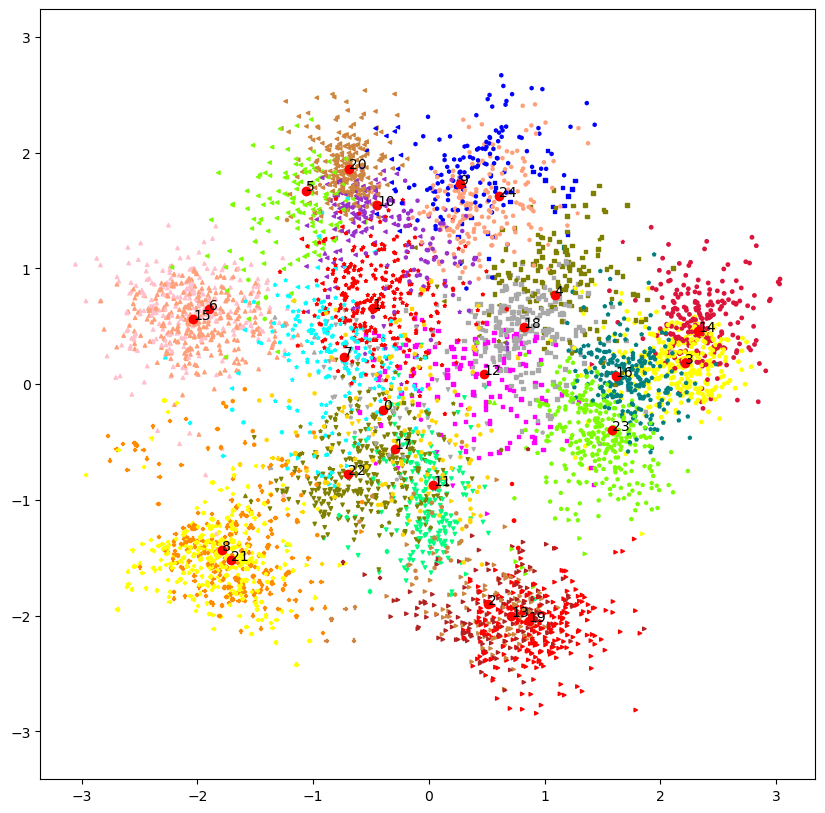

update dips and centers
max dip 0.9986848743790152  at  (2, 19)
NMI: 0.7597312236698313 (k=25)
AMI: 0.7580153271426375 (k=25)
5/30 cluster_loss: 0.043646 ae_loss:0.089577 dip loss: 0.000000 total_loss: 0.133224]
Merge is possible - iteration 6
before merge dips: [[0.00000000e+00 1.72588125e-04 1.43107381e-04 3.31313250e-04
  2.88113370e-03 1.37811313e-04 9.44204902e-03 2.33645956e-04
  2.64077937e-05 1.86172539e-04 3.66220047e-04 6.58700118e-01
  1.21033508e-03 5.58300568e-05 1.25690669e-04 4.05282165e-03
  7.20027845e-04 4.57376665e-04 7.56838959e-04 3.17876241e-04
  1.90551020e-04 2.50692386e-05 3.89723391e-03 1.92304325e-03
  7.65816378e-05]
 [1.72588125e-04 0.00000000e+00 5.33188536e-06 1.52039591e-07
  2.31461246e-06 4.90505245e-05 2.34619790e-07 9.92284310e-01
  1.06963164e-07 1.03712363e-05 4.47601574e-05 4.90662525e-07
  4.11430994e-06 2.42763168e-06 9.64314345e-08 2.88147757e-07
  9.39172590e-07 5.02655453e-05 1.64269476e-06 1.07976196e-07
  1.00254687e-06 3.51114808e-07 5.242

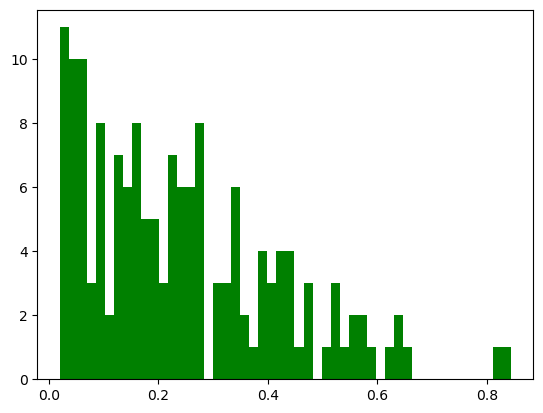

dip, dip prob: 0.013451110621036412 0.9886746469280489


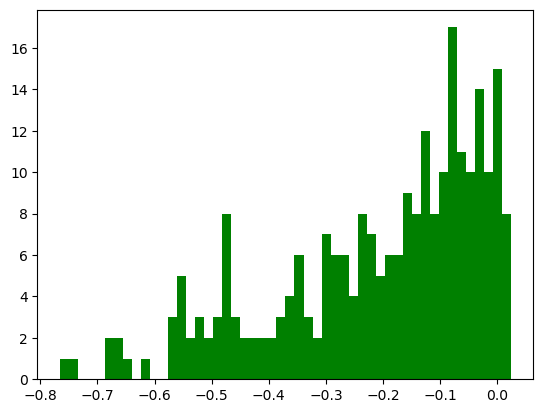

dip, dip prob: 0.008303154704343452 0.9986848743790152


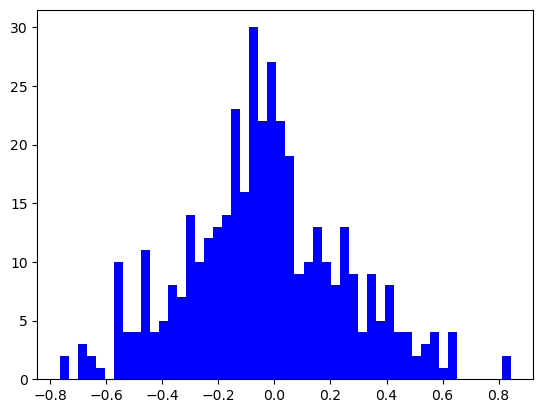

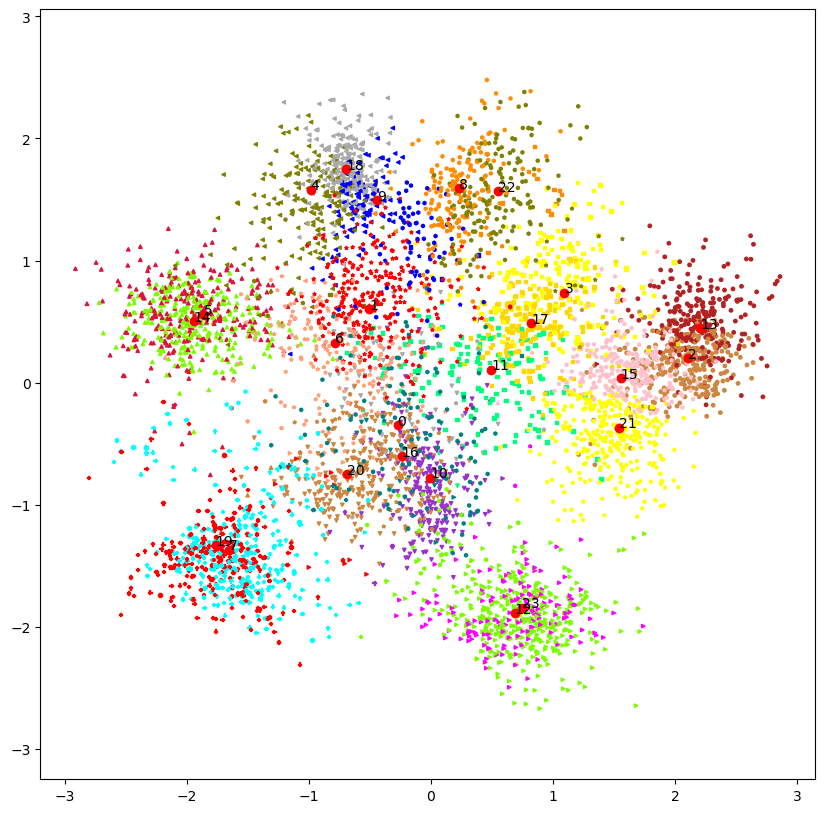

Merge 2 Merging (12, 23)  Dip: 0.9969781900674051 n_points: 164 / 405
dip, dip prob: 0.017250616341352998 0.983078606670543


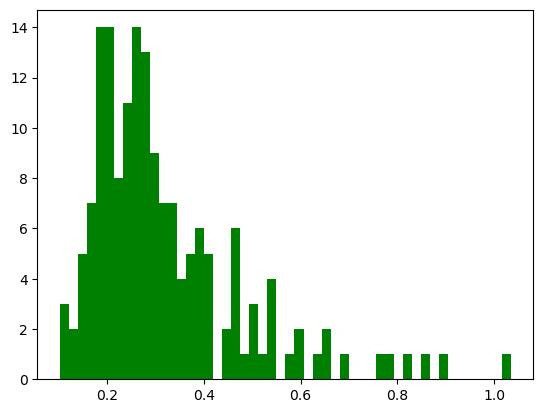

dip, dip prob: 0.012566289911435546 0.956014848034377


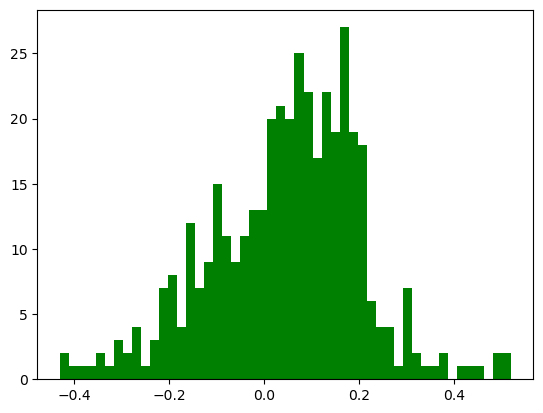

dip, dip prob: 0.0077847502593306195 0.9969781900674051


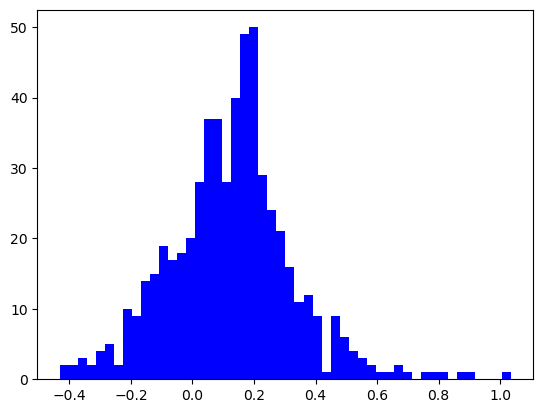

dip, dip prob: (0.0075205527137329475, 0.9987566961200027)  n_points: 164 / 328


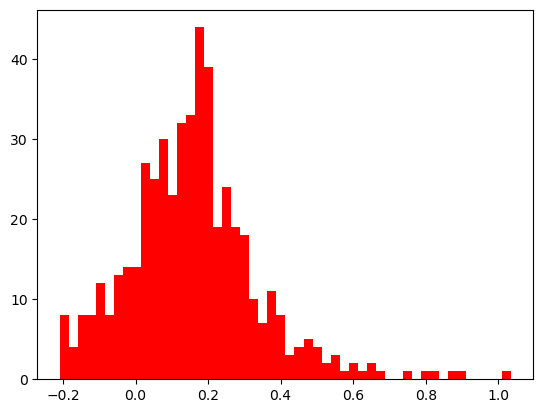

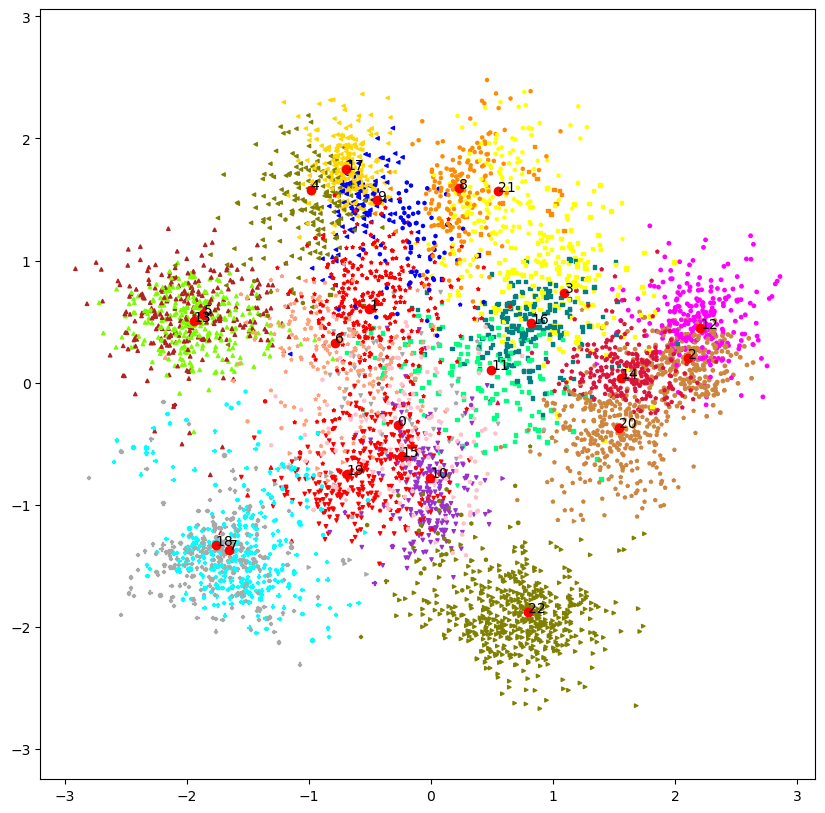

Merge 3 Merging (7, 18)  Dip: 0.9955862389834198 n_points: 334 / 247
dip, dip prob: 0.010734620914067516 0.994604221647898


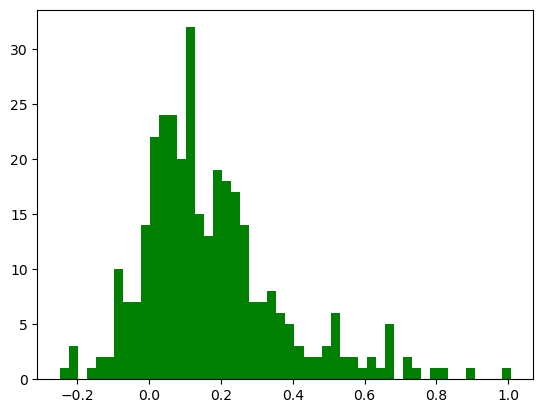

dip, dip prob: 0.013530314221125994 0.9886645898575


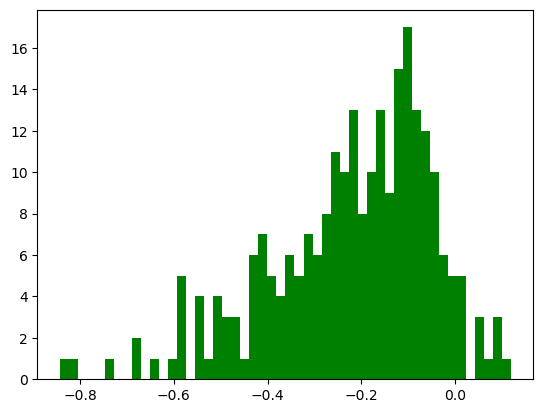

dip, dip prob: 0.008056587214032879 0.9955862389834198


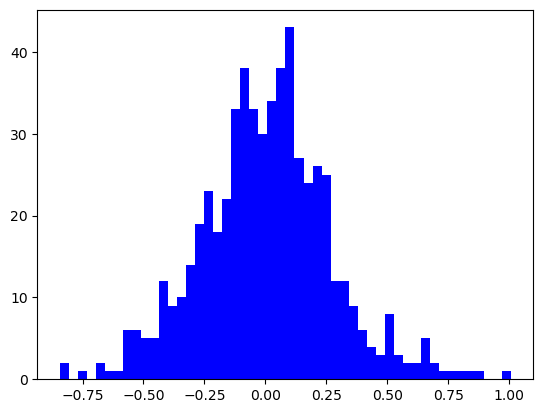

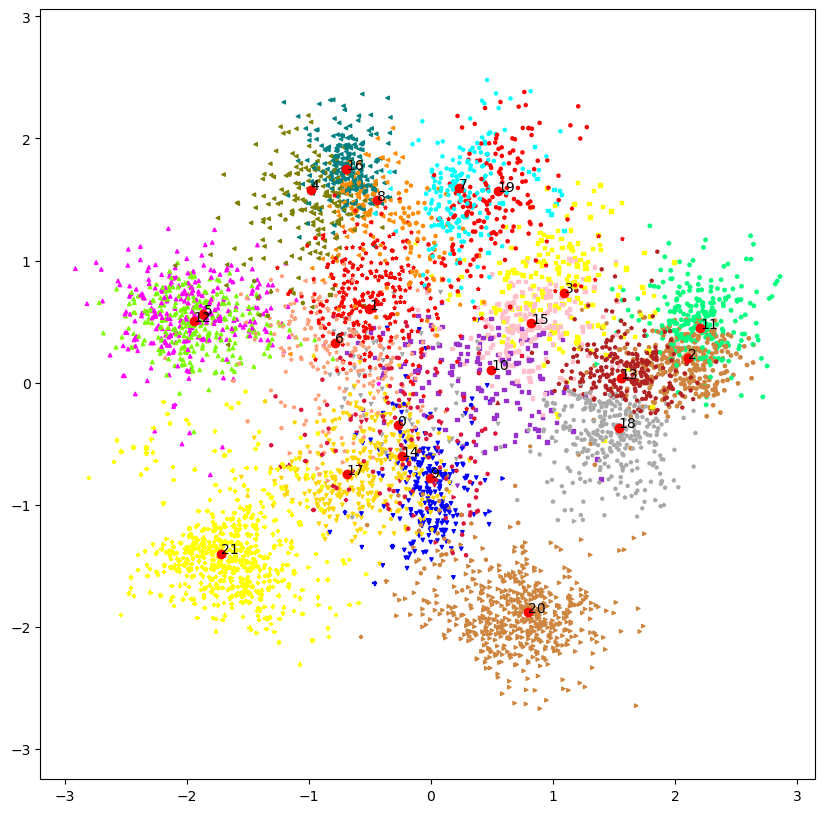

Merge 4 Merging (1, 6)  Dip: 0.9922843101714438 n_points: 291 / 199
dip, dip prob: 0.015703395513610774 0.9260394820151673


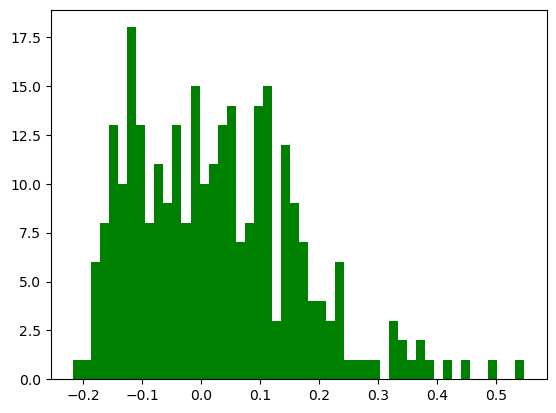

dip, dip prob: 0.02006021539022984 0.8802548655676692


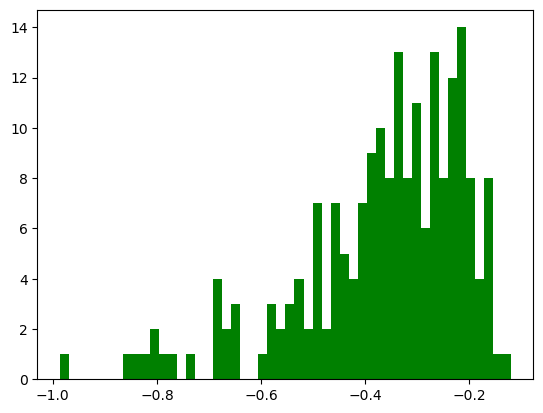

dip, dip prob: 0.009325894070328022 0.9922843101714438


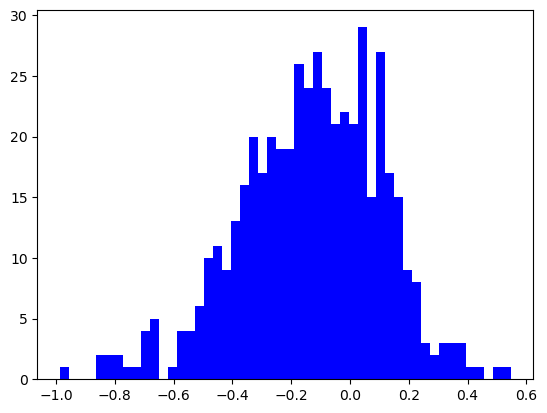

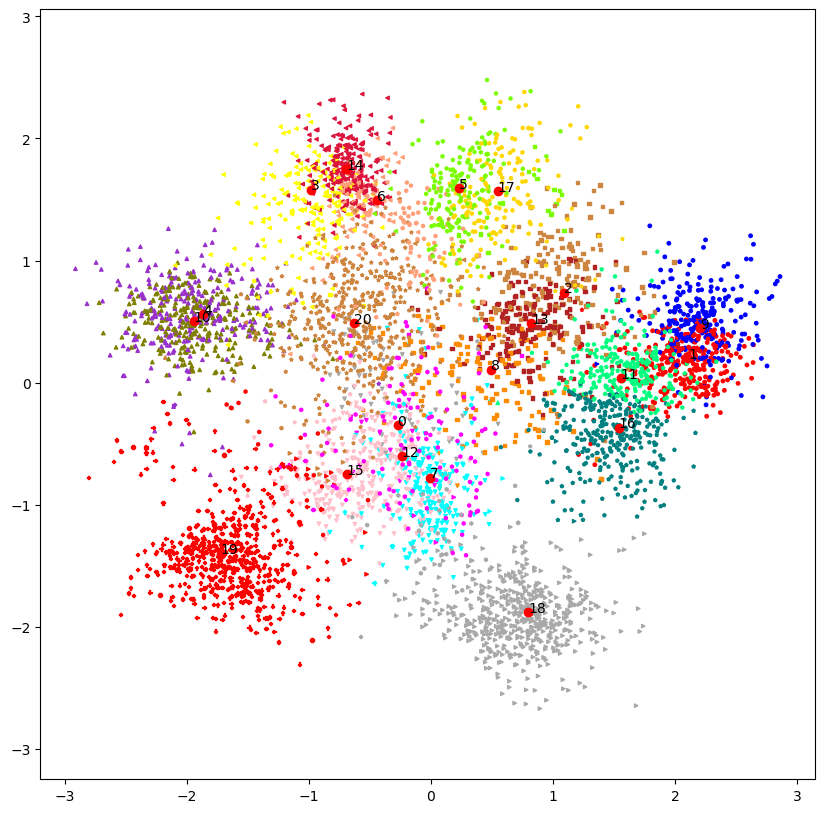

Merge 5 Merging (3, 14)  Dip: 0.990894661829658 n_points: 197 / 253
dip, dip prob: 0.017891843275540636 0.9528572180617447


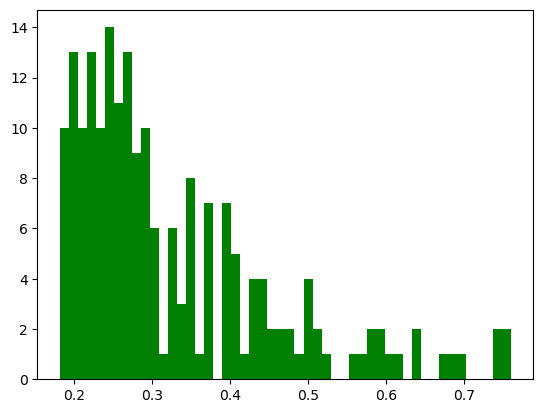

dip, dip prob: 0.017613087443280384 0.8930573720725399


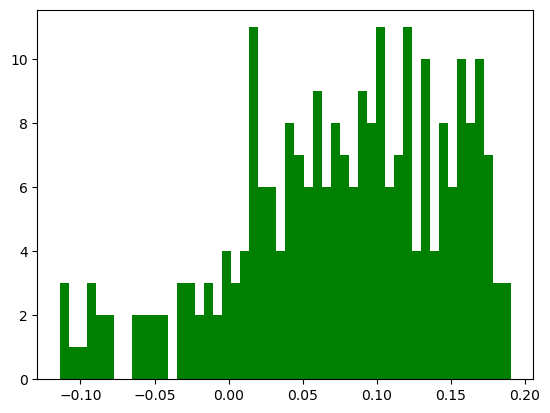

dip, dip prob: 0.00990246916255541 0.990894661829658


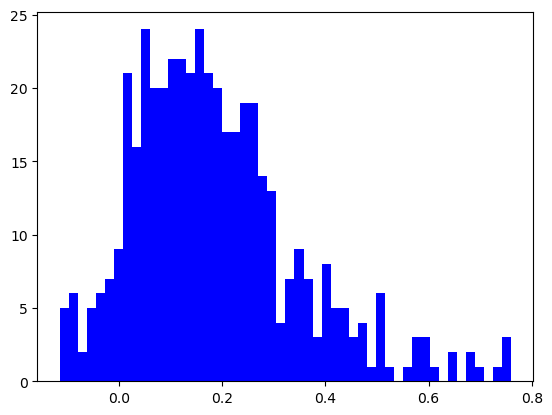

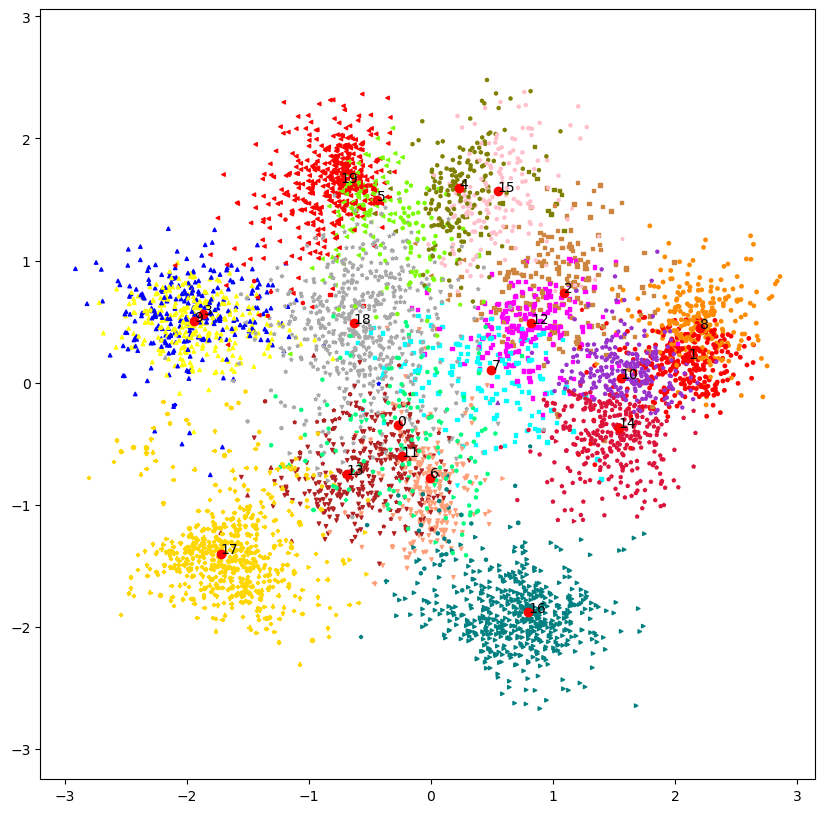

Merge 6 Merging (5, 19)  Dip: 0.9849812055491001 n_points: 183 / 450
dip, dip prob: 0.017630515127736224 0.9686688838806193


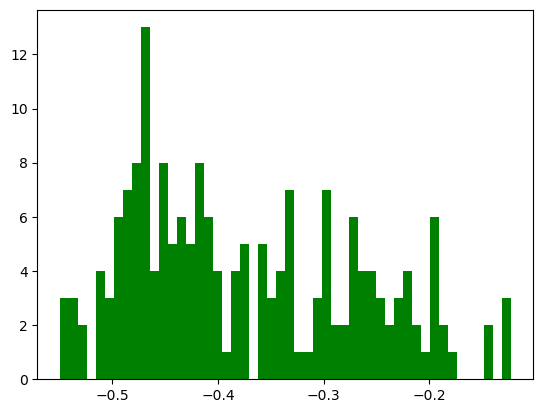

dip, dip prob: 0.010659891943160082 0.9829991455417657


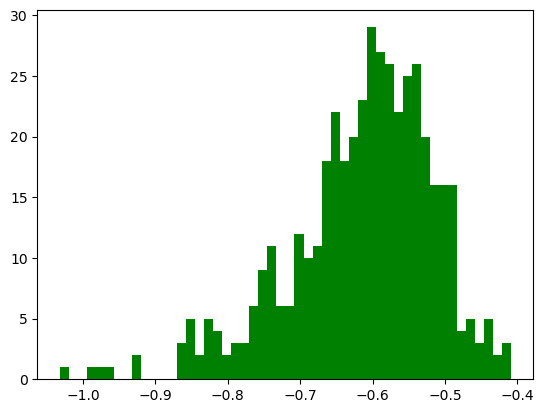

dip, dip prob: 0.008930816846536571 0.9849812055491001


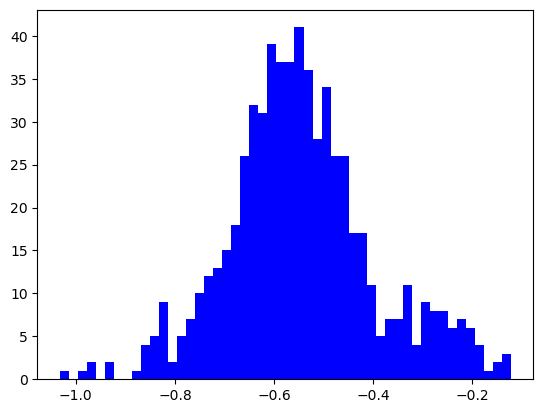

dip, dip prob: (0.009214669368352052, 0.9889632685042171)  n_points: 183 / 366


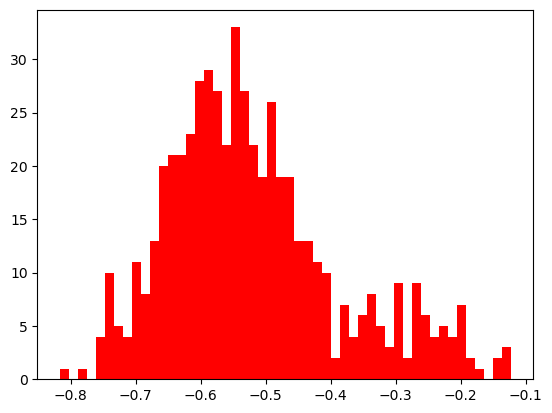

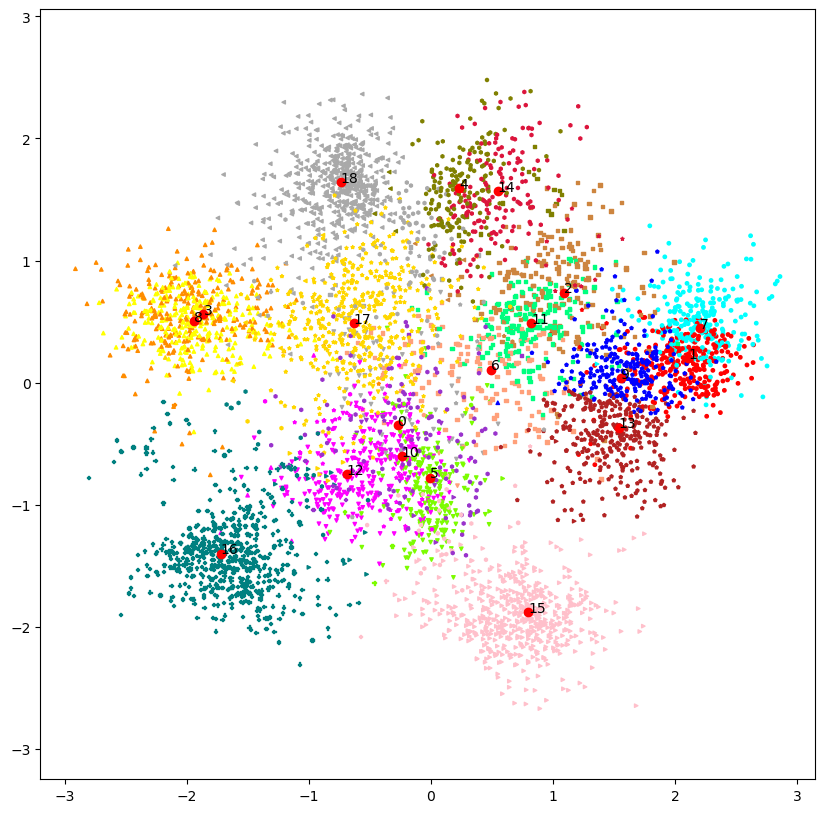

Merge 7 Merging (3, 8)  Dip: 0.9843390562364436 n_points: 283 / 268
dip, dip prob: 0.013850668107538489 0.9761607475578603


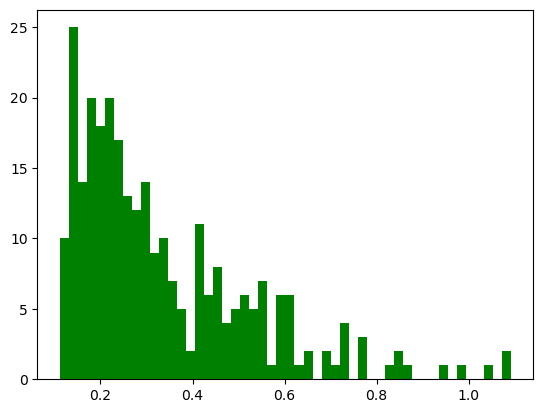

dip, dip prob: 0.01875099352223214 0.7959921690895686


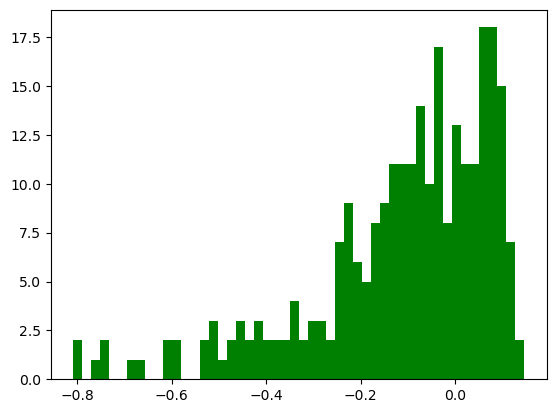

dip, dip prob: 0.009586513788711337 0.9843390562364436


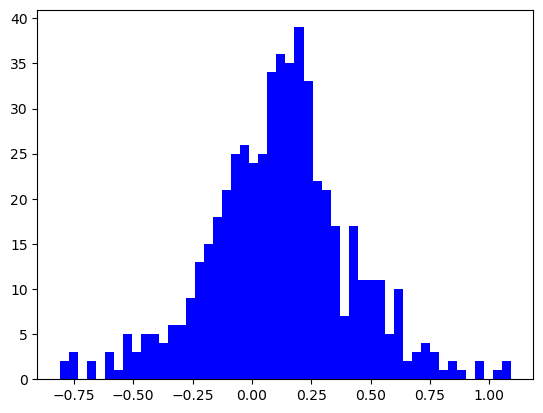

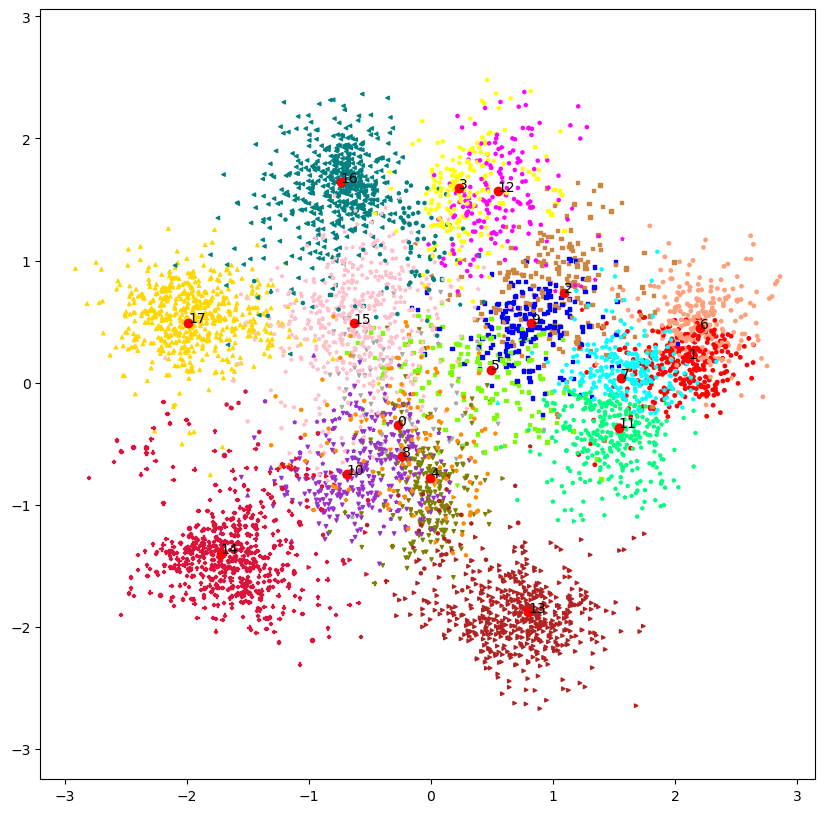

Merge 8 Merging (3, 12)  Dip: 0.9784976053505907 n_points: 190 / 173
dip, dip prob: 0.023204657619744162 0.7230820830937528


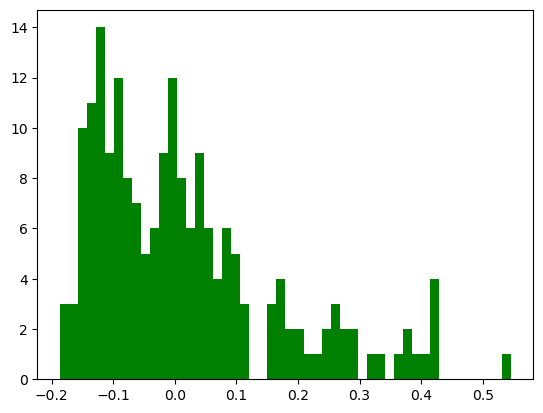

dip, dip prob: 0.018326496865218006 0.9654405749586021


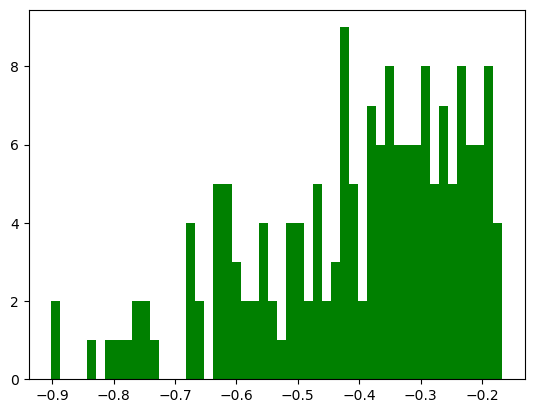

dip, dip prob: 0.012145688561298607 0.9784976053505907


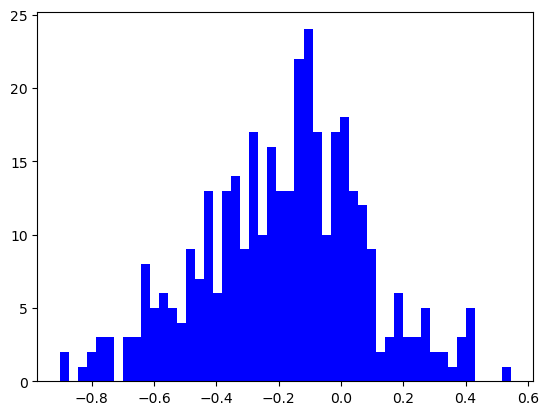

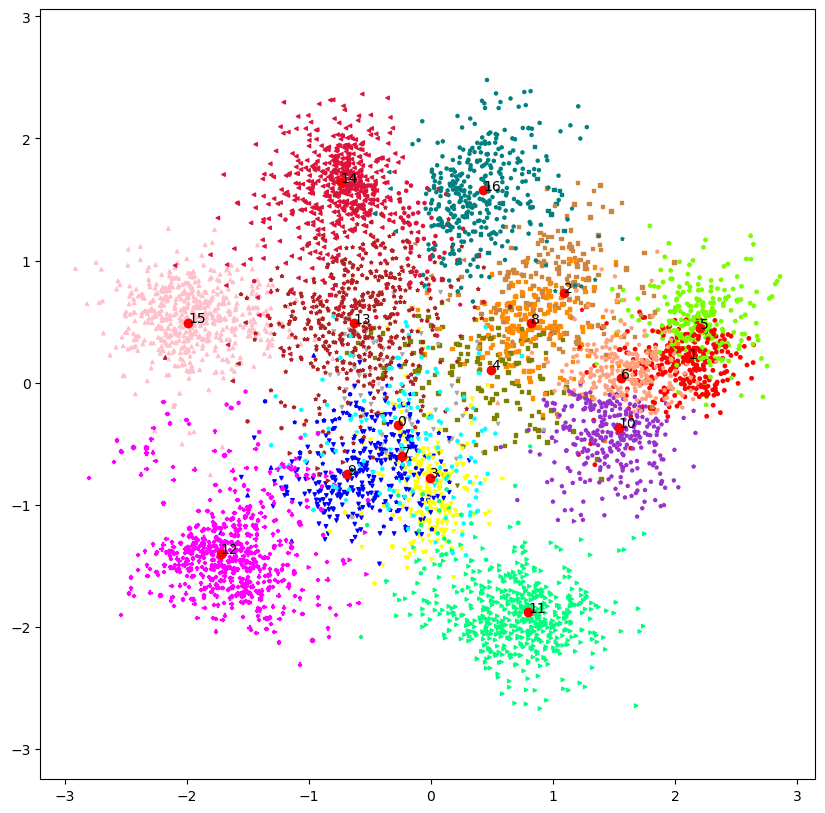

Merge 9 Merging (6, 10)  Dip: 0.9721572458076125 n_points: 241 / 315
dip, dip prob: 0.021173094999186737 0.6843386292847774


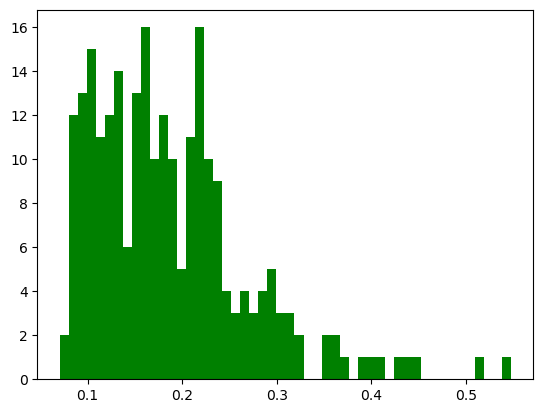

dip, dip prob: 0.018042905897818373 0.7378472049520661


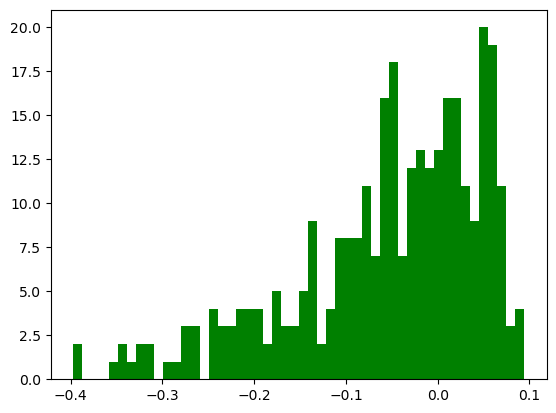

dip, dip prob: 0.01022214992412368 0.9721572458076125


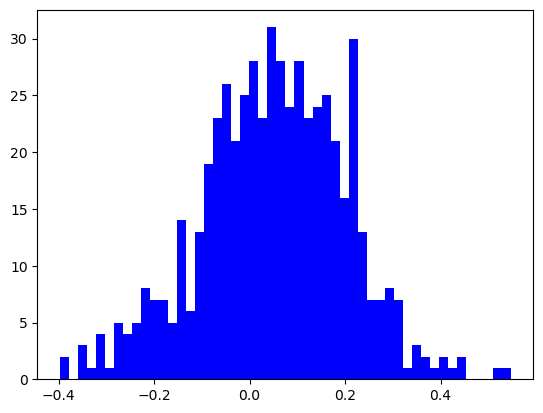

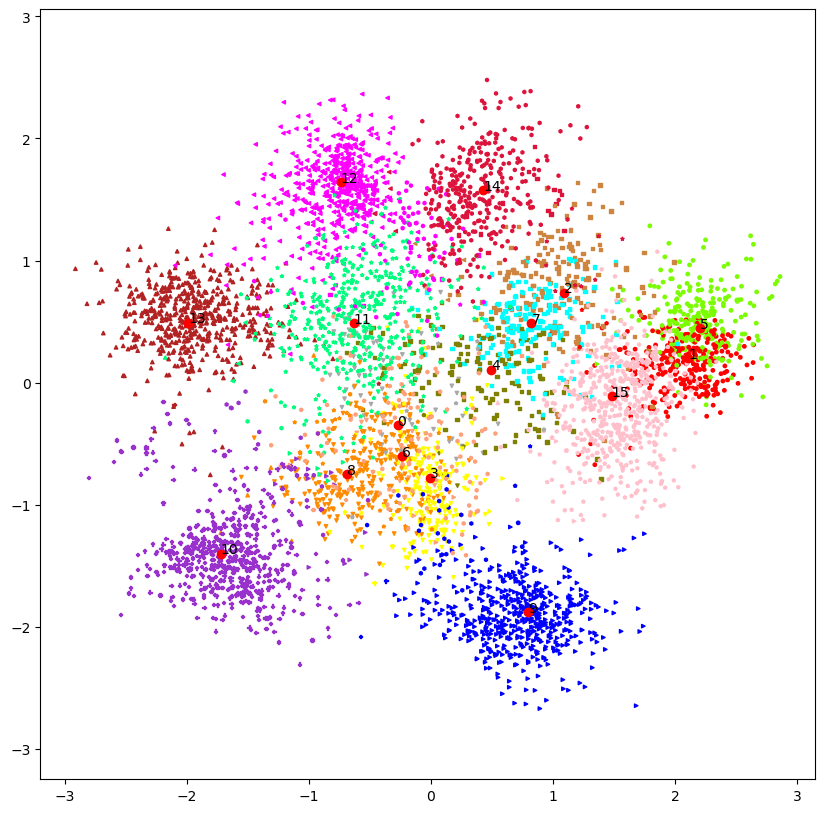

Merge 10 Merging (4, 7)  Dip: 0.9659983435076124 n_points: 152 / 188
dip, dip prob: 0.02749635944677775 0.6085304660970919


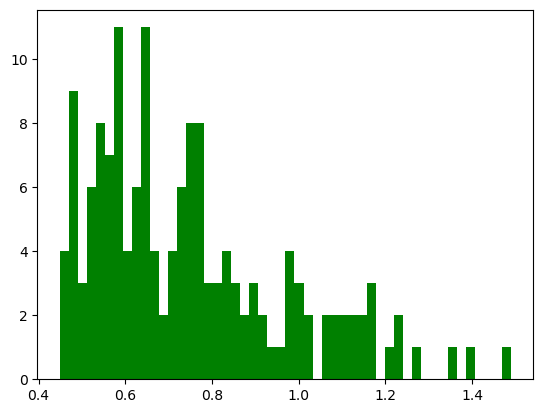

dip, dip prob: 0.017581034208843382 0.9659623145982105


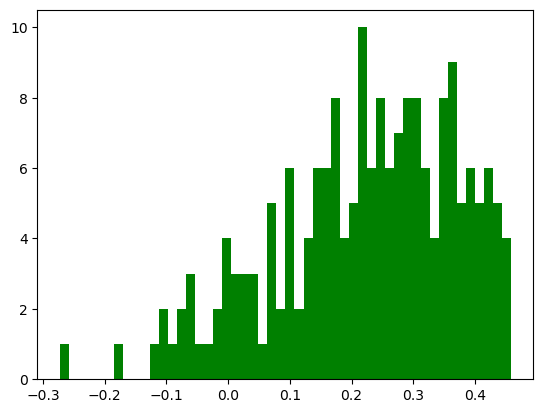

dip, dip prob: 0.013241083997229675 0.9659983435076124


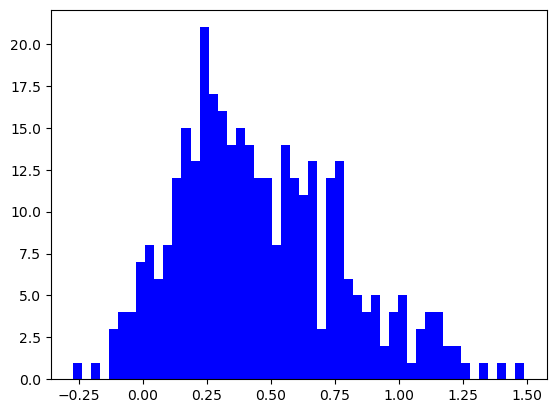

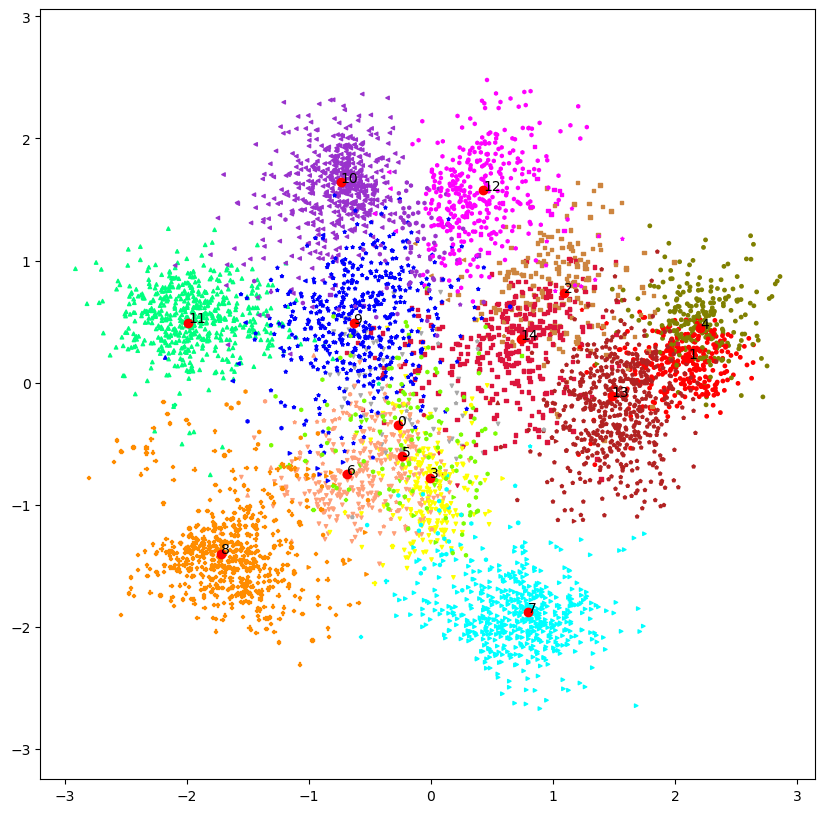

Merge 11 Merging (2, 14)  Dip: 0.9798816567355875 n_points: 208 / 340
dip, dip prob: 0.021606735210961958 0.7672125331271202


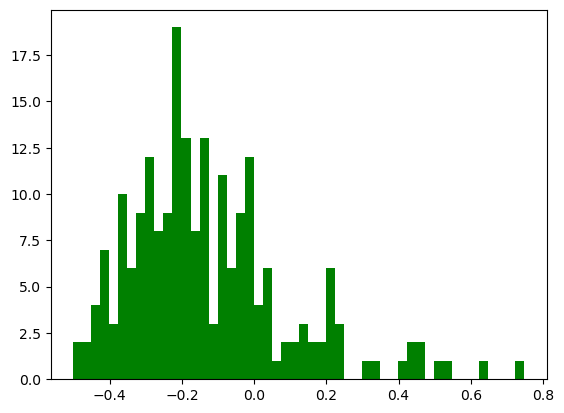

dip, dip prob: 0.01584866025049597 0.8601500373242238


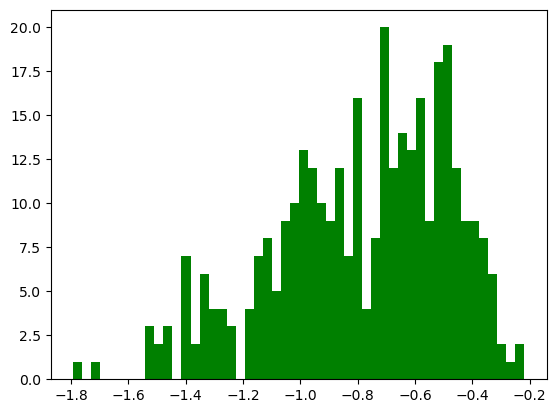

dip, dip prob: 0.009901210381572656 0.9798816567355875


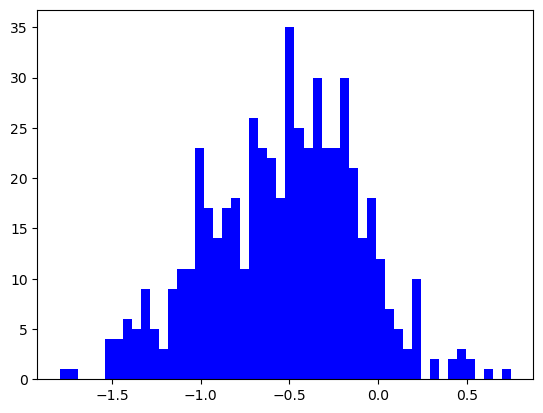

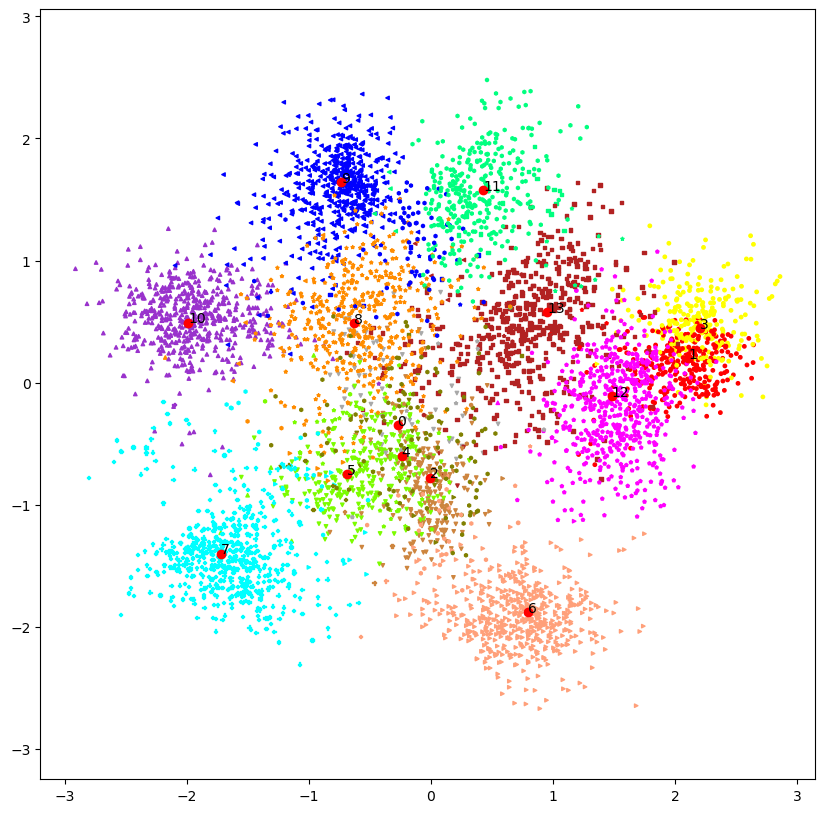

Merge 12 Merging (1, 3)  Dip: 0.9207907647942821 n_points: 292 / 262
dip, dip prob: 0.022091554173311906 0.42011893459496813


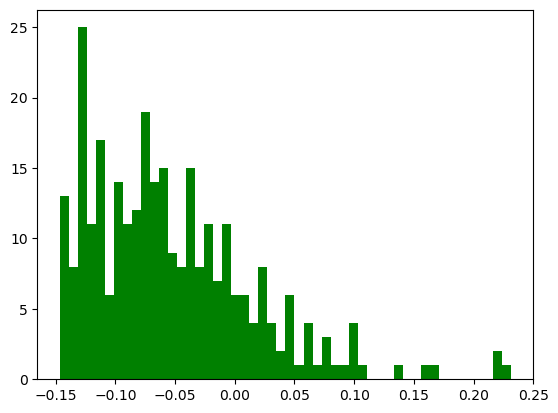

dip, dip prob: 0.014580496088817965 0.9731068470420402


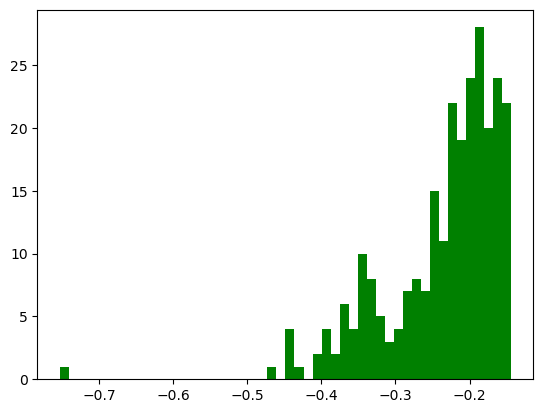

dip, dip prob: 0.011643923860301553 0.9207907647942821


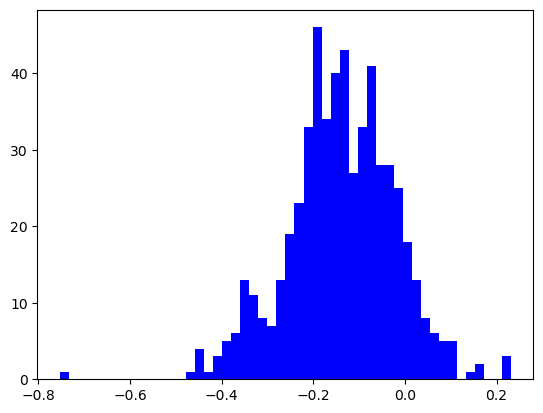

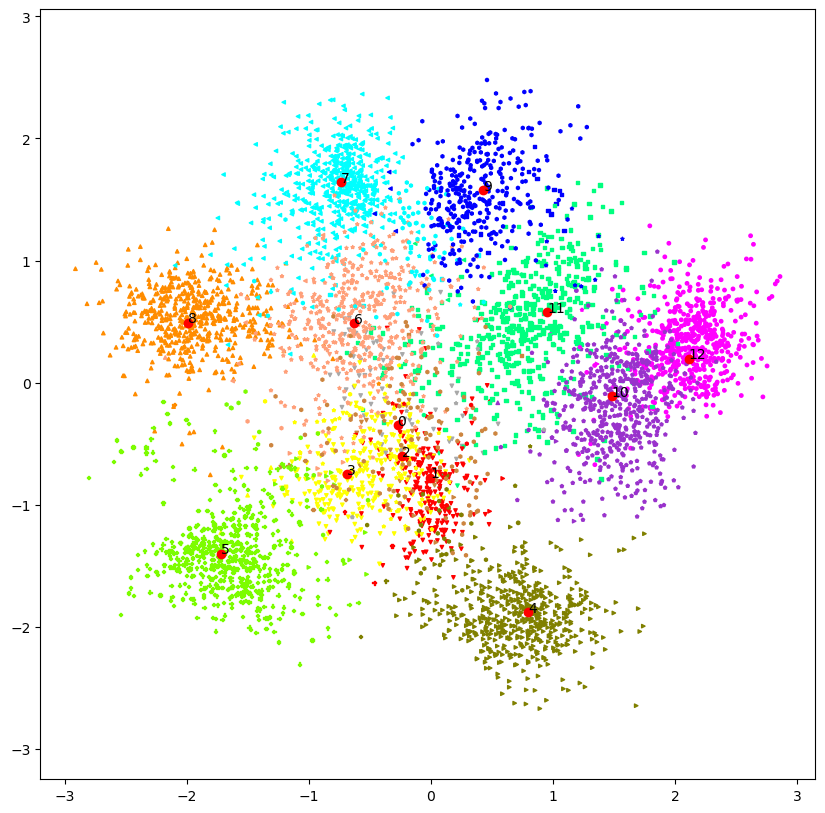

update dips and centers
max dip 0.4622477099606428  at  (1, 2)
NMI: 0.8597676017570419 (k=13)
AMI: 0.8591947170018222 (k=13)
0/30 cluster_loss: 0.036747 ae_loss:0.090783 dip loss: 0.000000 total_loss: 0.127530]


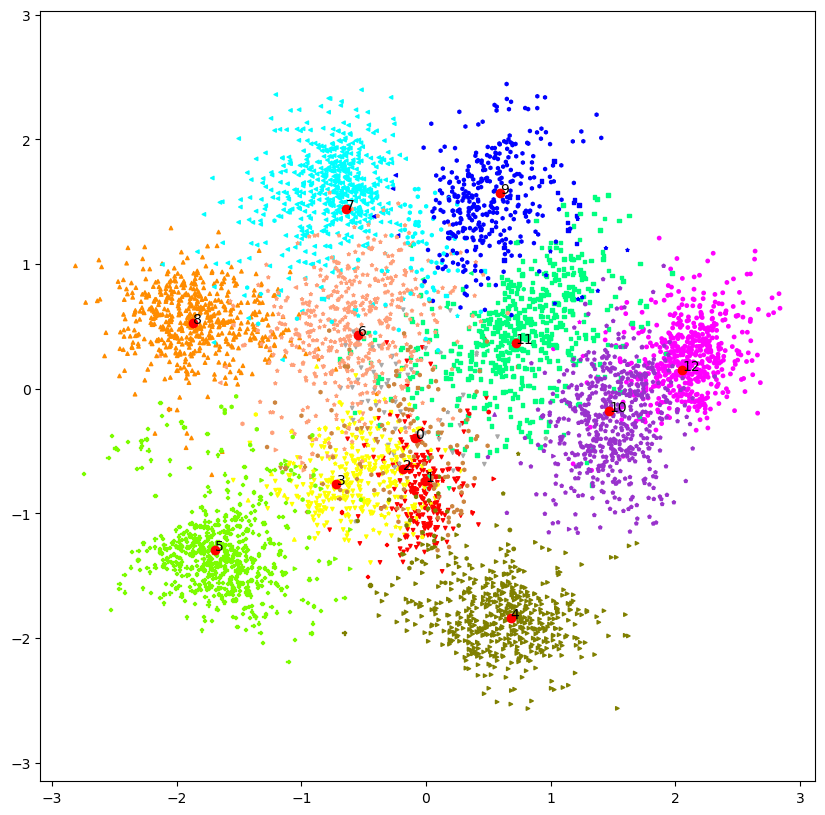

update dips and centers
max dip 0.3192561120057584  at  (0, 1)
NMI: 0.8597676017570419 (k=13)
AMI: 0.8591947170018222 (k=13)
1/30 cluster_loss: 0.032507 ae_loss:0.081317 dip loss: 0.000000 total_loss: 0.113824]
update dips and centers
max dip 0.09954981699248341  at  (0, 1)
NMI: 0.8597676017570419 (k=13)
AMI: 0.8591947170018222 (k=13)
2/30 cluster_loss: 0.037739 ae_loss:0.092645 dip loss: 0.000000 total_loss: 0.130383]


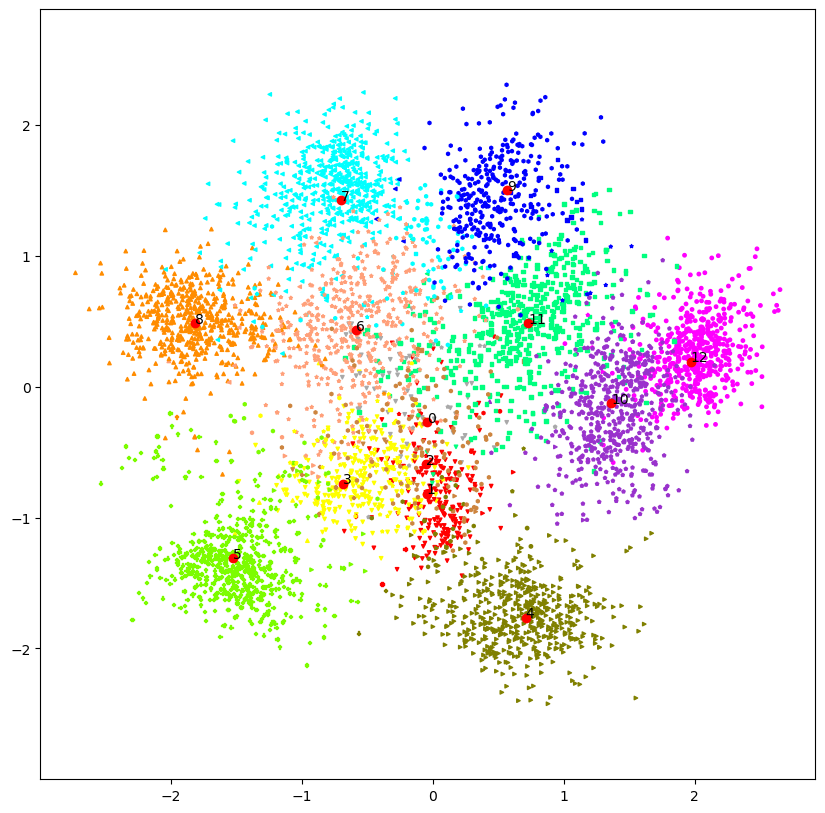

update dips and centers
max dip 0.0998582679925728  at  (0, 1)
NMI: 0.8597676017570419 (k=13)
AMI: 0.8591947170018222 (k=13)
3/30 cluster_loss: 0.026056 ae_loss:0.081474 dip loss: 0.000000 total_loss: 0.107530]
update dips and centers
max dip 0.07572558470674806  at  (0, 1)
NMI: 0.8597676017570419 (k=13)
AMI: 0.8591947170018222 (k=13)
4/30 cluster_loss: 0.026417 ae_loss:0.079714 dip loss: 0.000000 total_loss: 0.106132]


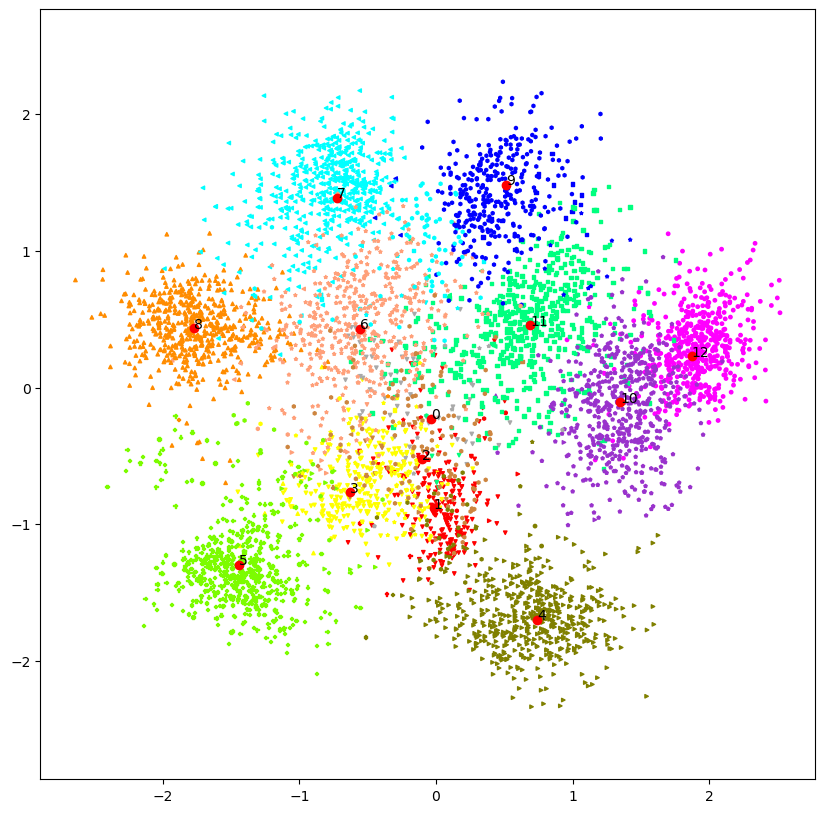

update dips and centers
max dip 0.07491228558235116  at  (0, 1)
NMI: 0.8722137344505118 (k=13)
AMI: 0.8716926526361255 (k=13)
5/30 cluster_loss: 0.024834 ae_loss:0.091473 dip loss: 0.000000 total_loss: 0.116307]
update dips and centers
max dip 0.09408991554540255  at  (0, 1)
NMI: 0.8771892237432751 (k=13)
AMI: 0.8766890046848809 (k=13)
6/30 cluster_loss: 0.028799 ae_loss:0.095224 dip loss: 0.000000 total_loss: 0.124023]


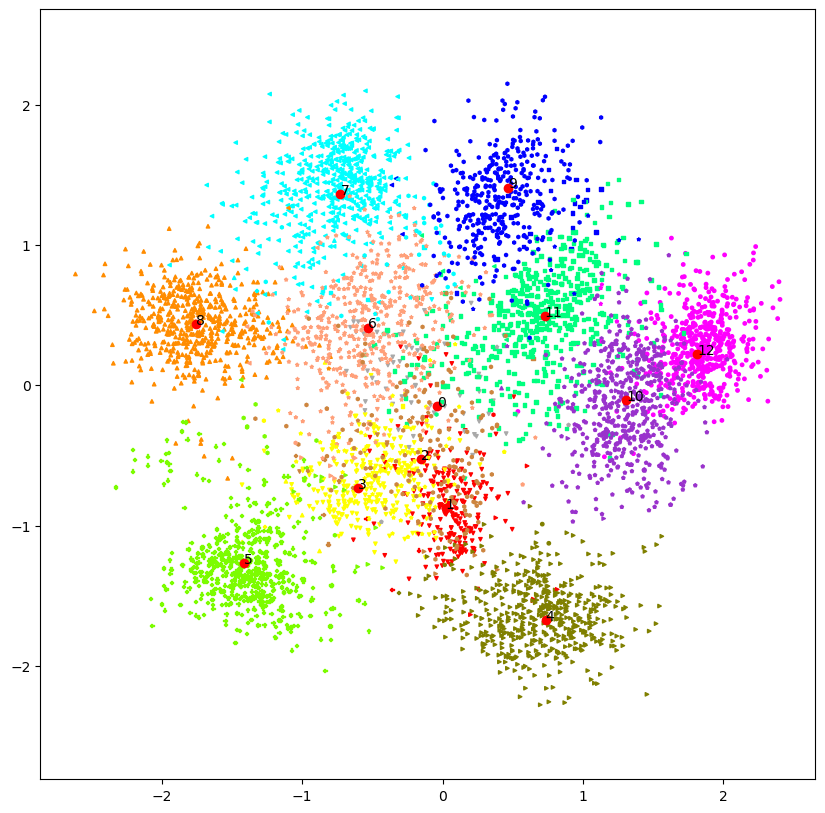

update dips and centers
max dip 0.06547531767118271  at  (0, 1)
NMI: 0.878617972510669 (k=13)
AMI: 0.8781235796177524 (k=13)
7/30 cluster_loss: 0.019639 ae_loss:0.084514 dip loss: 0.000000 total_loss: 0.104153]
update dips and centers
max dip 0.04027195112766183  at  (0, 1)
NMI: 0.8800615982944658 (k=13)
AMI: 0.8795730592337101 (k=13)
8/30 cluster_loss: 0.021520 ae_loss:0.076498 dip loss: 0.000000 total_loss: 0.098018]


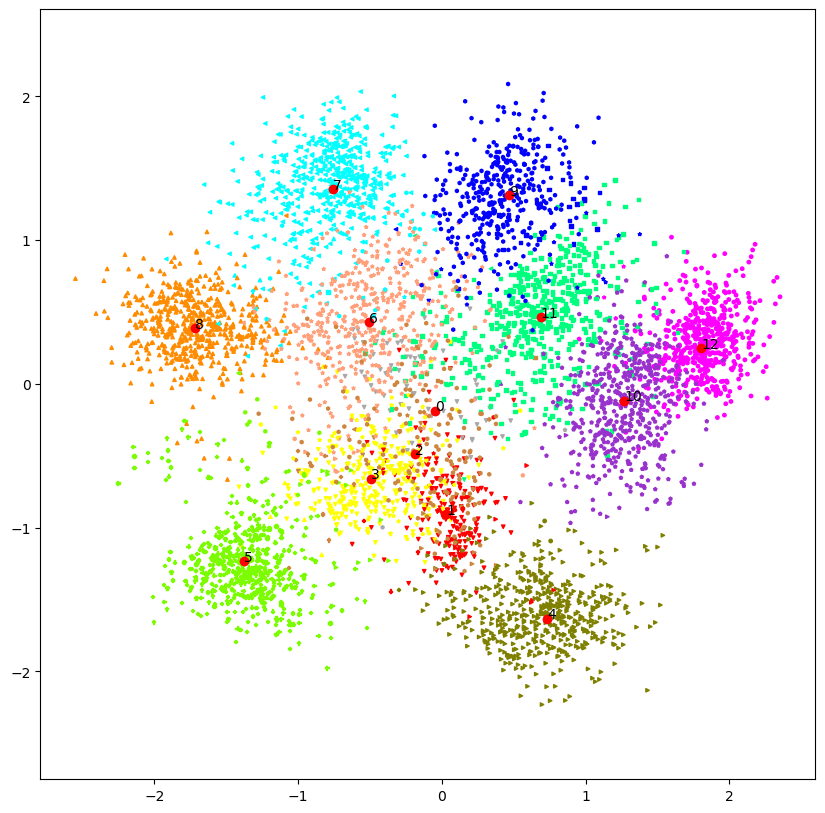

update dips and centers
max dip 0.031543978624210156  at  (0, 1)
NMI: 0.8805068555447236 (k=13)
AMI: 0.8800200912153249 (k=13)
9/30 cluster_loss: 0.024353 ae_loss:0.073663 dip loss: 0.000000 total_loss: 0.098016]
update dips and centers
max dip 0.037245243272919254  at  (0, 1)
NMI: 0.8804018884568201 (k=13)
AMI: 0.879915079620832 (k=13)
10/30 cluster_loss: 0.021833 ae_loss:0.091133 dip loss: 0.000000 total_loss: 0.112966]


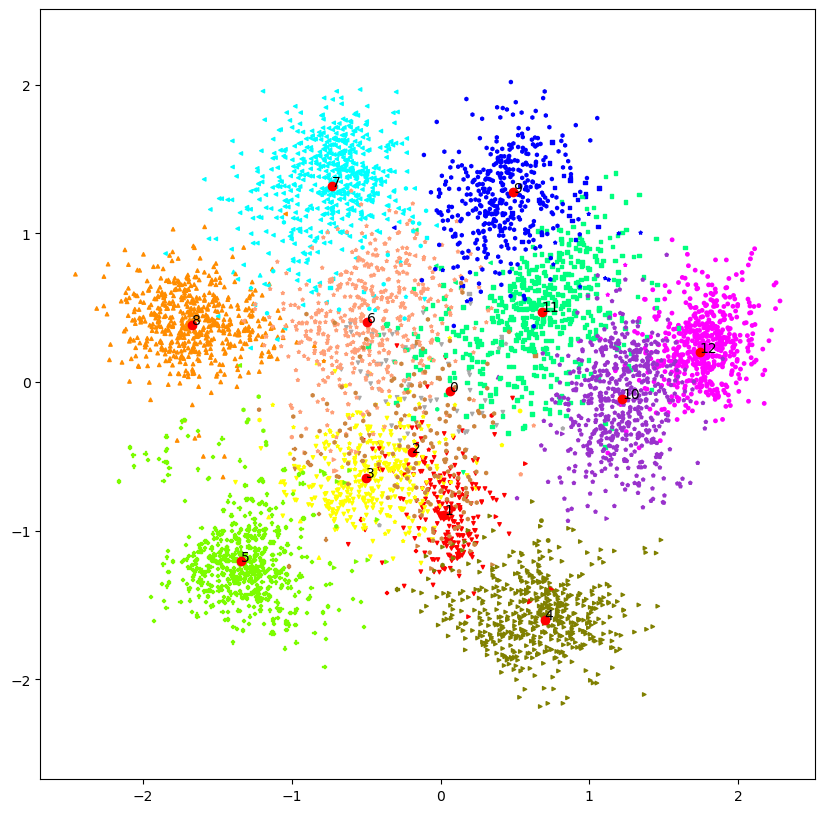

update dips and centers
max dip 0.030925701492830412  at  (0, 1)
NMI: 0.8801137909466071 (k=13)
AMI: 0.8796257718632843 (k=13)
11/30 cluster_loss: 0.022251 ae_loss:0.082791 dip loss: 0.000000 total_loss: 0.105042]
update dips and centers
max dip 0.024120734179668753  at  (0, 1)
NMI: 0.881997605114237 (k=13)
AMI: 0.8815172039197162 (k=13)
12/30 cluster_loss: 0.026857 ae_loss:0.091212 dip loss: 0.000000 total_loss: 0.118068]


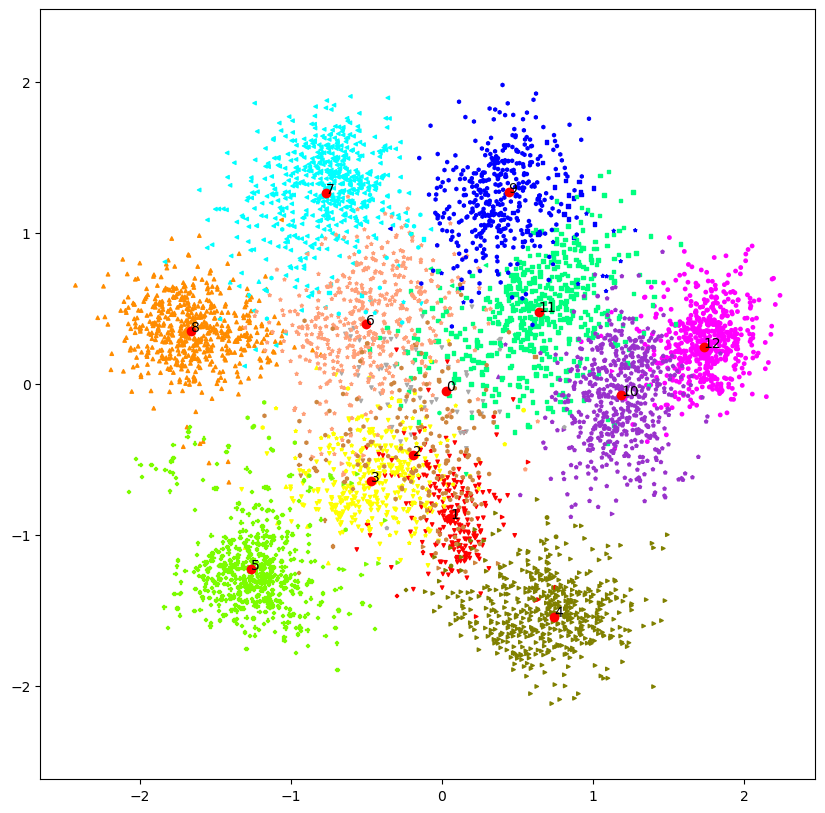

update dips and centers
max dip 0.017721132007101827  at  (0, 1)
NMI: 0.8830009071111184 (k=13)
AMI: 0.8825243813133161 (k=13)
13/30 cluster_loss: 0.022889 ae_loss:0.092892 dip loss: 0.000000 total_loss: 0.115781]
update dips and centers
max dip 0.010887792966222137  at  (0, 1)
NMI: 0.8827010888379234 (k=13)
AMI: 0.8822233496539559 (k=13)
14/30 cluster_loss: 0.022579 ae_loss:0.071084 dip loss: 0.000000 total_loss: 0.093663]


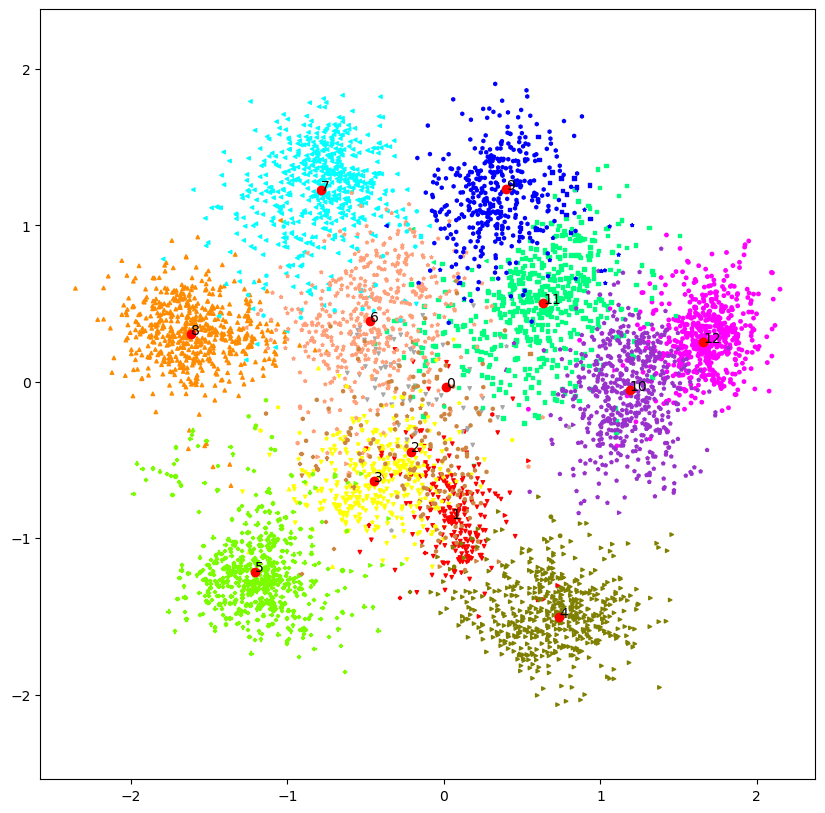

update dips and centers
max dip 0.008196288877662534  at  (0, 1)
NMI: 0.8837369495128496 (k=13)
AMI: 0.8832633726271335 (k=13)
15/30 cluster_loss: 0.018486 ae_loss:0.079425 dip loss: 0.000000 total_loss: 0.097911]
update dips and centers
max dip 0.007884727133790643  at  (2, 4)
NMI: 0.8838674652552672 (k=13)
AMI: 0.8833944186371101 (k=13)
16/30 cluster_loss: 0.020202 ae_loss:0.071781 dip loss: 0.000000 total_loss: 0.091983]


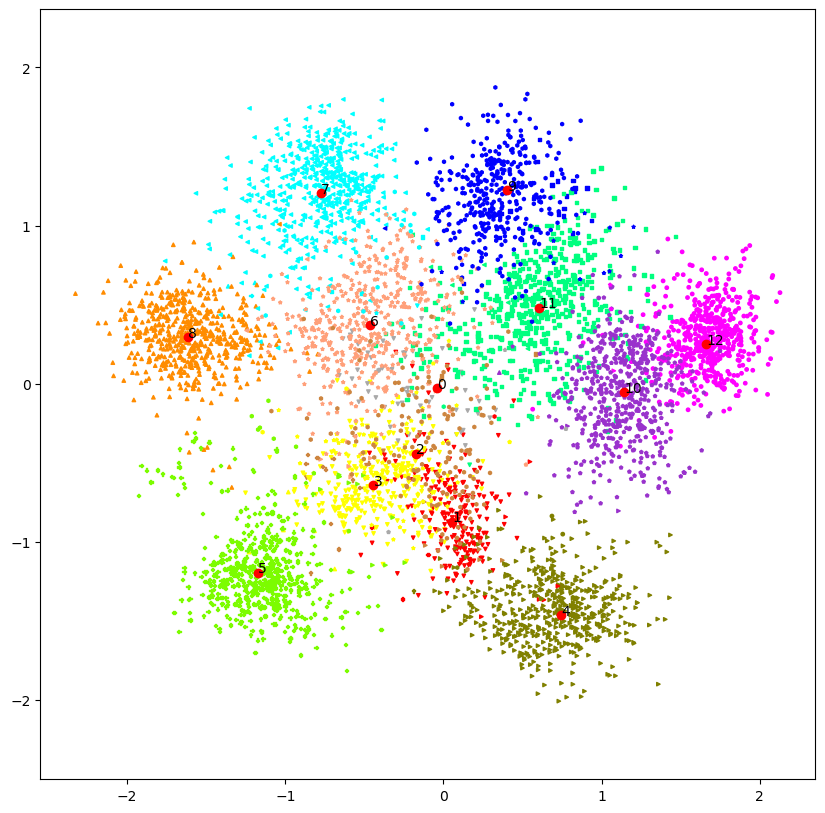

update dips and centers
max dip 0.0073861053470424595  at  (2, 4)
NMI: 0.8838308531984534 (k=13)
AMI: 0.8833575925671253 (k=13)
17/30 cluster_loss: 0.016508 ae_loss:0.077979 dip loss: 0.000000 total_loss: 0.094487]
update dips and centers
max dip 0.007307655685938789  at  (2, 4)
NMI: 0.8842535354646944 (k=13)
AMI: 0.8837820771250335 (k=13)
18/30 cluster_loss: 0.017172 ae_loss:0.077356 dip loss: 0.000000 total_loss: 0.094528]


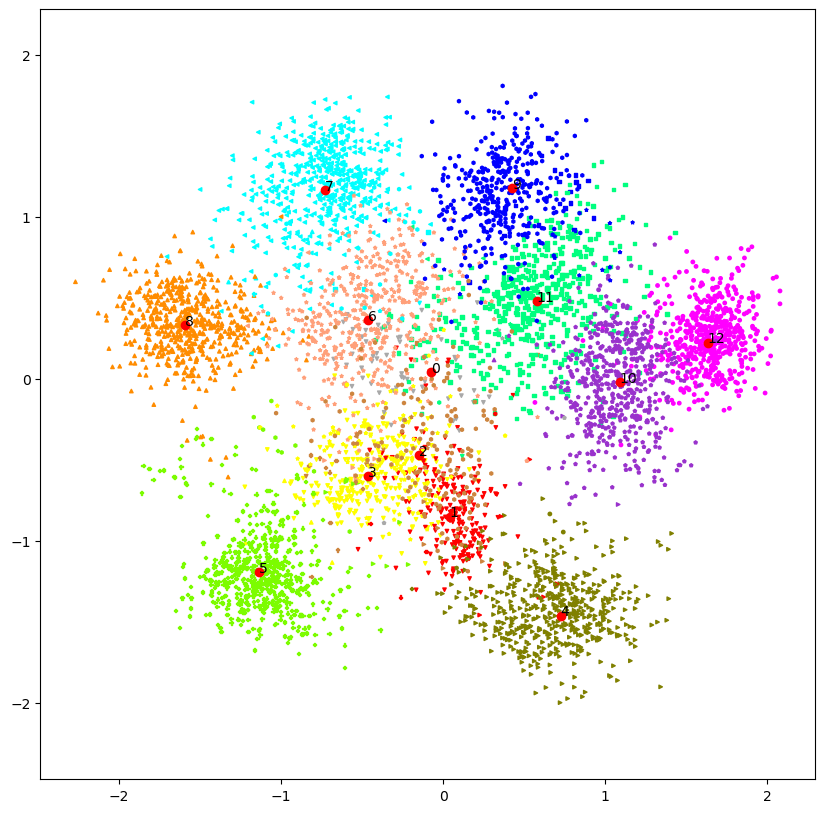

update dips and centers
max dip 0.006431200329687487  at  (2, 4)
NMI: 0.8841359488243256 (k=13)
AMI: 0.8836639192527707 (k=13)
19/30 cluster_loss: 0.016927 ae_loss:0.077609 dip loss: 0.000000 total_loss: 0.094536]
update dips and centers
max dip 0.005431174496627965  at  (2, 4)
NMI: 0.8840010058807133 (k=13)
AMI: 0.8835284310728555 (k=13)
20/30 cluster_loss: 0.015856 ae_loss:0.084834 dip loss: 0.000000 total_loss: 0.100690]


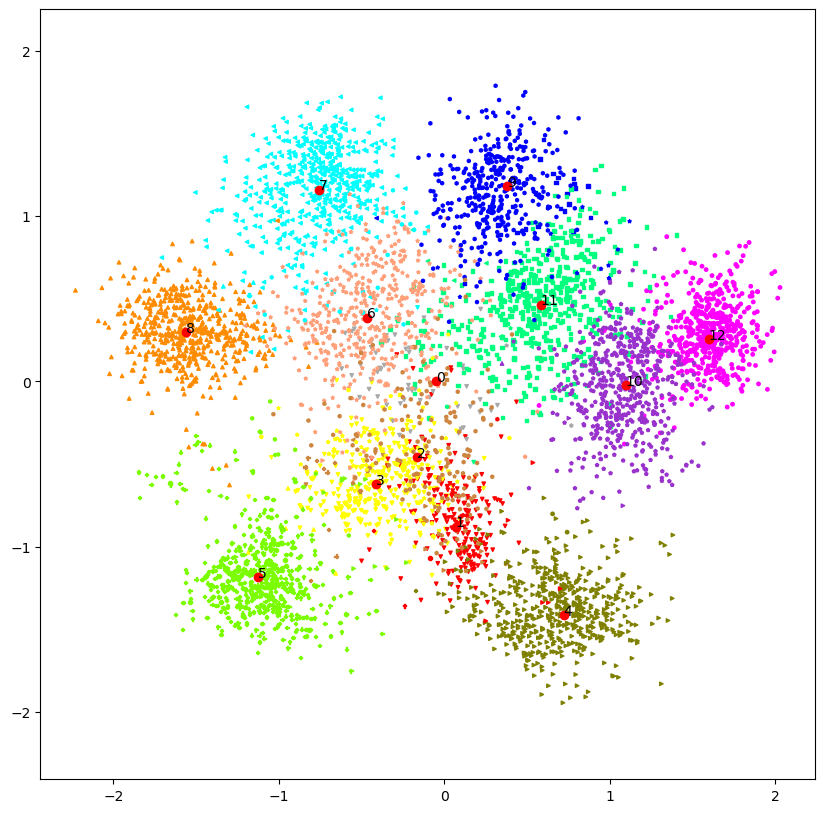

update dips and centers
max dip 0.006487893729579396  at  (2, 4)
NMI: 0.8840010058807133 (k=13)
AMI: 0.8835284310728555 (k=13)
21/30 cluster_loss: 0.016334 ae_loss:0.069126 dip loss: 0.000000 total_loss: 0.085460]
update dips and centers
max dip 0.00649183928069947  at  (2, 4)
NMI: 0.8841359488243256 (k=13)
AMI: 0.8836639192527707 (k=13)
22/30 cluster_loss: 0.015228 ae_loss:0.080575 dip loss: 0.000000 total_loss: 0.095802]


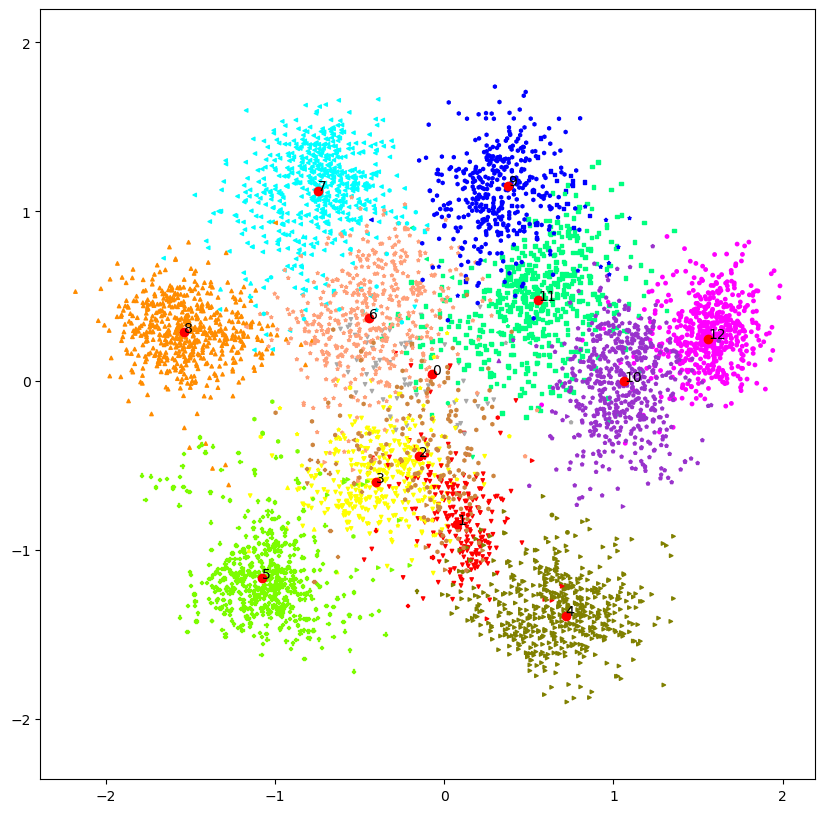

update dips and centers
max dip 0.0059571041287392835  at  (2, 4)
NMI: 0.884405982483739 (k=13)
AMI: 0.8839350586500866 (k=13)
23/30 cluster_loss: 0.017111 ae_loss:0.076412 dip loss: 0.000000 total_loss: 0.093523]
update dips and centers
max dip 0.00525092253038735  at  (2, 4)
NMI: 0.8849385438713371 (k=13)
AMI: 0.8844697836803513 (k=13)
24/30 cluster_loss: 0.017193 ae_loss:0.077032 dip loss: 0.000000 total_loss: 0.094226]


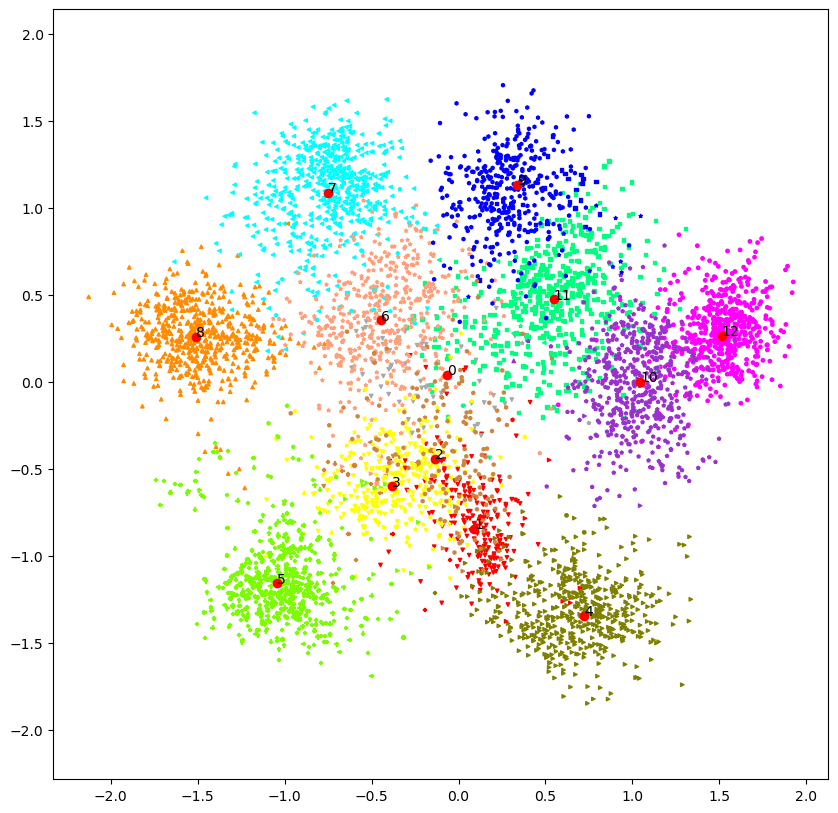

update dips and centers
max dip 0.00491934146635784  at  (2, 4)
NMI: 0.884405982483739 (k=13)
AMI: 0.8839350586500866 (k=13)
25/30 cluster_loss: 0.016164 ae_loss:0.079265 dip loss: 0.000000 total_loss: 0.095429]
update dips and centers
max dip 0.0041754695612282984  at  (0, 1)
NMI: 0.8849385438713371 (k=13)
AMI: 0.8844697836803513 (k=13)
26/30 cluster_loss: 0.014346 ae_loss:0.068409 dip loss: 0.000000 total_loss: 0.082754]


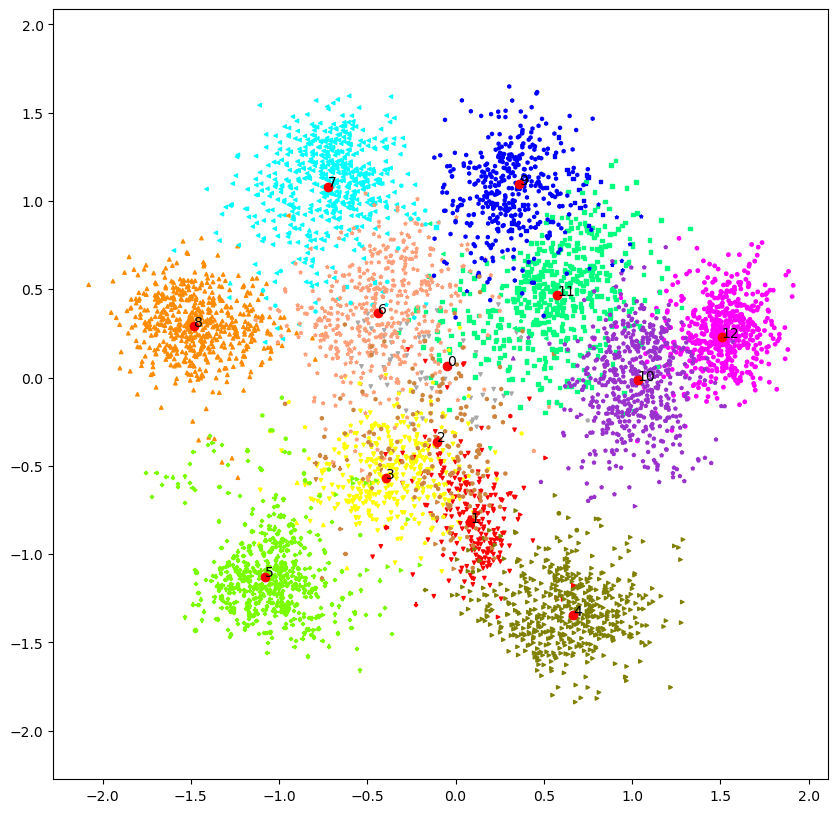

update dips and centers
max dip 0.004535551618725967  at  (2, 4)
NMI: 0.8858998626239497 (k=13)
AMI: 0.8854350208781175 (k=13)
27/30 cluster_loss: 0.016413 ae_loss:0.081641 dip loss: 0.000000 total_loss: 0.098054]
update dips and centers
max dip 0.004416347256142293  at  (2, 4)
NMI: 0.8856328765597985 (k=13)
AMI: 0.8851669688304559 (k=13)
28/30 cluster_loss: 0.014670 ae_loss:0.070054 dip loss: 0.000000 total_loss: 0.084724]


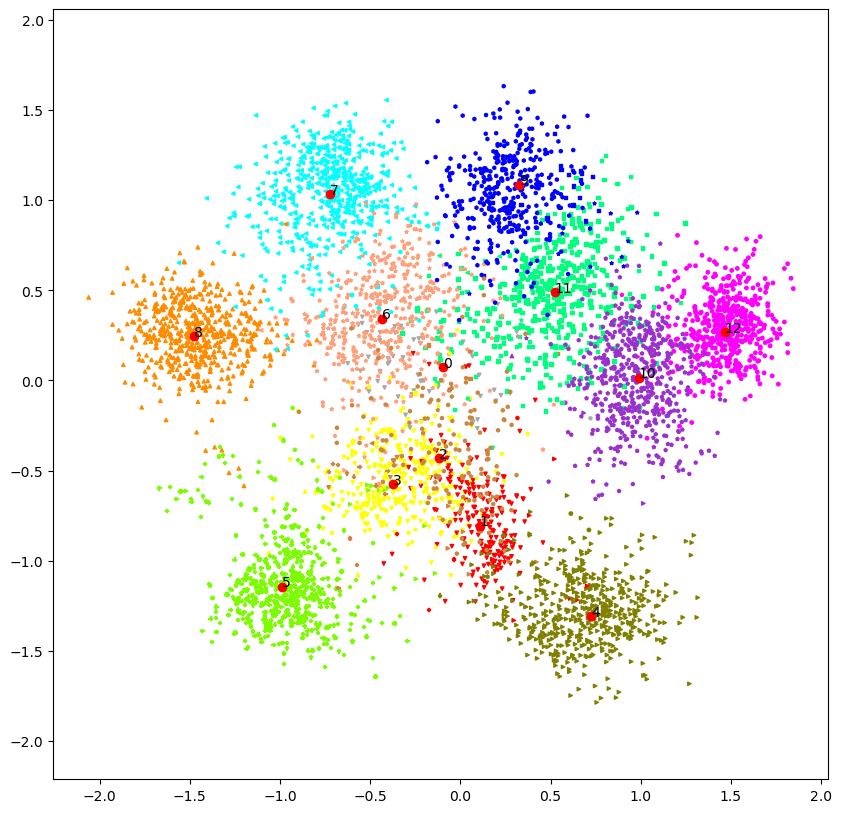

update dips and centers
max dip 0.003659741905755231  at  (0, 1)
NMI: 0.8858234397556152 (k=13)
AMI: 0.8853582937365144 (k=13)
29/30 cluster_loss: 0.015469 ae_loss:0.077598 dip loss: 0.000000 total_loss: 0.093067]
Training finished
NMI: 0.8858234397556152 (k=13)
AMI: 0.8853582937365144 (k=13)
30/30 cluster_loss: 0.015469 ae_loss:0.077598 dip loss: 0.000000 total_loss: 0.093067]


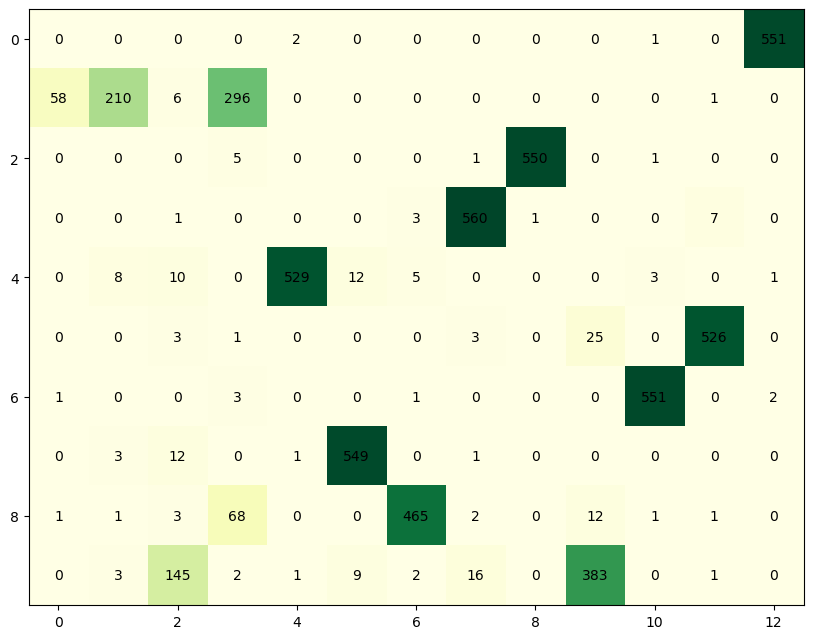

Confusion matrix:
 [[  0   0   0   0   2   0   0   0   0   0   1   0 551]
 [ 58 210   6 296   0   0   0   0   0   0   0   1   0]
 [  0   0   0   5   0   0   0   1 550   0   1   0   0]
 [  0   0   1   0   0   0   3 560   1   0   0   7   0]
 [  0   8  10   0 529  12   5   0   0   0   3   0   1]
 [  0   0   3   1   0   0   0   3   0  25   0 526   0]
 [  1   0   0   3   0   0   1   0   0   0 551   0   2]
 [  0   3  12   0   1 549   0   1   0   0   0   0   0]
 [  1   1   3  68   0   0 465   2   0  12   1   1   0]
 [  0   3 145   2   1   9   2  16   0 383   0   1   0]]


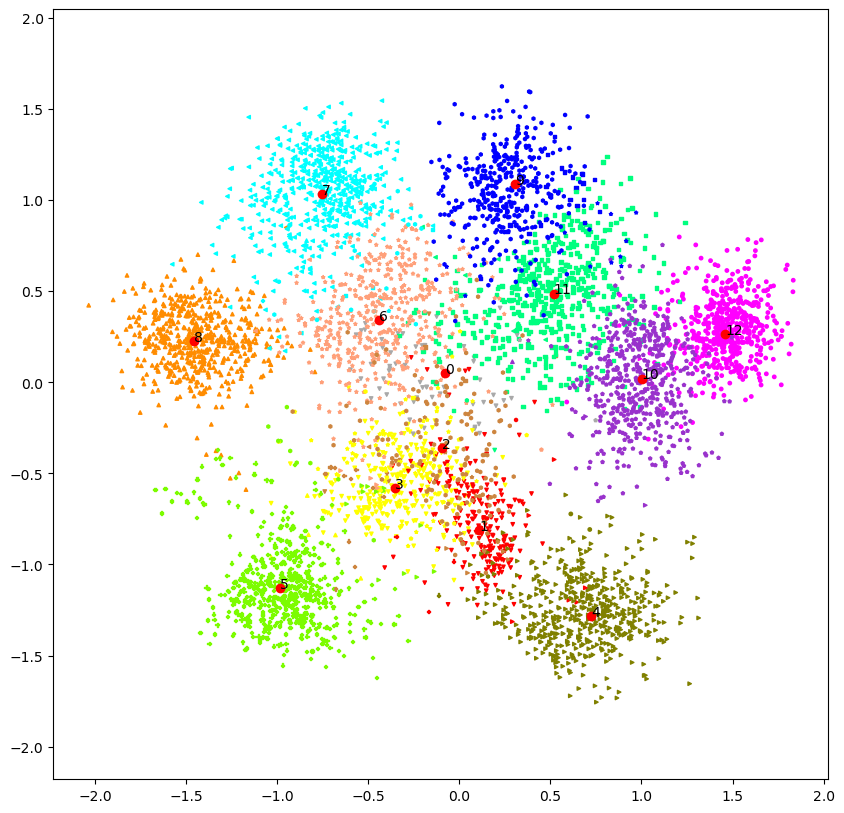

In [14]:
model = Autoencoder(input_dim=data.shape[1], embedding_size=embedded_space_dim)
# train and testloader
trainloader, testloader = get_train_and_testloader(data, gt_labels, batch_size)

#### The learning rate specifies the step size of the gradient descent algorithm
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

# Pretrain
print("=====> Start Pretrain <=====")
if do_pretrain:
    model = pretrain_model(device, model, data, trainloader, optimizer, loss_fn, pretrain_training_iterations)
#     model = pretrain_model_new(device, model, data, n_clusters, cluster_labels, gt_labels, trainloader, testloader, optimizer, loss_fn, centers_torch, dip_weights, dip_loss_weight, cluster_loss_weight, rec_loss_weight, pretrain_training_iterations)
else:
    model = load_pretrained_model(model)
# define optimizer
learning_rate *= 0.1
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

print("=====> Start Bumblebee <=====")
if do_bumblebee_train:
    model, cluster_labels, n_clusters_merge, centers_cpu = bumblebee_model(device, model, data, gt_labels, n_clusters, gt_n_clusters, trainloader, testloader, optimizer, loss_fn, dip_threshold, dip_loss_weight, cluster_loss_weight, rec_loss_weight, update_centers, clustering_training_iterations, update_pause_iterations, n_clusters_max=n_clusters_max, n_clusters_min=n_clusters_min, use_dist_to_merge_center=use_dist_to_merge_center, normalize_dip_columns = normalize_dip_columns) 
else:
    model = load_bumblebee_model(model)

3D Plot


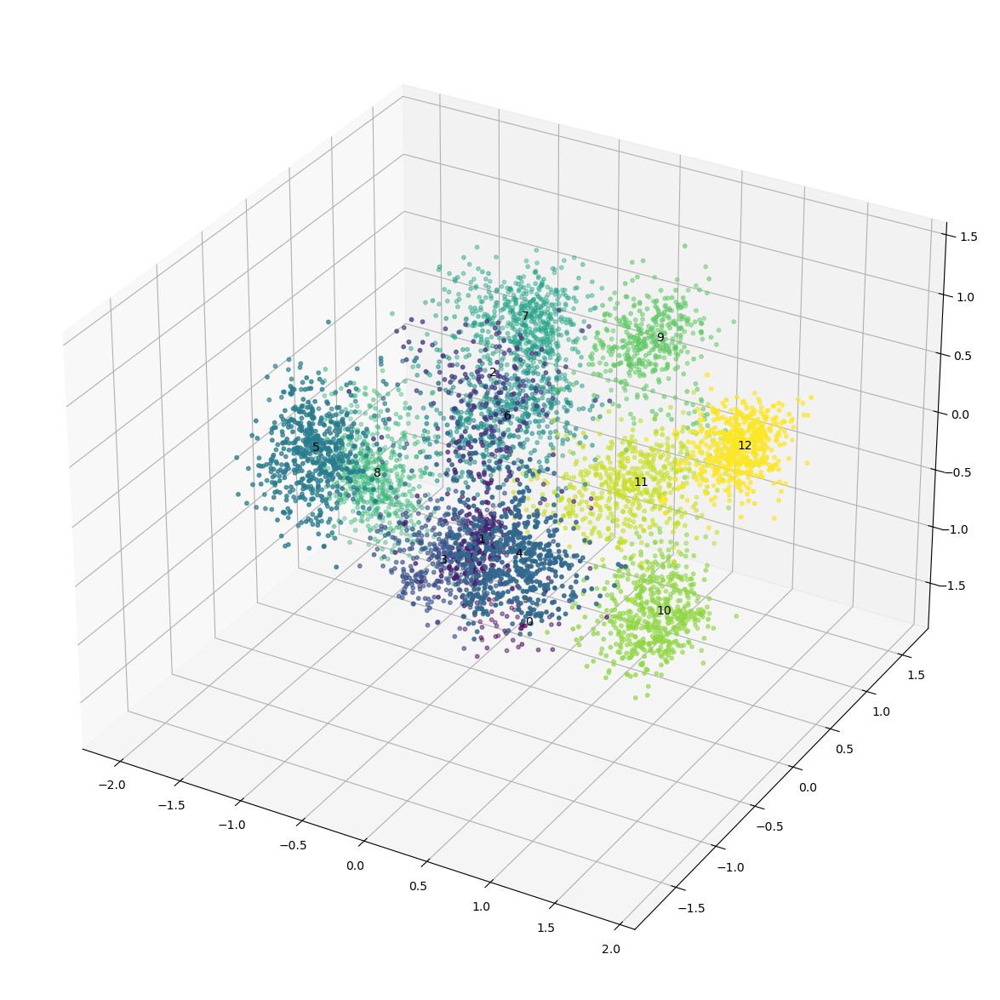

Cluster center 0


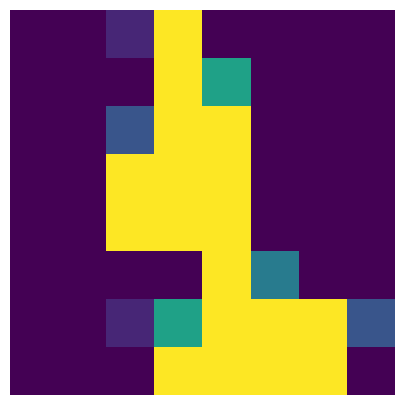

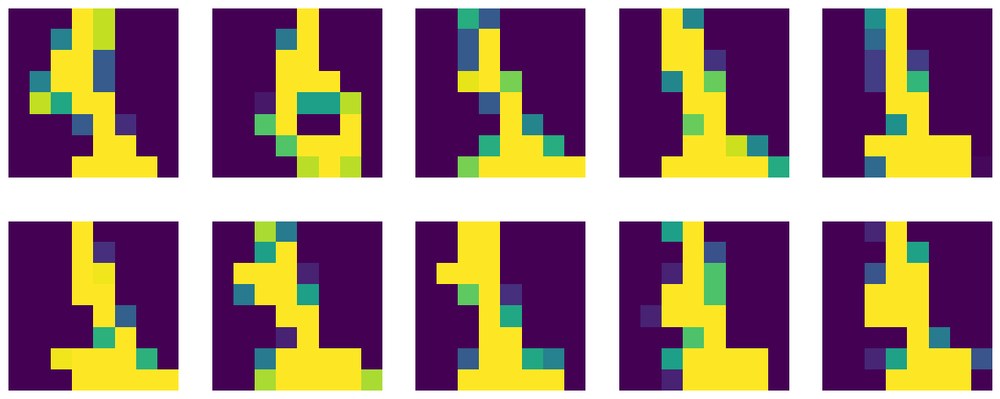

Cluster center 1


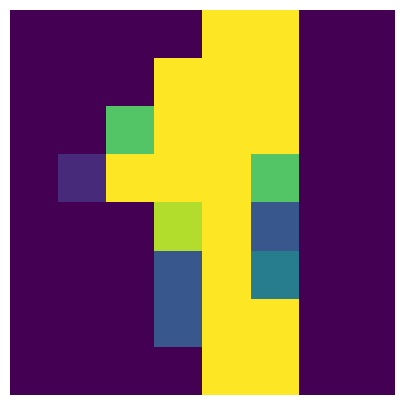

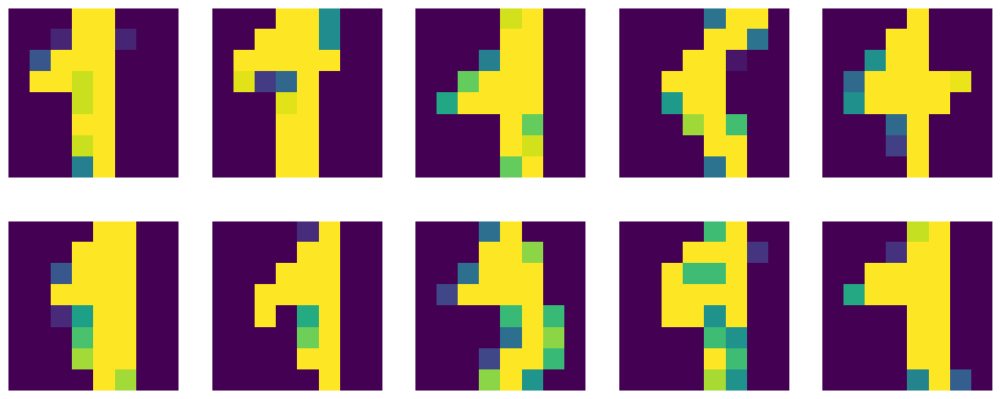

Cluster center 2


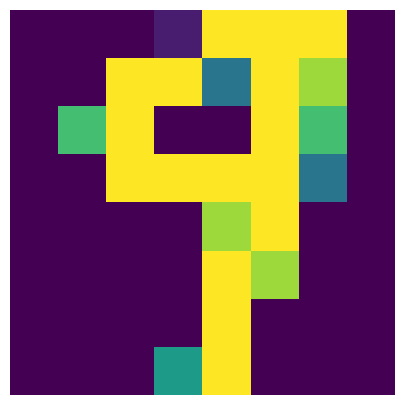

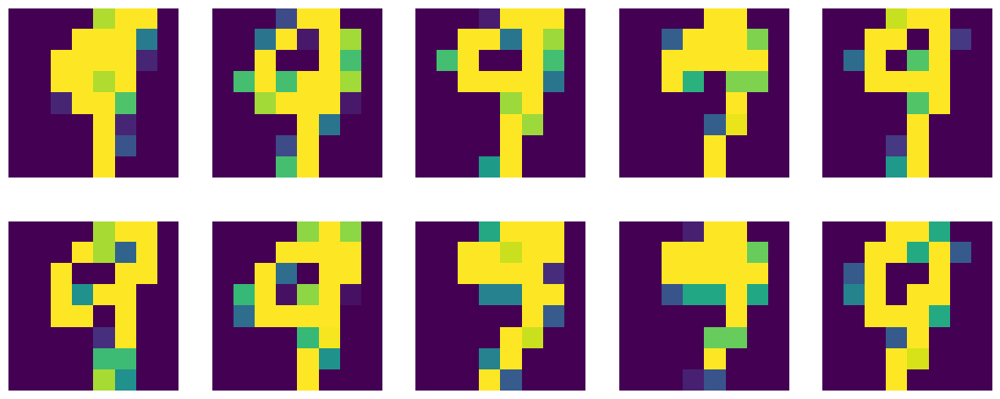

Cluster center 3


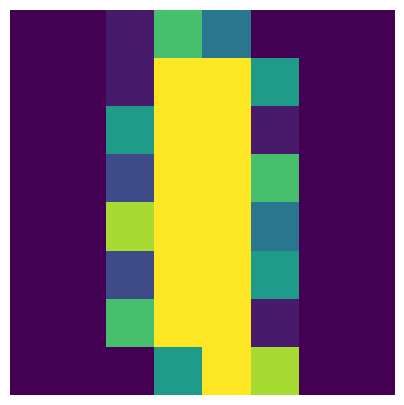

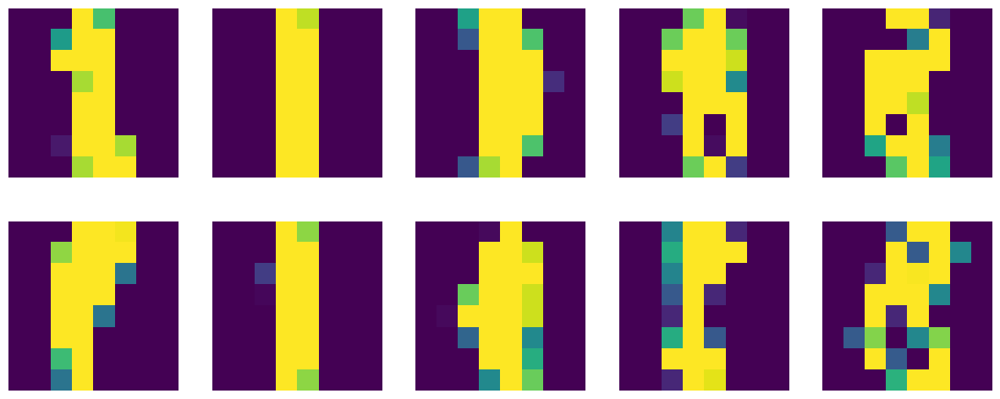

Cluster center 4


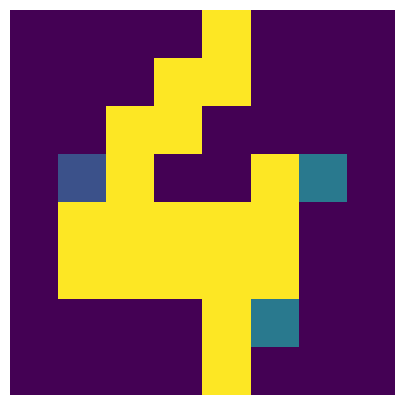

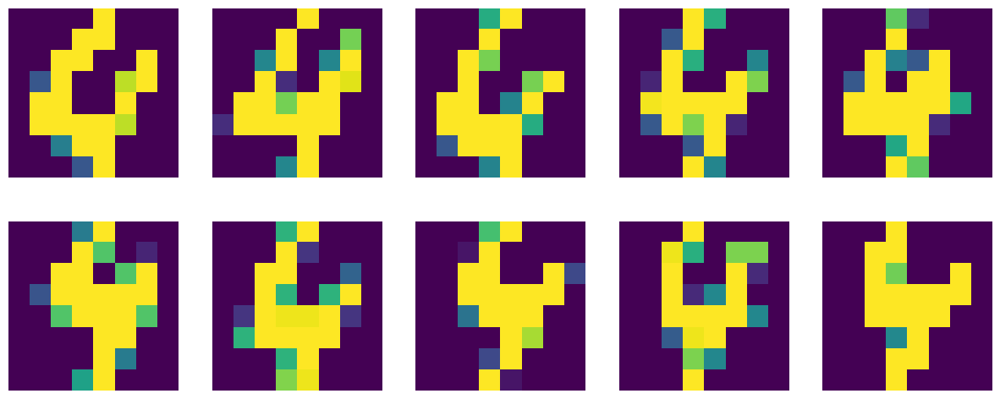

Cluster center 5


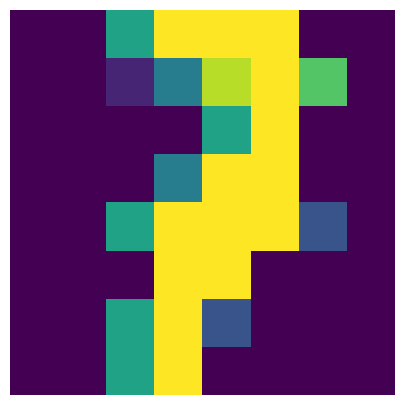

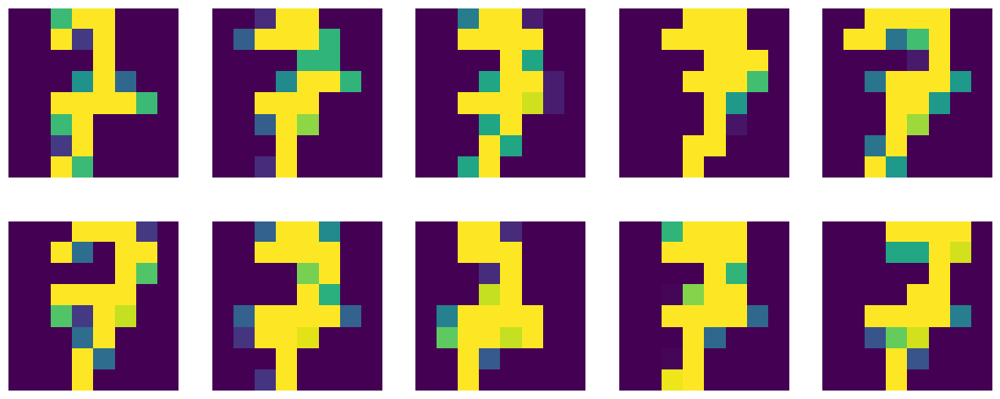

Cluster center 6


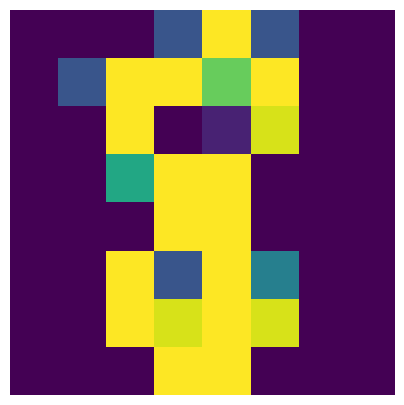

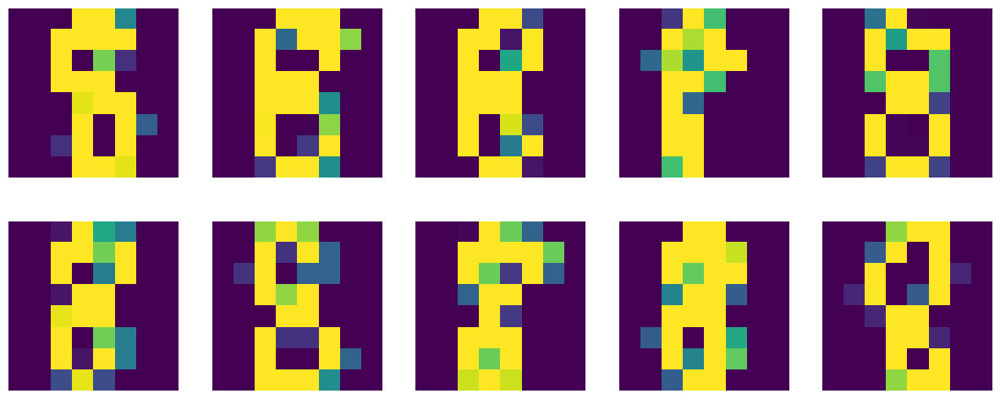

Cluster center 7


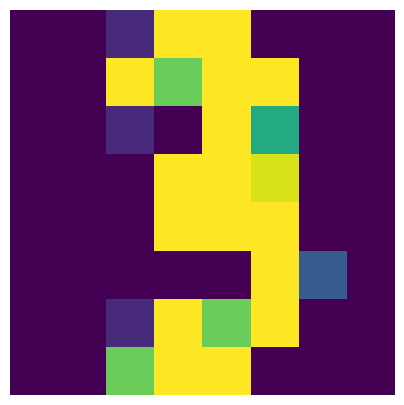

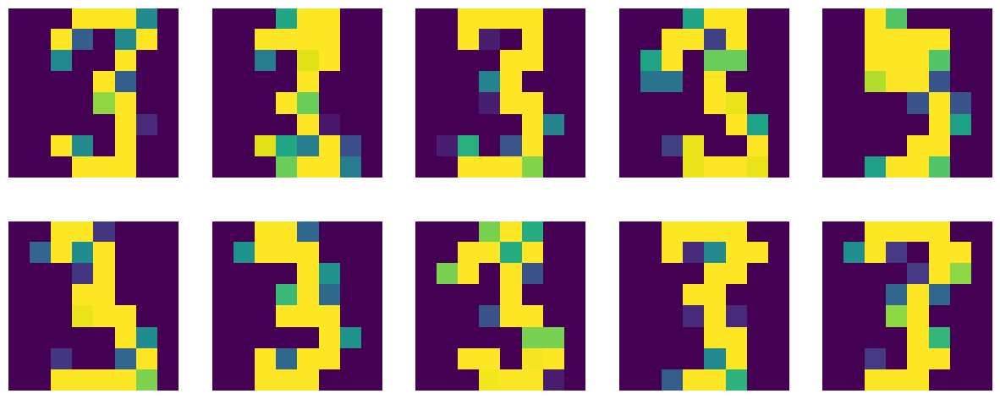

Cluster center 8


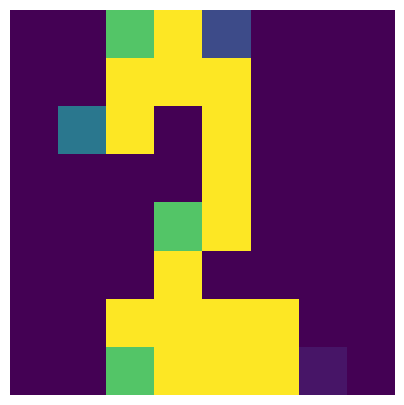

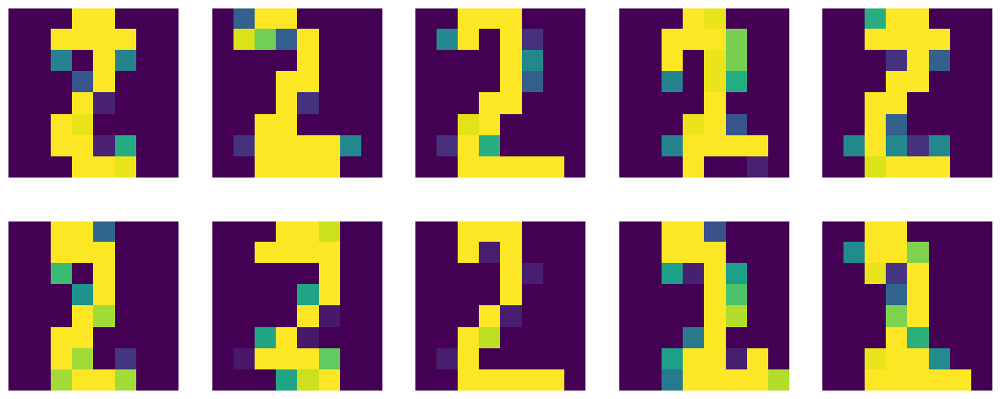

Cluster center 9


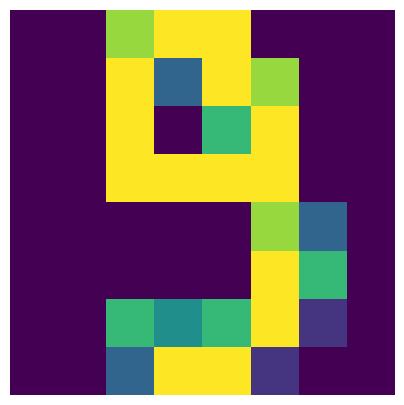

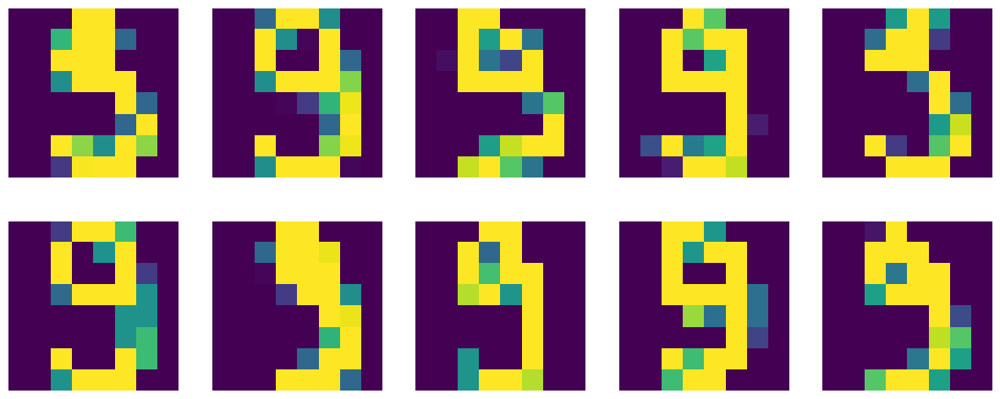

Cluster center 10


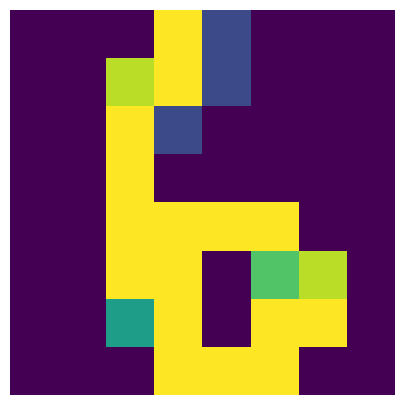

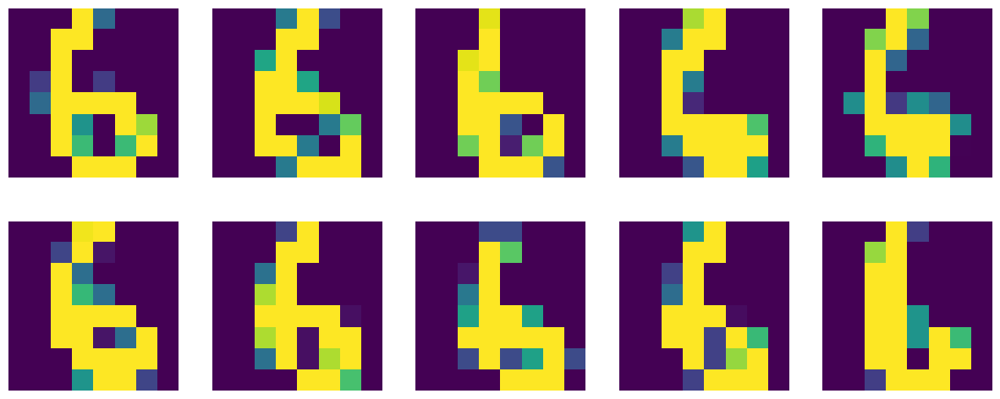

Cluster center 11


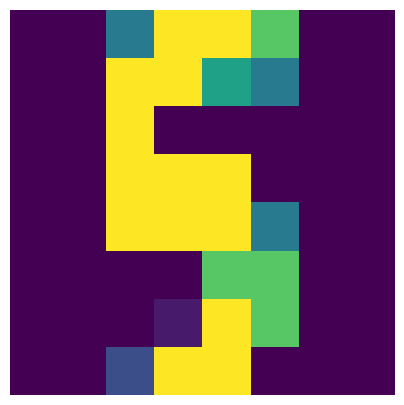

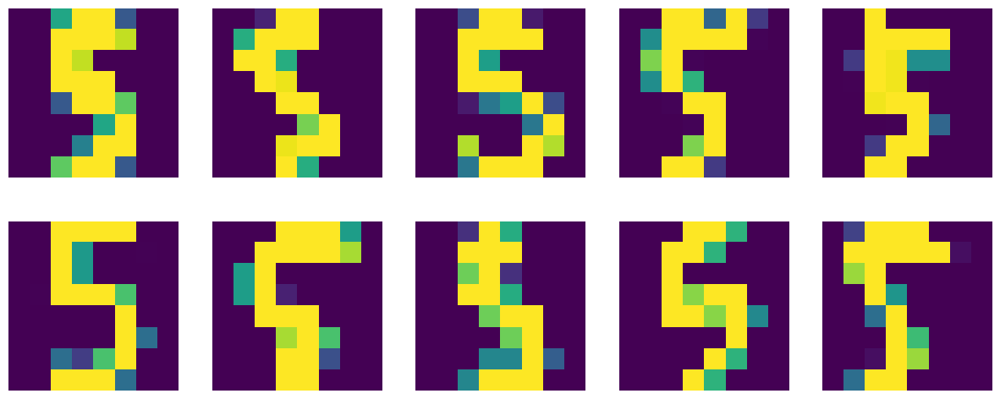

Cluster center 12


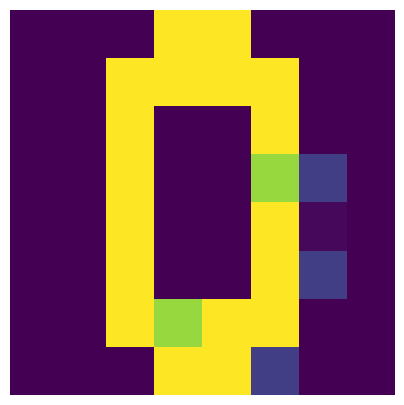

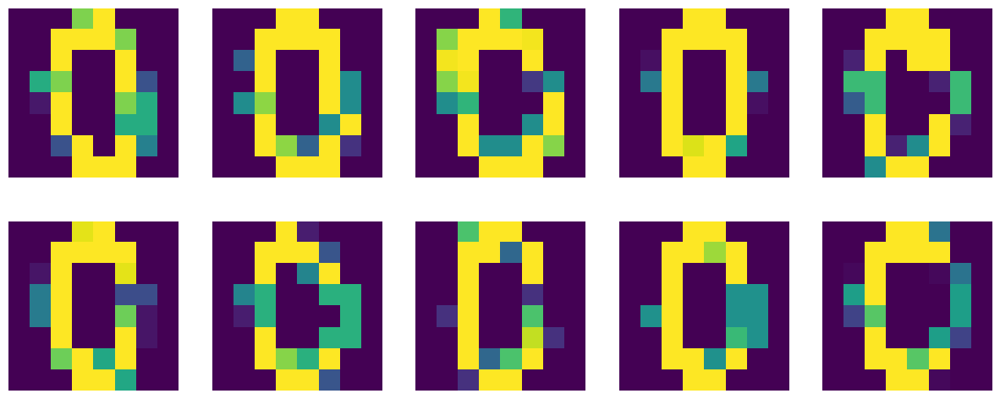

In [15]:
embedded_data = encode_batchwise(testloader, model, device)
centers_torch = torch.from_numpy(centers_cpu).float().to(device)
embedded_centers_cpu = model.encode(centers_torch).detach().cpu().numpy()
if embedded_space_dim > 2:
    plot_3d_dataset(embedded_data, cluster_labels, embedded_centers_cpu)
sqrt_of_data = int(math.sqrt(data.shape[1]))
if sqrt_of_data * sqrt_of_data == data.shape[1]:
#     best_center_points = np.argmin(cdist(centers_cpu, embedded_data), axis=1)
#     plot_centers = data.numpy()[best_center_points, :]
    for i in range(n_clusters_merge):
        print("Cluster center", i)
        img_data = centers_cpu[i].reshape((sqrt_of_data, sqrt_of_data))
        plt.figure(figsize=(5, 5))
        plt.imshow(img_data, vmin=0, vmax=1)
        plt.axis('off')
        plt.show()
        # Plot examples
        fig=plt.figure(figsize=(15, 6))
        ids_in_cluster = np.argwhere(cluster_labels == i).reshape(-1,)
        number_of_examples = min(10, len(ids_in_cluster))
        random_image_ids = np.random.choice(ids_in_cluster, number_of_examples, replace=False)
        for j, random_img_id in enumerate(random_image_ids):
            random_img = data.numpy()[random_img_id].reshape((sqrt_of_data, sqrt_of_data))
            fig.add_subplot(2, 5, j + 1)
            plt.imshow(random_img, vmin=0, vmax=1)
            plt.axis('off')
        plt.show()

In [ ]:
# c = torch.from_numpy(np.array([[1,2], [11,12],[101,102]])).float().to(device)
# l = torch.from_numpy(np.array([[0,1,0], [0,0,1], [1,0,0],[0,1,0]])).float().to(device)
# g = torch.from_numpy(np.array([[2, 3, 4]])).float().to(device)
# p = torch.from_numpy(np.array([[7,17], [8,18],[9,19], [6,16]])).float().to(device)
# weighted_c = c * torch.reshape(g,(-1,1))
# print(weighted_c)
# ordered_c = torch.matmul(l,weighted_c)
# print(ordered_c)
# combined_centers = (weighted_c.unsqueeze(0) + ordered_c.unsqueeze(1))
# print(combined_centers)
# ordered_g = torch.matmul(l,torch.reshape(g,(-1,1)))
# print(ordered_g)
# g_squared = ordered_g + g
# print(g_squared)
# matrix = combined_centers / g_squared.unsqueeze(2)
# print(matrix)
# test = (p.unsqueeze(1) - matrix).pow(2).sum(2)
# print(test)

In [ ]:
a = np.array([[0,1,2,3], [2,0,2,2], [4,4,0,4], [2,4,5,0]])
t = torch.from_numpy(a).float().to(device)
mask= (t!=0).nonzero()
print(mask)
b=a[mask[:,0], mask[:,1]].reshape((4,3))
print(b)
#b = t[]

Error = $$mean(\text{onehot-labels} \times \frac{\text{dips} + I_k}{\sum_{column}\text{dips}} * \text{squared-distances})$$

Punkt p in cluster c: $$1*||p-\mu_c||^2_2 + dip_{c,c_2} * ||p-(\mu_c + \mu_{c_2})/2||^2_2 + ...$$

Punkt p in cluster c: $$\frac{1*||p-\mu_c||^2_2 + dip_{c,c_2} * ||p-\mu_{c_2}||^2_2 + ...}{dip_{c,c_1} + dip_{c,c_2} + ...}$$

dip = $$\begin{pmatrix}
1 & 0.01 & 0.02 \\
0.01 & 1 & 0.9 \\
0.02 & 0.9 & 1
\end{pmatrix}$$

adjusteddip = $$\begin{pmatrix}
0.99 & 0.01 & 0.02 \\
0.005 & 0.5 & 0.45 \\
0.01 & 0.45 & 0.5
\end{pmatrix}$$

onehot = $$\begin{pmatrix}
1 & 0 & 0 \\
0 & 0 & 1 \\
0 & 0 & 1 \\
0 & 1 & 0
\end{pmatrix}$$

rela = onehot x adjusteddip = $$\begin{pmatrix}
0.99 & 0.01 & 0.02 \\
0.01 & 0.45 & 0.5 \\
0.01 & 0.45 & 0.5 \\
0.005 & 0.5 & 0.45
\end{pmatrix}$$

distances = $$\begin{pmatrix}
0.1 & 1.5 & 1 \\
1 & 0.2 & 0.1 \\
1 & 0.2 & 0.1 \\
1.5 & 0.1 & 0.4
\end{pmatrix}$$

distances * rela = $$\begin{pmatrix}
0.1 & 0.015 & 0.02 \\
0.01 & 0.09 & 0.05 \\
0.01 & 0.09 & 0.05 \\
0.0075 & 0.05 & 0.15
\end{pmatrix}$$

error = summe / 12 oder summe / 4